In [1]:
import numpy as np
import cv2
import scipy.io
import os
from numpy.linalg import norm
from matplotlib import pyplot as plt
from numpy.linalg import det
from numpy.linalg import inv
from scipy.linalg import rq
from numpy.linalg import svd
import matplotlib.pyplot as plt
import numpy as np
import math
import random
import sys
from scipy import ndimage, spatial
from tqdm.notebook import tqdm, trange

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.autograd import Variable
import torchvision
from torchvision import datasets, models, transforms
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from skimage import io, transform,data
from torchvision import transforms, utils
import numpy as np
import math
import glob
import matplotlib.pyplot as plt
import time
import os
import copy
import sklearn.svm
import cv2
from matplotlib import pyplot as plt
import numpy as np
from os.path import exists
import pandas as pd
import PIL
import random
from google.colab import drive
from sklearn.metrics.cluster import completeness_score
from sklearn.cluster import KMeans
from tqdm import tqdm, tqdm_notebook
from functools import partial
from torchsummary import summary
from torchvision.datasets import ImageFolder
from torch.utils.data.sampler import SubsetRandomSampler

In [2]:
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!pip install opencv-python==3.4.2.17
!pip install opencv-contrib-python==3.4.2.17

In [4]:
class Image:
    def __init__(self, img, position):
        
        self.img = img
        self.position = position

inlier_matchset = []
def features_matching(a,keypointlength,threshold):
  #threshold=0.2
  bestmatch=np.empty((keypointlength),dtype= np.int16)
  img1index=np.empty((keypointlength),dtype=np.int16)
  distance=np.empty((keypointlength))
  index=0
  for j in range(0,keypointlength):
    #For a descriptor fa in Ia, take the two closest descriptors fb1 and fb2 in Ib
    x=a[j]
    listx=x.tolist()
    x.sort()
    minval1=x[0]                                # min 
    minval2=x[1]                                # 2nd min
    itemindex1 = listx.index(minval1)           #index of min val    
    itemindex2 = listx.index(minval2)           #index of second min value 
    ratio=minval1/minval2                       #Ratio Test
    
    if ratio<threshold: 
      #Low distance ratio: fb1 can be a good match
      bestmatch[index]=itemindex1
      distance[index]=minval1
      img1index[index]=j
      index=index+1
  return  [cv2.DMatch(img1index[i],bestmatch[i].astype(int),distance[i]) for i in range(0,index)]
          
   
  
def compute_Homography(im1_pts,im2_pts):
  """
  im1_pts and im2_pts are 2×n matrices with
  4 point correspondences from the two images
  """
  num_matches=len(im1_pts)
  num_rows = 2 * num_matches
  num_cols = 9
  A_matrix_shape = (num_rows,num_cols)
  A = np.zeros(A_matrix_shape)
  a_index = 0
  for i in range(0,num_matches):
    (a_x, a_y) = im1_pts[i]
    (b_x, b_y) = im2_pts[i]
    row1 = [a_x, a_y, 1, 0, 0, 0, -b_x*a_x, -b_x*a_y, -b_x] # First row 
    row2 = [0, 0, 0, a_x, a_y, 1, -b_y*a_x, -b_y*a_y, -b_y] # Second row 

    # place the rows in the matrix
    A[a_index] = row1
    A[a_index+1] = row2

    a_index += 2
    
  U, s, Vt = np.linalg.svd(A)

  #s is a 1-D array of singular values sorted in descending order
  #U, Vt are unitary matrices
  #Rows of Vt are the eigenvectors of A^TA.
  #Columns of U are the eigenvectors of AA^T.
  H = np.eye(3)
  H = Vt[-1].reshape(3,3) # take the last row of the Vt matrix
  return H
  
  
def displayplot(img,title):
  
  plt.figure(figsize=(15,15))
  plt.title(title)
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()

In [5]:
def get_inliers(f1, f2, matches, H, RANSACthresh):

  inlier_indices = []
  for i in range(len(matches)):
    queryInd = matches[i].queryIdx
    trainInd = matches[i].trainIdx

    #queryInd = matches[i][0]
    #trainInd = matches[i][1]

    queryPoint = np.array([f1[queryInd].pt[0],  f1[queryInd].pt[1], 1]).T 
    trans_query = H.dot(queryPoint) 

   
    comp1 = [trans_query[0]/trans_query[2], trans_query[1]/trans_query[2]] # normalize with respect to z
    comp2 = np.array(f2[trainInd].pt)[:2]
    

    if(np.linalg.norm(comp1-comp2) <= RANSACthresh): # check against threshold
      inlier_indices.append(i)
  return inlier_indices


def RANSAC_alg(f1, f2, matches, nRANSAC, RANSACthresh):

      
    minMatches = 4
    nBest = 0
    best_inliers = []
    H_estimate = np.eye(3,3)
    global inlier_matchset
    inlier_matchset=[]
    for iteration in range(nRANSAC):
      
        #Choose a minimal set of feature matches.
        matchSample = random.sample(matches, minMatches)
        
        #Estimate the Homography implied by these matches
        im1_pts=np.empty((minMatches,2))
        im2_pts=np.empty((minMatches,2))
        for i in range(0,minMatches):
          m = matchSample[i]
          im1_pts[i] = f1[m.queryIdx].pt
          im2_pts[i] = f2[m.trainIdx].pt
          #im1_pts[i] = f1[m[0]].pt
          #im2_pts[i] = f2[m[1]].pt             
          
        H_estimate=compute_Homography(im1_pts,im2_pts)
        
               
        # Calculate the inliers for the H
        inliers = get_inliers(f1, f2, matches, H_estimate, RANSACthresh)

        # if the number of inliers is higher than previous iterations, update the best estimates
        if len(inliers) > nBest:
            nBest= len(inliers)
            best_inliers = inliers

    print("Number of best inliers",len(best_inliers))
    for i in range(len(best_inliers)):
      inlier_matchset.append(matches[best_inliers[i]])
    
    # compute a homography given this set of matches
    im1_pts=np.empty((len(best_inliers),2))
    im2_pts=np.empty((len(best_inliers),2))
    for i in range(0,len(best_inliers)):
      m = inlier_matchset[i]
      im1_pts[i] = f1[m.queryIdx].pt
      im2_pts[i] = f2[m.trainIdx].pt
      #im1_pts[i] = f1[m[0]].pt
      #im2_pts[i] = f2[m[1]].pt

    M=compute_Homography(im1_pts,im2_pts)
    return M, best_inliers

In [6]:
files_all=[]
for file in os.listdir("/content/drive/MyDrive/RGB-img/img"):
    if file.endswith(".JPG"):
      files_all.append(file)


files_all.sort()
folder_path = '/content/drive/MyDrive/RGB-img/img/'

centre_file = folder_path + files_all[15]
left_files_path_rev = []
right_files_path = []

for file in files_all[:51]:
  left_files_path_rev.append(folder_path + file)

left_files_path = left_files_path_rev[::-1]

for file in files_all[50:100]:
  right_files_path.append(folder_path + file)

In [7]:
from PIL.ExifTags import TAGS
from PIL.ExifTags import GPSTAGS
from PIL import Image
def get_exif(filename):
    image = Image.open(filename)
    image.verify()
    return image._getexif()
    
def get_labeled_exif(exif):
    labeled = {}
    for (key, val) in exif.items():
        labeled[TAGS.get(key)] = val

    return labeled


def get_geotagging(exif):
    if not exif:
        raise ValueError("No EXIF metadata found")

    geotagging = {}
    for (idx, tag) in TAGS.items():
        if tag == 'GPSInfo':
            if idx not in exif:
                raise ValueError("No EXIF geotagging found")

            for (key, val) in GPSTAGS.items():
                if key in exif[idx]:
                    geotagging[val] = exif[idx][key]
    return geotagging

def get_decimal_from_dms(dms, ref):

    degrees = dms[0][0] / dms[0][1]
    minutes = dms[1][0] / dms[1][1] / 60.0
    seconds = dms[2][0] / dms[2][1] / 3600.0

    if ref in ['S', 'W']:
        degrees = -degrees
        minutes = -minutes
        seconds = -seconds

    return round(degrees + minutes + seconds, 5)

def get_coordinates(geotags):
    lat = get_decimal_from_dms(geotags['GPSLatitude'], geotags['GPSLatitudeRef'])

    lon = get_decimal_from_dms(geotags['GPSLongitude'], geotags['GPSLongitudeRef'])

    return (lat,lon)

In [8]:
gridsize = 8
clahe = cv2.createCLAHE(clipLimit=2.0,tileGridSize=(gridsize,gridsize))

images_left_bgr = []
images_right_bgr = []

images_left = []
images_right = []

for file in tqdm(left_files_path):
  left_image_sat= cv2.imread(file)
  lab = cv2.cvtColor(left_image_sat, cv2.COLOR_BGR2LAB)
  lab[...,0] = clahe.apply(lab[...,0])
  left_image_sat = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
  left_img = cv2.resize(left_image_sat,None,fx=0.35, fy=0.35, interpolation = cv2.INTER_CUBIC)
  images_left.append(cv2.cvtColor(left_img, cv2.COLOR_BGR2GRAY).astype('float32')/255.)
  images_left_bgr.append(left_img)


for file in tqdm(right_files_path):
  right_image_sat= cv2.imread(file)
  lab = cv2.cvtColor(right_image_sat, cv2.COLOR_BGR2LAB)
  lab[...,0] = clahe.apply(lab[...,0])
  right_image_sat = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
  right_img = cv2.resize(right_image_sat,None,fx=0.35,fy=0.35, interpolation = cv2.INTER_CUBIC)
  images_right.append(cv2.cvtColor(right_img, cv2.COLOR_BGR2GRAY).astype('float32')/255.)
  images_right_bgr.append(right_img)

100%|██████████| 50/50 [00:58<00:00,  1.18s/it]


In [9]:
images_left_bgr_no_enhance = []
images_right_bgr_no_enhance = []


for file in tqdm(left_files_path):
  left_image_sat= cv2.imread(file)
  left_img = cv2.resize(left_image_sat,None,fx=0.35, fy=0.35, interpolation = cv2.INTER_CUBIC)
  images_left_bgr_no_enhance.append(left_img)


for file in tqdm(right_files_path):
  right_image_sat= cv2.imread(file)
  right_img = cv2.resize(right_image_sat,None,fx=0.35,fy=0.35, interpolation = cv2.INTER_CUBIC)
  images_right_bgr_no_enhance.append(right_img)

100%|██████████| 50/50 [00:22<00:00,  2.23it/s]


In [10]:
surf = cv2.xfeatures2d.SURF_create()
sift = cv2.xfeatures2d.SIFT_create()

keypoints_all_left_surfsift = []
descriptors_all_left_surfsift = []
points_all_left_surfsift=[]

keypoints_all_right_surfsift = []
descriptors_all_right_surfsift = []
points_all_right_surfsift=[]

for imgs in tqdm(images_left_bgr_no_enhance):
  kpt = surf.detect(imgs,None)
  kpt,descrip =  sift.compute(imgs, kpt)
  keypoints_all_left_surfsift.append(kpt)
  descriptors_all_left_surfsift.append(descrip)
  points_all_left_surfsift.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

for imgs in tqdm(images_right_bgr_no_enhance):
  kpt = surf.detect(imgs,None)
  kpt,descrip =  sift.compute(imgs, kpt)
  keypoints_all_right_surfsift.append(kpt)
  descriptors_all_right_surfsift.append(descrip)
  points_all_right_surfsift.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

100%|██████████| 50/50 [18:23<00:00, 22.06s/it]


In [12]:
#num_kps_sift = []
#num_kps_brisk = []
#num_kps_agast = []
#num_kps_kaze = []
#num_kps_akaze = []
#num_kps_orb = []
#num_kps_mser = []
#num_kps_daisy = []
num_kps_surfsift = []
#num_kps_fast = []
#num_kps_freak = []
#num_kps_gftt = []
#num_kps_star = []

#for j in tqdm(keypoints_all_left_sift + keypoints_all_right_sift):
#  num_kps_sift.append(len(j))

#for j in tqdm(keypoints_all_left_brisk + keypoints_all_right_brisk):
  #num_kps_brisk.append(len(j))

#for j in tqdm(keypoints_all_left_agast + keypoints_all_right_agast):
  #num_kps_agast.append(len(j))

#for j in tqdm(keypoints_all_left_kaze + keypoints_all_right_kaze):
 # num_kps_kaze.append(len(j))

#for j in tqdm(keypoints_all_left_akaze + keypoints_all_right_akaze):
  #num_kps_akaze.append(len(j))

#for j in tqdm(keypoints_all_left_orb + keypoints_all_right_orb):
  #num_kps_orb.append(len(j))

#for j in tqdm(keypoints_all_left_mser + keypoints_all_right_mser):
 # num_kps_mser.append(len(j))

#for j in tqdm(keypoints_all_left_daisy + keypoints_all_right_daisy):
#  num_kps_daisy.append(len(j))

for j in tqdm(keypoints_all_left_surfsift + keypoints_all_right_surfsift):
  num_kps_surfsift.append(len(j))

#for j in tqdm(keypoints_all_left_fast + keypoints_all_right_fast):
  #num_kps_fast.append(len(j))

#for j in tqdm(keypoints_all_left_freak + keypoints_all_right_freak):
  #num_kps_freak.append(len(j))

#for j in tqdm(keypoints_all_left_gftt + keypoints_all_right_gftt):
  #num_kps_gftt.append(len(j))

#for j in tqdm(keypoints_all_left_star + keypoints_all_right_star):
  #num_kps_star.append(len(j))

100%|██████████| 101/101 [00:00<00:00, 85580.75it/s]


In [13]:
def compute_homography_fast(matched_pts1, matched_pts2,thresh=4):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    cv2.RANSAC, ransacReprojThreshold =thresh)
    inliers = inliers.flatten()
    return H, inliers

In [14]:
def compute_homography_fast_other(matched_pts1, matched_pts2):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    0)
    inliers = inliers.flatten()
    return H, inliers

In [15]:
def get_Hmatrix(imgs,keypts,pts,descripts,ratio=0.8,thresh=4,disp=False):
  FLANN_INDEX_KDTREE = 2
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  #flann = cv2.BFMatcher()

  lff1 = np.float32(descripts[0])
  lff = np.float32(descripts[1])


  matches_lf1_lf = flann.knnMatch(lff1, lff, k=2)

  print("\nNumber of matches",len(matches_lf1_lf))

  matches_4 = []
  ratio = ratio
  # loop over the raw matches
  for m in matches_lf1_lf:
    # ensure the distance is within a certain ratio of each
    # other (i.e. Lowe’s ratio test)
    if len(m) == 2 and m[0].distance < m[1].distance * ratio:
        #matches_1.append((m[0].trainIdx, m[0].queryIdx))
        matches_4.append(m[0])

  print("Number of matches After Lowe's Ratio",len(matches_4))
  
  matches_idx = np.array([m.queryIdx for m in matches_4])
  imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
  matches_idx = np.array([m.trainIdx for m in matches_4])
  imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
  '''
  # Estimate homography 1
  #Compute H1
  # Estimate homography 1
  #Compute H1
  imm1_pts=np.empty((len(matches_4),2))
  imm2_pts=np.empty((len(matches_4),2))
  for i in range(0,len(matches_4)):
    m = matches_4[i]
    (a_x, a_y) = keypts[0][m.queryIdx].pt
    (b_x, b_y) = keypts[1][m.trainIdx].pt
    imm1_pts[i]=(a_x, a_y)
    imm2_pts[i]=(b_x, b_y)    
  H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  Hn, best_inliers=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1000, RANSACthresh=6)
  '''
  
  
  Hn,inliers = compute_homography_fast(imm1_pts,imm2_pts,thresh)  
  inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
  print("Number of Robust matches",len(inlier_matchset))
  print("\n")
  '''
  if len(inlier_matchset)<50:
    matches_4 = []
    ratio = 0.67
    # loop over the raw matches
    for m in matches_lf1_lf:
      # ensure the distance is within a certain ratio of each
      # other (i.e. Lowe’s ratio test)
      if len(m) == 2 and m[0].distance < m[1].distance * ratio:
          #matches_1.append((m[0].trainIdx, m[0].queryIdx))
          matches_4.append(m[0])
    print("Number of matches After Lowe's Ratio New",len(matches_4))
  
    matches_idx = np.array([m.queryIdx for m in matches_4])
    imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
    matches_idx = np.array([m.trainIdx for m in matches_4])
    imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
    Hn,inliers = compute_homography_fast_other(imm1_pts,imm2_pts)  
    inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
    print("Number of Robust matches New",len(inlier_matchset))
    print("\n")    
    '''
  #H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  #Hn=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1500, RANSACthresh=6)

  #global inlier_matchset   
  
  if disp==True:
    dispimg1=cv2.drawMatches(imgs[0], keypts[0], imgs[1], keypts[1], inlier_matchset, None,flags=2)
    displayplot(dispimg1,'Robust Matching between Reference Image and Right Image ')
  
  return Hn/Hn[2,2], len(matches_lf1_lf), len(inlier_matchset)

In [16]:
from functools import partial
from tqdm import tqdm
tqdm = partial(tqdm, position=0, leave=True)

In [17]:
print(left_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0053.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0052.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0051.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0050.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0049.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0048.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0047.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0046.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0045.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0044.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0043.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0042.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0041.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0040.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [18]:
print(right_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0055.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0056.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0057.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0058.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0059.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0060.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0061.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0062.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0065.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0066.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0067.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0068.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [19]:
H_left_surfsift = []
H_right_surfsift = []

num_matches_surfsift = []
num_good_matches_surfsift = []

for j in tqdm(range(len(images_left))):
  if j==len(images_left)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_left_bgr[j:j+2][::-1],keypoints_all_left_surfsift[j:j+2][::-1],points_all_left_surfsift[j:j+2][::-1],descriptors_all_left_surfsift[j:j+2][::-1])
  H_left_surfsift.append(H_a)
  num_matches_surfsift.append(matches)
  num_good_matches_surfsift.append(gd_matches)

for j in tqdm(range(len(images_right))):
  if j==len(images_right)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_right_bgr[j:j+2][::-1],keypoints_all_right_surfsift[j:j+2][::-1],points_all_right_surfsift[j:j+2][::-1],descriptors_all_right_surfsift[j:j+2][::-1])
  H_right_surfsift.append(H_a)
  num_matches_surfsift.append(matches)
  num_good_matches_surfsift.append(gd_matches)

  2%|▏         | 1/51 [00:05<04:56,  5.93s/it]


Number of matches 25112
Number of matches After Lowe's Ratio 2910
Number of Robust matches 1086




  4%|▍         | 2/51 [00:11<04:41,  5.75s/it]


Number of matches 29686
Number of matches After Lowe's Ratio 5241
Number of Robust matches 2230




  6%|▌         | 3/51 [00:17<04:36,  5.75s/it]


Number of matches 23395
Number of matches After Lowe's Ratio 2682
Number of Robust matches 1094




  8%|▊         | 4/51 [00:21<04:19,  5.52s/it]


Number of matches 27431
Number of matches After Lowe's Ratio 5898
Number of Robust matches 2995




 10%|▉         | 5/51 [00:27<04:13,  5.50s/it]


Number of matches 27034
Number of matches After Lowe's Ratio 5858
Number of Robust matches 2716




 12%|█▏        | 6/51 [00:33<04:12,  5.61s/it]


Number of matches 29867
Number of matches After Lowe's Ratio 5528
Number of Robust matches 2582




 14%|█▎        | 7/51 [00:39<04:15,  5.81s/it]


Number of matches 31522
Number of matches After Lowe's Ratio 9143
Number of Robust matches 5327




 16%|█▌        | 8/51 [00:46<04:22,  6.11s/it]


Number of matches 30097
Number of matches After Lowe's Ratio 6965
Number of Robust matches 3957




 18%|█▊        | 9/51 [00:52<04:20,  6.19s/it]


Number of matches 30110
Number of matches After Lowe's Ratio 7511
Number of Robust matches 4037




 20%|█▉        | 10/51 [00:59<04:17,  6.29s/it]


Number of matches 29782
Number of matches After Lowe's Ratio 7361
Number of Robust matches 4416




 22%|██▏       | 11/51 [01:05<04:14,  6.36s/it]


Number of matches 29162
Number of matches After Lowe's Ratio 7845
Number of Robust matches 5194




 24%|██▎       | 12/51 [01:12<04:06,  6.33s/it]


Number of matches 28941
Number of matches After Lowe's Ratio 8959
Number of Robust matches 5282




 25%|██▌       | 13/51 [01:18<04:01,  6.34s/it]


Number of matches 29718
Number of matches After Lowe's Ratio 7700
Number of Robust matches 4367




 27%|██▋       | 14/51 [01:24<03:56,  6.40s/it]


Number of matches 29774
Number of matches After Lowe's Ratio 6867
Number of Robust matches 2820




 29%|██▉       | 15/51 [01:31<03:50,  6.39s/it]


Number of matches 28465
Number of matches After Lowe's Ratio 7458
Number of Robust matches 4041




 31%|███▏      | 16/51 [01:37<03:39,  6.26s/it]


Number of matches 28901
Number of matches After Lowe's Ratio 6849
Number of Robust matches 2904




 33%|███▎      | 17/51 [01:43<03:30,  6.20s/it]


Number of matches 29317
Number of matches After Lowe's Ratio 6474
Number of Robust matches 3169




 35%|███▌      | 18/51 [01:49<03:27,  6.29s/it]


Number of matches 32274
Number of matches After Lowe's Ratio 4653
Number of Robust matches 1607




 37%|███▋      | 19/51 [01:56<03:24,  6.40s/it]


Number of matches 29333
Number of matches After Lowe's Ratio 5006
Number of Robust matches 1583




 39%|███▉      | 20/51 [02:02<03:17,  6.36s/it]


Number of matches 28791
Number of matches After Lowe's Ratio 5744
Number of Robust matches 1855




 41%|████      | 21/51 [02:09<03:14,  6.47s/it]


Number of matches 31214
Number of matches After Lowe's Ratio 5779
Number of Robust matches 1605




 43%|████▎     | 22/51 [02:15<03:07,  6.47s/it]


Number of matches 28464
Number of matches After Lowe's Ratio 3346
Number of Robust matches 1017




 45%|████▌     | 23/51 [02:22<02:59,  6.41s/it]


Number of matches 29409
Number of matches After Lowe's Ratio 5117
Number of Robust matches 1869




 47%|████▋     | 24/51 [02:28<02:51,  6.36s/it]


Number of matches 27445
Number of matches After Lowe's Ratio 2659
Number of Robust matches 914




 49%|████▉     | 25/51 [02:34<02:39,  6.15s/it]


Number of matches 26763
Number of matches After Lowe's Ratio 1071
Number of Robust matches 250




 51%|█████     | 26/51 [02:39<02:29,  5.99s/it]


Number of matches 27227
Number of matches After Lowe's Ratio 5160
Number of Robust matches 2259




 53%|█████▎    | 27/51 [02:45<02:20,  5.87s/it]


Number of matches 26057
Number of matches After Lowe's Ratio 6124
Number of Robust matches 2756




 55%|█████▍    | 28/51 [02:50<02:11,  5.73s/it]


Number of matches 27493
Number of matches After Lowe's Ratio 5490
Number of Robust matches 2500




 57%|█████▋    | 29/51 [02:56<02:07,  5.81s/it]


Number of matches 28655
Number of matches After Lowe's Ratio 6420
Number of Robust matches 2775




 59%|█████▉    | 30/51 [03:02<02:04,  5.93s/it]


Number of matches 31224
Number of matches After Lowe's Ratio 4849
Number of Robust matches 1735




 61%|██████    | 31/51 [03:10<02:05,  6.30s/it]


Number of matches 32243
Number of matches After Lowe's Ratio 5591
Number of Robust matches 1551




 63%|██████▎   | 32/51 [03:17<02:02,  6.47s/it]


Number of matches 31404
Number of matches After Lowe's Ratio 5012
Number of Robust matches 1732




 65%|██████▍   | 33/51 [03:24<02:01,  6.75s/it]


Number of matches 29941
Number of matches After Lowe's Ratio 6526
Number of Robust matches 2585




 67%|██████▋   | 34/51 [03:31<01:55,  6.82s/it]


Number of matches 29731
Number of matches After Lowe's Ratio 6900
Number of Robust matches 3651




 69%|██████▊   | 35/51 [03:38<01:48,  6.80s/it]


Number of matches 29003
Number of matches After Lowe's Ratio 7201
Number of Robust matches 3484




 71%|███████   | 36/51 [03:45<01:42,  6.87s/it]


Number of matches 29540
Number of matches After Lowe's Ratio 8451
Number of Robust matches 4762




 73%|███████▎  | 37/51 [03:52<01:36,  6.91s/it]


Number of matches 30714
Number of matches After Lowe's Ratio 7789
Number of Robust matches 3726




 75%|███████▍  | 38/51 [03:59<01:32,  7.10s/it]


Number of matches 31999
Number of matches After Lowe's Ratio 8185
Number of Robust matches 4047




 76%|███████▋  | 39/51 [04:07<01:27,  7.25s/it]


Number of matches 31349
Number of matches After Lowe's Ratio 8480
Number of Robust matches 3943




 78%|███████▊  | 40/51 [04:14<01:21,  7.37s/it]


Number of matches 31491
Number of matches After Lowe's Ratio 7635
Number of Robust matches 3386




 80%|████████  | 41/51 [04:22<01:13,  7.33s/it]


Number of matches 29793
Number of matches After Lowe's Ratio 4691
Number of Robust matches 2396




 82%|████████▏ | 42/51 [04:29<01:05,  7.25s/it]


Number of matches 28686
Number of matches After Lowe's Ratio 8522
Number of Robust matches 5033




 84%|████████▍ | 43/51 [04:36<00:57,  7.15s/it]


Number of matches 29518
Number of matches After Lowe's Ratio 8943
Number of Robust matches 5436




 86%|████████▋ | 44/51 [04:42<00:47,  6.86s/it]


Number of matches 27220
Number of matches After Lowe's Ratio 5383
Number of Robust matches 2970




 88%|████████▊ | 45/51 [04:48<00:39,  6.53s/it]


Number of matches 27631
Number of matches After Lowe's Ratio 5545
Number of Robust matches 2937




 90%|█████████ | 46/51 [04:53<00:31,  6.30s/it]


Number of matches 28608
Number of matches After Lowe's Ratio 7404
Number of Robust matches 3942




 92%|█████████▏| 47/51 [04:59<00:24,  6.22s/it]


Number of matches 27793
Number of matches After Lowe's Ratio 5370
Number of Robust matches 2457




 94%|█████████▍| 48/51 [05:05<00:18,  6.15s/it]


Number of matches 26647
Number of matches After Lowe's Ratio 5658
Number of Robust matches 2576




 96%|█████████▌| 49/51 [05:11<00:12,  6.02s/it]


Number of matches 27094
Number of matches After Lowe's Ratio 4980
Number of Robust matches 2049




  0%|          | 0/50 [00:00<?, ?it/s]


Number of matches 28791
Number of matches After Lowe's Ratio 448
Number of Robust matches 71




  2%|▏         | 1/50 [00:06<05:16,  6.45s/it]


Number of matches 28159
Number of matches After Lowe's Ratio 6051
Number of Robust matches 2332




  4%|▍         | 2/50 [00:12<05:05,  6.37s/it]


Number of matches 28292
Number of matches After Lowe's Ratio 5729
Number of Robust matches 2107




  6%|▌         | 3/50 [00:19<05:00,  6.39s/it]


Number of matches 30574
Number of matches After Lowe's Ratio 6084
Number of Robust matches 2335




  8%|▊         | 4/50 [00:25<04:56,  6.44s/it]


Number of matches 28470
Number of matches After Lowe's Ratio 5730
Number of Robust matches 2284




 10%|█         | 5/50 [00:32<04:52,  6.50s/it]


Number of matches 31803
Number of matches After Lowe's Ratio 727
Number of Robust matches 159




 12%|█▏        | 6/50 [00:39<04:50,  6.60s/it]


Number of matches 29759
Number of matches After Lowe's Ratio 2720
Number of Robust matches 771




 14%|█▍        | 7/50 [00:46<04:49,  6.74s/it]


Number of matches 30765
Number of matches After Lowe's Ratio 3215
Number of Robust matches 1049




 16%|█▌        | 8/50 [00:53<04:48,  6.86s/it]


Number of matches 29394
Number of matches After Lowe's Ratio 3447
Number of Robust matches 1633




 18%|█▊        | 9/50 [01:00<04:45,  6.97s/it]


Number of matches 30994
Number of matches After Lowe's Ratio 5698
Number of Robust matches 3129




 20%|██        | 10/50 [01:07<04:39,  6.98s/it]


Number of matches 27439
Number of matches After Lowe's Ratio 5489
Number of Robust matches 2738




 22%|██▏       | 11/50 [01:13<04:22,  6.72s/it]


Number of matches 22006
Number of matches After Lowe's Ratio 2747
Number of Robust matches 1297




 24%|██▍       | 12/50 [01:18<03:59,  6.30s/it]


Number of matches 25745
Number of matches After Lowe's Ratio 1724
Number of Robust matches 842




 26%|██▌       | 13/50 [01:24<03:47,  6.14s/it]


Number of matches 23382
Number of matches After Lowe's Ratio 5766
Number of Robust matches 2733




 28%|██▊       | 14/50 [01:30<03:41,  6.16s/it]


Number of matches 32804
Number of matches After Lowe's Ratio 3422
Number of Robust matches 1952




 30%|███       | 15/50 [01:38<03:53,  6.69s/it]


Number of matches 30475
Number of matches After Lowe's Ratio 10397
Number of Robust matches 5462



Number of matches 32449
Number of matches After Lowe's Ratio 10479


 32%|███▏      | 16/50 [01:46<03:58,  7.02s/it]

Number of Robust matches 5549




 34%|███▍      | 17/50 [01:54<03:59,  7.26s/it]


Number of matches 28137
Number of matches After Lowe's Ratio 7898
Number of Robust matches 5017




 36%|███▌      | 18/50 [02:01<03:49,  7.18s/it]


Number of matches 28712
Number of matches After Lowe's Ratio 8545
Number of Robust matches 5247



Number of matches 27853
Number of matches After Lowe's Ratio 5965
Number of Robust matches 3250




 40%|████      | 20/50 [02:15<03:31,  7.04s/it]


Number of matches 29532
Number of matches After Lowe's Ratio 7873
Number of Robust matches 3561




 42%|████▏     | 21/50 [02:22<03:26,  7.13s/it]


Number of matches 30289
Number of matches After Lowe's Ratio 7590
Number of Robust matches 3702




 44%|████▍     | 22/50 [02:30<03:22,  7.22s/it]


Number of matches 31517
Number of matches After Lowe's Ratio 8602
Number of Robust matches 3385




 46%|████▌     | 23/50 [02:37<03:16,  7.29s/it]


Number of matches 30146
Number of matches After Lowe's Ratio 7814
Number of Robust matches 3123




 48%|████▊     | 24/50 [02:44<03:08,  7.26s/it]


Number of matches 31185
Number of matches After Lowe's Ratio 8921
Number of Robust matches 3323



Number of matches 32266
Number of matches After Lowe's Ratio 7894


 50%|█████     | 25/50 [02:52<03:06,  7.45s/it]

Number of Robust matches 3010




 52%|█████▏    | 26/50 [03:00<03:00,  7.51s/it]


Number of matches 31322
Number of matches After Lowe's Ratio 9628
Number of Robust matches 3001




 54%|█████▍    | 27/50 [03:07<02:49,  7.38s/it]


Number of matches 27735
Number of matches After Lowe's Ratio 7553
Number of Robust matches 2323




 56%|█████▌    | 28/50 [03:13<02:35,  7.08s/it]


Number of matches 30089
Number of matches After Lowe's Ratio 7632
Number of Robust matches 2582




 58%|█████▊    | 29/50 [03:20<02:25,  6.91s/it]


Number of matches 27897
Number of matches After Lowe's Ratio 5926
Number of Robust matches 2517




 60%|██████    | 30/50 [03:26<02:15,  6.79s/it]


Number of matches 32011
Number of matches After Lowe's Ratio 1814
Number of Robust matches 533




 62%|██████▏   | 31/50 [03:34<02:13,  7.04s/it]


Number of matches 30610
Number of matches After Lowe's Ratio 4036
Number of Robust matches 1087




 64%|██████▍   | 32/50 [03:41<02:09,  7.18s/it]


Number of matches 34036
Number of matches After Lowe's Ratio 99
Number of Robust matches 13




 66%|██████▌   | 33/50 [03:50<02:07,  7.51s/it]


Number of matches 31567
Number of matches After Lowe's Ratio 3522
Number of Robust matches 996




 68%|██████▊   | 34/50 [03:57<01:59,  7.49s/it]


Number of matches 29422
Number of matches After Lowe's Ratio 7218
Number of Robust matches 2425




 70%|███████   | 35/50 [04:04<01:49,  7.27s/it]


Number of matches 28350
Number of matches After Lowe's Ratio 6064
Number of Robust matches 2324




 72%|███████▏  | 36/50 [04:10<01:38,  7.03s/it]


Number of matches 28706
Number of matches After Lowe's Ratio 5676
Number of Robust matches 1843




 74%|███████▍  | 37/50 [04:17<01:31,  7.03s/it]


Number of matches 32873
Number of matches After Lowe's Ratio 5394
Number of Robust matches 1377




 76%|███████▌  | 38/50 [04:26<01:28,  7.37s/it]


Number of matches 33122
Number of matches After Lowe's Ratio 5826
Number of Robust matches 1773




 78%|███████▊  | 39/50 [04:33<01:22,  7.52s/it]


Number of matches 32633
Number of matches After Lowe's Ratio 9333
Number of Robust matches 3409




 80%|████████  | 40/50 [04:41<01:16,  7.65s/it]


Number of matches 29972
Number of matches After Lowe's Ratio 5373
Number of Robust matches 2122




 82%|████████▏ | 41/50 [04:48<01:06,  7.40s/it]


Number of matches 27587
Number of matches After Lowe's Ratio 7288
Number of Robust matches 2345




 84%|████████▍ | 42/50 [04:55<00:57,  7.17s/it]


Number of matches 28008
Number of matches After Lowe's Ratio 6551
Number of Robust matches 2887




 86%|████████▌ | 43/50 [05:02<00:49,  7.03s/it]


Number of matches 26930
Number of matches After Lowe's Ratio 5046
Number of Robust matches 1793




 88%|████████▊ | 44/50 [05:08<00:40,  6.79s/it]


Number of matches 26784
Number of matches After Lowe's Ratio 3598
Number of Robust matches 1910




 90%|█████████ | 45/50 [05:14<00:33,  6.69s/it]


Number of matches 27835
Number of matches After Lowe's Ratio 5397
Number of Robust matches 3122




 92%|█████████▏| 46/50 [05:21<00:26,  6.62s/it]


Number of matches 26661
Number of matches After Lowe's Ratio 5269
Number of Robust matches 2701




 94%|█████████▍| 47/50 [05:27<00:19,  6.49s/it]


Number of matches 25077
Number of matches After Lowe's Ratio 8504
Number of Robust matches 4771




 96%|█████████▌| 48/50 [05:33<00:12,  6.39s/it]


Number of matches 27970
Number of matches After Lowe's Ratio 5404
Number of Robust matches 2327




 98%|█████████▊| 49/50 [05:40<00:06,  6.46s/it]


Number of matches 27675
Number of matches After Lowe's Ratio 10277
Number of Robust matches 5656




In [20]:
def warpnImages(images_left, images_right,H_left,H_right):
    #img1-centre,img2-left,img3-right

    h, w = images_left[0].shape[:2]

    pts_left = []
    pts_right = []

    pts_centre = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)

    for j in range(len(H_left)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_left.append(pts)

    for j in range(len(H_right)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_right.append(pts)

    pts_left_transformed=[]
    pts_right_transformed=[]



    for j,pts in enumerate(pts_left):
      if j==0:
        H_trans = H_left[j]
      else:
        H_trans = H_trans@H_left[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_left_transformed.append(pts_)

    for j,pts in enumerate(pts_right):
      if j==0:
        H_trans = H_right[j]
      else:
        H_trans = H_trans@H_right[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_right_transformed.append(pts_)


    print('Step1:Done')


    #pts = np.concatenate((pts1, pts2_), axis=0)

    pts_concat = np.concatenate((pts_centre,np.concatenate(np.array(pts_left_transformed),axis=0),np.concatenate(np.array(pts_right_transformed),axis=0)), axis=0)

    [xmin, ymin] = np.int32(pts_concat.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts_concat.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    print('Step2:Done')


    return xmax,xmin,ymax,ymin,t,h,w,Ht

In [21]:
def final_steps_left(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_left = []


    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_left[j+1], H_trans, (xmax-xmin, ymax-ymin))

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
      
      warp_imgs_left.append(result)

    print('Step31:Done')

    return warp_imgs_left

def final_steps_right(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_right = []

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_right[j+1], H_trans, (xmax-xmin, ymax-ymin))
      
      warp_imgs_right.append(result)

    print('Step32:Done')

    return warp_imgs_right

def final_steps_union(warp_imgs_left,warp_imgs_right):
    #Union

    warp_images_all = warp_imgs_left + warp_imgs_right

    warp_img_init = warp_images_all[0]



    #warp_final_all=[]

    for j,warp_img in enumerate(warp_images_all):
      if j==len(warp_images_all)-1:
        break
      black_pixels = np.where((warp_img_init[:, :, 0] == 0) & (warp_img_init[:, :, 1] == 0) & (warp_img_init[:, :, 2] == 0))

      warp_img_init[black_pixels] = warp_images_all[j+1][black_pixels]
    
      #warp_final = np.maximum(warp_img_init,warp_images_all[j+1])
      #warp_img_init = warp_final
      #warp_final_all.append(warp_final)

    print('Step4:Done')


    return warp_img_init

In [22]:
def final_steps_left_union(images_left,H_left,xmax,xmin,ymax,ymin,t,h,w,Ht):



    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_left[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
        warp_img_init_prev = result
        continue

      black_pixels = np.where((warp_img_init_prev[:, :, 0] == 0) & (warp_img_init_prev[:, :, 1] == 0) & (warp_img_init_prev[:, :, 2] == 0))

      warp_img_init_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step31:Done')

    return warp_img_init_prev

def final_steps_right_union(warp_img_prev,images_right,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_right[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      black_pixels = np.where((warp_img_prev[:, :, 0] == 0) & (warp_img_prev[:, :, 1] == 0) & (warp_img_prev[:, :, 2] == 0))

      warp_img_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step32:Done')

    return warp_img_prev

In [23]:
xmax,xmin,ymax,ymin,t,h,w,Ht = warpnImages(images_left_bgr_no_enhance, images_right_bgr_no_enhance,H_left_surfsift,H_right_surfsift)


Step1:Done
Step2:Done


In [ ]:
warp_imgs_left = final_steps_left_union(images_left_bgr_no_enhance,H_left_surfsift,xmax,xmin,ymax,ymin,t,h,w,Ht)


In [ ]:
warp_imgs_all_surfsift = final_steps_right_union(warp_imgs_left,images_right_bgr_no_enhance,H_right_surfsift,xmax,xmin,ymax,ymin,t,h,w,Ht)


In [ ]:
fig,ax =plt.subplots()
fig.set_size_inches(20,20)
ax.imshow(cv2.cvtColor(warp_imgs_all_surfsift , cv2.COLOR_BGR2RGB))
ax.set_title('120-Images Mosaic-SURFSIFT')

In [10]:
kaze = cv2.KAZE_create()


keypoints_all_left_kaze = []
descriptors_all_left_kaze = []
points_all_left_kaze=[]

keypoints_all_right_kaze = []
descriptors_all_right_kaze = []
points_all_right_kaze=[]

for imgs in tqdm(images_left_bgr):
  kpt = kaze.detect(imgs,None)
  kpt,descrip =  kaze.compute(imgs, kpt)
  keypoints_all_left_kaze.append(kpt)
  descriptors_all_left_kaze.append(descrip)
  points_all_left_kaze.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

for imgs in tqdm(images_right_bgr):
  kpt = kaze.detect(imgs,None)
  kpt,descrip =  kaze.compute(imgs, kpt)
  keypoints_all_right_kaze.append(kpt)
  descriptors_all_right_kaze.append(descrip)
  points_all_right_kaze.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

100%|██████████| 50/50 [07:29<00:00,  8.99s/it]


In [11]:
#num_kps_sift = []
#num_kps_brisk = []
#num_kps_agast = []
num_kps_kaze = []
#num_kps_akaze = []
#num_kps_orb = []
#num_kps_mser = []
#num_kps_daisy = []
#num_kps_surfsift = []
#num_kps_fast = []
#num_kps_freak = []
#num_kps_gftt = []
#num_kps_star = []

#for j in tqdm(keypoints_all_left_sift + keypoints_all_right_sift):
#  num_kps_sift.append(len(j))

#for j in tqdm(keypoints_all_left_brisk + keypoints_all_right_brisk):
  #num_kps_brisk.append(len(j))

#for j in tqdm(keypoints_all_left_agast + keypoints_all_right_agast):
  #num_kps_agast.append(len(j))

for j in tqdm(keypoints_all_left_kaze + keypoints_all_right_kaze):
  num_kps_kaze.append(len(j))

#for j in tqdm(keypoints_all_left_akaze + keypoints_all_right_akaze):
  #num_kps_akaze.append(len(j))

#for j in tqdm(keypoints_all_left_orb + keypoints_all_right_orb):
  #num_kps_orb.append(len(j))

#for j in tqdm(keypoints_all_left_mser + keypoints_all_right_mser):
 # num_kps_mser.append(len(j))

#for j in tqdm(keypoints_all_left_daisy + keypoints_all_right_daisy):
#  num_kps_daisy.append(len(j))

#for j in tqdm(keypoints_all_left_surfsift + keypoints_all_right_surfsift):
#  num_kps_surfsift.append(len(j))

#for j in tqdm(keypoints_all_left_fast + keypoints_all_right_fast):
  #num_kps_fast.append(len(j))

#for j in tqdm(keypoints_all_left_freak + keypoints_all_right_freak):
  #num_kps_freak.append(len(j))

#for j in tqdm(keypoints_all_left_gftt + keypoints_all_right_gftt):
  #num_kps_gftt.append(len(j))

#for j in tqdm(keypoints_all_left_star + keypoints_all_right_star):
  #num_kps_star.append(len(j))

100%|██████████| 101/101 [00:00<00:00, 79271.09it/s]


In [12]:
def compute_homography_fast(matched_pts1, matched_pts2,thresh=4):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    cv2.RANSAC, ransacReprojThreshold =thresh)
    inliers = inliers.flatten()
    return H, inliers

In [13]:
def compute_homography_fast_other(matched_pts1, matched_pts2):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    0)
    inliers = inliers.flatten()
    return H, inliers

In [14]:
def get_Hmatrix(imgs,keypts,pts,descripts,ratio=0.8,thresh=4,disp=False):
  FLANN_INDEX_KDTREE = 2
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  #flann = cv2.BFMatcher()

  lff1 = np.float32(descripts[0])
  lff = np.float32(descripts[1])


  matches_lf1_lf = flann.knnMatch(lff1, lff, k=2)

  print("\nNumber of matches",len(matches_lf1_lf))

  matches_4 = []
  ratio = ratio
  # loop over the raw matches
  for m in matches_lf1_lf:
    # ensure the distance is within a certain ratio of each
    # other (i.e. Lowe’s ratio test)
    if len(m) == 2 and m[0].distance < m[1].distance * ratio:
        #matches_1.append((m[0].trainIdx, m[0].queryIdx))
        matches_4.append(m[0])

  print("Number of matches After Lowe's Ratio",len(matches_4))
  
  matches_idx = np.array([m.queryIdx for m in matches_4])
  imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
  matches_idx = np.array([m.trainIdx for m in matches_4])
  imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
  '''
  # Estimate homography 1
  #Compute H1
  # Estimate homography 1
  #Compute H1
  imm1_pts=np.empty((len(matches_4),2))
  imm2_pts=np.empty((len(matches_4),2))
  for i in range(0,len(matches_4)):
    m = matches_4[i]
    (a_x, a_y) = keypts[0][m.queryIdx].pt
    (b_x, b_y) = keypts[1][m.trainIdx].pt
    imm1_pts[i]=(a_x, a_y)
    imm2_pts[i]=(b_x, b_y)    
  H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  Hn, best_inliers=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1000, RANSACthresh=6)
  '''
  
  
  Hn,inliers = compute_homography_fast(imm1_pts,imm2_pts,thresh)  
  inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
  print("Number of Robust matches",len(inlier_matchset))
  print("\n")
  '''
  if len(inlier_matchset)<50:
    matches_4 = []
    ratio = 0.67
    # loop over the raw matches
    for m in matches_lf1_lf:
      # ensure the distance is within a certain ratio of each
      # other (i.e. Lowe’s ratio test)
      if len(m) == 2 and m[0].distance < m[1].distance * ratio:
          #matches_1.append((m[0].trainIdx, m[0].queryIdx))
          matches_4.append(m[0])
    print("Number of matches After Lowe's Ratio New",len(matches_4))
  
    matches_idx = np.array([m.queryIdx for m in matches_4])
    imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
    matches_idx = np.array([m.trainIdx for m in matches_4])
    imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
    Hn,inliers = compute_homography_fast_other(imm1_pts,imm2_pts)  
    inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
    print("Number of Robust matches New",len(inlier_matchset))
    print("\n")    
    '''
  #H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  #Hn=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1500, RANSACthresh=6)

  #global inlier_matchset   
  
  if disp==True:
    dispimg1=cv2.drawMatches(imgs[0], keypts[0], imgs[1], keypts[1], inlier_matchset, None,flags=2)
    displayplot(dispimg1,'Robust Matching between Reference Image and Right Image ')
  
  return Hn/Hn[2,2], len(matches_lf1_lf), len(inlier_matchset)

In [15]:
from functools import partial
from tqdm import tqdm
tqdm = partial(tqdm, position=0, leave=True)

In [16]:
print(left_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0053.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0052.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0051.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0050.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0049.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0048.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0047.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0046.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0045.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0044.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0043.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0042.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0041.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0040.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [17]:
print(right_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0055.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0056.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0057.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0058.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0059.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0060.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0061.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0062.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0065.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0066.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0067.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0068.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [18]:
H_left_kaze = []
H_right_kaze = []

num_matches_kaze = []
num_good_matches_kaze = []

for j in tqdm(range(len(images_left))):
  if j==len(images_left)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_left_bgr[j:j+2][::-1],keypoints_all_left_kaze[j:j+2][::-1],points_all_left_kaze[j:j+2][::-1],descriptors_all_left_kaze[j:j+2][::-1])
  H_left_kaze.append(H_a)
  num_matches_kaze.append(matches)
  num_good_matches_kaze.append(gd_matches)

for j in tqdm(range(len(images_right))):
  if j==len(images_right)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_right_bgr[j:j+2][::-1],keypoints_all_right_kaze[j:j+2][::-1],points_all_right_kaze[j:j+2][::-1],descriptors_all_right_kaze[j:j+2][::-1])
  H_right_kaze.append(H_a)
  num_matches_kaze.append(matches)
  num_good_matches_kaze.append(gd_matches)

  2%|▏         | 1/51 [00:02<01:55,  2.31s/it]


Number of matches 17408
Number of matches After Lowe's Ratio 3040
Number of Robust matches 1600




  4%|▍         | 2/51 [00:04<01:46,  2.16s/it]


Number of matches 23670
Number of matches After Lowe's Ratio 4683
Number of Robust matches 2990




  6%|▌         | 3/51 [00:06<01:48,  2.27s/it]


Number of matches 18203
Number of matches After Lowe's Ratio 2715
Number of Robust matches 1898




  8%|▊         | 4/51 [00:08<01:40,  2.14s/it]


Number of matches 22285
Number of matches After Lowe's Ratio 5452
Number of Robust matches 3931




 10%|▉         | 5/51 [00:10<01:40,  2.17s/it]


Number of matches 22018
Number of matches After Lowe's Ratio 6580
Number of Robust matches 4776




 12%|█▏        | 6/51 [00:13<01:41,  2.26s/it]


Number of matches 24330
Number of matches After Lowe's Ratio 6274
Number of Robust matches 4248




 14%|█▎        | 7/51 [00:15<01:46,  2.41s/it]


Number of matches 24904
Number of matches After Lowe's Ratio 9045
Number of Robust matches 7469




 16%|█▌        | 8/51 [00:18<01:48,  2.52s/it]


Number of matches 23410
Number of matches After Lowe's Ratio 6918
Number of Robust matches 5007




 18%|█▊        | 9/51 [00:21<01:47,  2.57s/it]


Number of matches 21871
Number of matches After Lowe's Ratio 7061
Number of Robust matches 4793




 20%|█▉        | 10/51 [00:23<01:42,  2.49s/it]


Number of matches 21387
Number of matches After Lowe's Ratio 6432
Number of Robust matches 4852




 22%|██▏       | 11/51 [00:26<01:37,  2.43s/it]


Number of matches 21095
Number of matches After Lowe's Ratio 7147
Number of Robust matches 5958




 24%|██▎       | 12/51 [00:28<01:34,  2.43s/it]


Number of matches 21423
Number of matches After Lowe's Ratio 8150
Number of Robust matches 5899




 25%|██▌       | 13/51 [00:30<01:28,  2.33s/it]


Number of matches 20665
Number of matches After Lowe's Ratio 6602
Number of Robust matches 5154




 27%|██▋       | 14/51 [00:32<01:25,  2.30s/it]


Number of matches 21776
Number of matches After Lowe's Ratio 5894
Number of Robust matches 4065




 29%|██▉       | 15/51 [00:35<01:24,  2.35s/it]


Number of matches 21075
Number of matches After Lowe's Ratio 5771
Number of Robust matches 3855




 31%|███▏      | 16/51 [00:37<01:21,  2.34s/it]


Number of matches 22361
Number of matches After Lowe's Ratio 5796
Number of Robust matches 3811




 33%|███▎      | 17/51 [00:39<01:19,  2.35s/it]


Number of matches 21739
Number of matches After Lowe's Ratio 4964
Number of Robust matches 2922




 35%|███▌      | 18/51 [00:42<01:20,  2.43s/it]


Number of matches 24424
Number of matches After Lowe's Ratio 4509
Number of Robust matches 2818




 37%|███▋      | 19/51 [00:45<01:18,  2.47s/it]


Number of matches 21469
Number of matches After Lowe's Ratio 4801
Number of Robust matches 2125




 39%|███▉      | 20/51 [00:47<01:15,  2.43s/it]


Number of matches 22552
Number of matches After Lowe's Ratio 4914
Number of Robust matches 2461




 41%|████      | 21/51 [00:50<01:14,  2.48s/it]


Number of matches 21879
Number of matches After Lowe's Ratio 4693
Number of Robust matches 1834




 43%|████▎     | 22/51 [00:52<01:12,  2.49s/it]


Number of matches 25013
Number of matches After Lowe's Ratio 3126
Number of Robust matches 1353




 45%|████▌     | 23/51 [00:55<01:12,  2.58s/it]


Number of matches 24466
Number of matches After Lowe's Ratio 4461
Number of Robust matches 2045




 47%|████▋     | 24/51 [00:58<01:10,  2.61s/it]


Number of matches 24798
Number of matches After Lowe's Ratio 2401
Number of Robust matches 1004




 49%|████▉     | 25/51 [01:00<01:09,  2.68s/it]


Number of matches 21670
Number of matches After Lowe's Ratio 1164
Number of Robust matches 346




 51%|█████     | 26/51 [01:03<01:04,  2.57s/it]


Number of matches 21083
Number of matches After Lowe's Ratio 4240
Number of Robust matches 2092




 53%|█████▎    | 27/51 [01:05<00:59,  2.46s/it]


Number of matches 19041
Number of matches After Lowe's Ratio 4609
Number of Robust matches 2483




 55%|█████▍    | 28/51 [01:07<00:53,  2.34s/it]


Number of matches 21135
Number of matches After Lowe's Ratio 4208
Number of Robust matches 2121




 57%|█████▋    | 29/51 [01:10<00:53,  2.43s/it]


Number of matches 25378
Number of matches After Lowe's Ratio 5584
Number of Robust matches 2708




 59%|█████▉    | 30/51 [01:13<00:55,  2.65s/it]


Number of matches 28928
Number of matches After Lowe's Ratio 5182
Number of Robust matches 2324




 61%|██████    | 31/51 [01:16<00:59,  2.98s/it]


Number of matches 31135
Number of matches After Lowe's Ratio 7132
Number of Robust matches 3304




 63%|██████▎   | 32/51 [01:20<00:59,  3.14s/it]


Number of matches 28082
Number of matches After Lowe's Ratio 6700
Number of Robust matches 2901




 65%|██████▍   | 33/51 [01:23<00:56,  3.14s/it]


Number of matches 24578
Number of matches After Lowe's Ratio 6447
Number of Robust matches 3527




 67%|██████▋   | 34/51 [01:26<00:51,  3.03s/it]


Number of matches 22760
Number of matches After Lowe's Ratio 6597
Number of Robust matches 3969




 69%|██████▊   | 35/51 [01:28<00:45,  2.85s/it]


Number of matches 21201
Number of matches After Lowe's Ratio 6239
Number of Robust matches 4555




 71%|███████   | 36/51 [01:31<00:40,  2.67s/it]


Number of matches 21619
Number of matches After Lowe's Ratio 7143
Number of Robust matches 4834




 73%|███████▎  | 37/51 [01:33<00:37,  2.65s/it]


Number of matches 23323
Number of matches After Lowe's Ratio 6392
Number of Robust matches 3282




 75%|███████▍  | 38/51 [01:36<00:33,  2.61s/it]


Number of matches 24274
Number of matches After Lowe's Ratio 7490
Number of Robust matches 4893




 76%|███████▋  | 39/51 [01:39<00:32,  2.67s/it]


Number of matches 23964
Number of matches After Lowe's Ratio 7906
Number of Robust matches 4937




 78%|███████▊  | 40/51 [01:41<00:29,  2.64s/it]


Number of matches 23881
Number of matches After Lowe's Ratio 7466
Number of Robust matches 4544




 80%|████████  | 41/51 [01:44<00:26,  2.61s/it]


Number of matches 22006
Number of matches After Lowe's Ratio 4669
Number of Robust matches 3242




 82%|████████▏ | 42/51 [01:46<00:23,  2.58s/it]


Number of matches 21045
Number of matches After Lowe's Ratio 7837
Number of Robust matches 5687




 84%|████████▍ | 43/51 [01:48<00:19,  2.47s/it]


Number of matches 21574
Number of matches After Lowe's Ratio 7674
Number of Robust matches 5841




 86%|████████▋ | 44/51 [01:51<00:17,  2.46s/it]


Number of matches 19699
Number of matches After Lowe's Ratio 4810
Number of Robust matches 3563




 88%|████████▊ | 45/51 [01:53<00:14,  2.41s/it]


Number of matches 20924
Number of matches After Lowe's Ratio 4926
Number of Robust matches 2977




 90%|█████████ | 46/51 [01:56<00:12,  2.45s/it]


Number of matches 21133
Number of matches After Lowe's Ratio 6829
Number of Robust matches 4924




 92%|█████████▏| 47/51 [01:58<00:09,  2.38s/it]


Number of matches 21286
Number of matches After Lowe's Ratio 5007
Number of Robust matches 3387




 94%|█████████▍| 48/51 [02:00<00:06,  2.33s/it]


Number of matches 20795
Number of matches After Lowe's Ratio 5546
Number of Robust matches 3818




 96%|█████████▌| 49/51 [02:02<00:04,  2.32s/it]


Number of matches 20754
Number of matches After Lowe's Ratio 4813
Number of Robust matches 2247




  0%|          | 0/50 [00:00<?, ?it/s]


Number of matches 19110
Number of matches After Lowe's Ratio 692
Number of Robust matches 136




  2%|▏         | 1/50 [00:02<02:00,  2.47s/it]


Number of matches 20426
Number of matches After Lowe's Ratio 5974
Number of Robust matches 2944




  4%|▍         | 2/50 [00:04<01:53,  2.37s/it]


Number of matches 20021
Number of matches After Lowe's Ratio 5276
Number of Robust matches 2673




  6%|▌         | 3/50 [00:06<01:49,  2.33s/it]


Number of matches 19469
Number of matches After Lowe's Ratio 5544
Number of Robust matches 3441




  8%|▊         | 4/50 [00:08<01:43,  2.24s/it]


Number of matches 20398
Number of matches After Lowe's Ratio 4883
Number of Robust matches 2679




 10%|█         | 5/50 [00:11<01:41,  2.26s/it]


Number of matches 23066
Number of matches After Lowe's Ratio 688
Number of Robust matches 155




 12%|█▏        | 6/50 [00:13<01:40,  2.27s/it]


Number of matches 17737
Number of matches After Lowe's Ratio 1945
Number of Robust matches 796




 14%|█▍        | 7/50 [00:15<01:33,  2.18s/it]


Number of matches 17684
Number of matches After Lowe's Ratio 2252
Number of Robust matches 867




 16%|█▌        | 8/50 [00:17<01:28,  2.11s/it]


Number of matches 19340
Number of matches After Lowe's Ratio 2954
Number of Robust matches 1245




 18%|█▊        | 9/50 [00:19<01:27,  2.13s/it]


Number of matches 22253
Number of matches After Lowe's Ratio 5335
Number of Robust matches 3801




 20%|██        | 10/50 [00:21<01:27,  2.19s/it]


Number of matches 19990
Number of matches After Lowe's Ratio 5585
Number of Robust matches 4092




 22%|██▏       | 11/50 [00:24<01:24,  2.17s/it]


Number of matches 17969
Number of matches After Lowe's Ratio 2828
Number of Robust matches 1960




 24%|██▍       | 12/50 [00:25<01:19,  2.09s/it]


Number of matches 21377
Number of matches After Lowe's Ratio 1780
Number of Robust matches 1066




 26%|██▌       | 13/50 [00:28<01:18,  2.11s/it]


Number of matches 18219
Number of matches After Lowe's Ratio 4580
Number of Robust matches 3348




 28%|██▊       | 14/50 [00:30<01:14,  2.06s/it]


Number of matches 23113
Number of matches After Lowe's Ratio 3538
Number of Robust matches 2489




 30%|███       | 15/50 [00:32<01:17,  2.22s/it]


Number of matches 23306
Number of matches After Lowe's Ratio 8501
Number of Robust matches 7029




 32%|███▏      | 16/50 [00:35<01:17,  2.29s/it]


Number of matches 22231
Number of matches After Lowe's Ratio 8885
Number of Robust matches 7201




 34%|███▍      | 17/50 [00:37<01:16,  2.31s/it]


Number of matches 20707
Number of matches After Lowe's Ratio 6914
Number of Robust matches 5470




 36%|███▌      | 18/50 [00:39<01:13,  2.30s/it]


Number of matches 21002
Number of matches After Lowe's Ratio 7060
Number of Robust matches 5744




 38%|███▊      | 19/50 [00:42<01:12,  2.35s/it]


Number of matches 22557
Number of matches After Lowe's Ratio 5511
Number of Robust matches 3808




 40%|████      | 20/50 [00:44<01:14,  2.48s/it]


Number of matches 22744
Number of matches After Lowe's Ratio 6916
Number of Robust matches 4858




 42%|████▏     | 21/50 [00:47<01:14,  2.56s/it]


Number of matches 23731
Number of matches After Lowe's Ratio 6307
Number of Robust matches 4027




 44%|████▍     | 22/50 [00:50<01:13,  2.63s/it]


Number of matches 25368
Number of matches After Lowe's Ratio 7014
Number of Robust matches 3845




 46%|████▌     | 23/50 [00:53<01:13,  2.73s/it]


Number of matches 25661
Number of matches After Lowe's Ratio 7304
Number of Robust matches 3727




 48%|████▊     | 24/50 [00:56<01:12,  2.78s/it]


Number of matches 24425
Number of matches After Lowe's Ratio 7830
Number of Robust matches 3598




 50%|█████     | 25/50 [00:58<01:08,  2.72s/it]


Number of matches 22841
Number of matches After Lowe's Ratio 6304
Number of Robust matches 2898




 52%|█████▏    | 26/50 [01:01<01:04,  2.70s/it]


Number of matches 22352
Number of matches After Lowe's Ratio 7311
Number of Robust matches 3041




 54%|█████▍    | 27/50 [01:03<00:59,  2.60s/it]


Number of matches 21771
Number of matches After Lowe's Ratio 5864
Number of Robust matches 2370




 56%|█████▌    | 28/50 [01:06<00:55,  2.51s/it]


Number of matches 20959
Number of matches After Lowe's Ratio 5476
Number of Robust matches 2428




 58%|█████▊    | 29/50 [01:08<00:51,  2.47s/it]


Number of matches 20882
Number of matches After Lowe's Ratio 4548
Number of Robust matches 2283




 60%|██████    | 30/50 [01:11<00:51,  2.55s/it]


Number of matches 28555
Number of matches After Lowe's Ratio 2092
Number of Robust matches 743




 62%|██████▏   | 31/50 [01:15<00:54,  2.88s/it]


Number of matches 26455
Number of matches After Lowe's Ratio 4232
Number of Robust matches 1941




 64%|██████▍   | 32/50 [01:18<00:54,  3.05s/it]


Number of matches 31041
Number of matches After Lowe's Ratio 514
Number of Robust matches 46




 66%|██████▌   | 33/50 [01:22<00:55,  3.24s/it]


Number of matches 25532
Number of matches After Lowe's Ratio 3327
Number of Robust matches 1331




 68%|██████▊   | 34/50 [01:25<00:50,  3.15s/it]


Number of matches 23237
Number of matches After Lowe's Ratio 5667
Number of Robust matches 2279




 70%|███████   | 35/50 [01:27<00:44,  2.94s/it]


Number of matches 21219
Number of matches After Lowe's Ratio 4960
Number of Robust matches 2072




 72%|███████▏  | 36/50 [01:29<00:38,  2.76s/it]


Number of matches 20480
Number of matches After Lowe's Ratio 4423
Number of Robust matches 1856




 74%|███████▍  | 37/50 [01:32<00:34,  2.68s/it]


Number of matches 22293
Number of matches After Lowe's Ratio 4717
Number of Robust matches 1624




 76%|███████▌  | 38/50 [01:34<00:31,  2.60s/it]


Number of matches 21755
Number of matches After Lowe's Ratio 4707
Number of Robust matches 1710




 78%|███████▊  | 39/50 [01:37<00:28,  2.61s/it]


Number of matches 22020
Number of matches After Lowe's Ratio 7788
Number of Robust matches 2865




 80%|████████  | 40/50 [01:39<00:25,  2.57s/it]


Number of matches 23245
Number of matches After Lowe's Ratio 4236
Number of Robust matches 1823




 82%|████████▏ | 41/50 [01:42<00:22,  2.56s/it]


Number of matches 22554
Number of matches After Lowe's Ratio 7150
Number of Robust matches 3770




 84%|████████▍ | 42/50 [01:44<00:20,  2.56s/it]


Number of matches 21359
Number of matches After Lowe's Ratio 5455
Number of Robust matches 2942




 86%|████████▌ | 43/50 [01:47<00:17,  2.48s/it]


Number of matches 20079
Number of matches After Lowe's Ratio 4619
Number of Robust matches 2565




 88%|████████▊ | 44/50 [01:49<00:14,  2.37s/it]


Number of matches 20334
Number of matches After Lowe's Ratio 3740
Number of Robust matches 2675




 90%|█████████ | 45/50 [01:51<00:11,  2.29s/it]


Number of matches 20129
Number of matches After Lowe's Ratio 4709
Number of Robust matches 3649




 92%|█████████▏| 46/50 [01:53<00:09,  2.26s/it]


Number of matches 19798
Number of matches After Lowe's Ratio 4587
Number of Robust matches 2641




 94%|█████████▍| 47/50 [01:55<00:06,  2.19s/it]


Number of matches 19609
Number of matches After Lowe's Ratio 6995
Number of Robust matches 4111




 96%|█████████▌| 48/50 [01:57<00:04,  2.16s/it]


Number of matches 20830
Number of matches After Lowe's Ratio 4546
Number of Robust matches 2703




 98%|█████████▊| 49/50 [02:00<00:02,  2.22s/it]


Number of matches 20716
Number of matches After Lowe's Ratio 7897
Number of Robust matches 5925




In [19]:
def warpnImages(images_left, images_right,H_left,H_right):
    #img1-centre,img2-left,img3-right

    h, w = images_left[0].shape[:2]

    pts_left = []
    pts_right = []

    pts_centre = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)

    for j in range(len(H_left)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_left.append(pts)

    for j in range(len(H_right)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_right.append(pts)

    pts_left_transformed=[]
    pts_right_transformed=[]



    for j,pts in enumerate(pts_left):
      if j==0:
        H_trans = H_left[j]
      else:
        H_trans = H_trans@H_left[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_left_transformed.append(pts_)

    for j,pts in enumerate(pts_right):
      if j==0:
        H_trans = H_right[j]
      else:
        H_trans = H_trans@H_right[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_right_transformed.append(pts_)


    print('Step1:Done')


    #pts = np.concatenate((pts1, pts2_), axis=0)

    pts_concat = np.concatenate((pts_centre,np.concatenate(np.array(pts_left_transformed),axis=0),np.concatenate(np.array(pts_right_transformed),axis=0)), axis=0)

    [xmin, ymin] = np.int32(pts_concat.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts_concat.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    print('Step2:Done')


    return xmax,xmin,ymax,ymin,t,h,w,Ht

In [20]:
def final_steps_left(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_left = []


    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_left[j+1], H_trans, (xmax-xmin, ymax-ymin))

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
      
      warp_imgs_left.append(result)

    print('Step31:Done')

    return warp_imgs_left

def final_steps_right(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_right = []

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_right[j+1], H_trans, (xmax-xmin, ymax-ymin))
      
      warp_imgs_right.append(result)

    print('Step32:Done')

    return warp_imgs_right

def final_steps_union(warp_imgs_left,warp_imgs_right):
    #Union

    warp_images_all = warp_imgs_left + warp_imgs_right

    warp_img_init = warp_images_all[0]



    #warp_final_all=[]

    for j,warp_img in enumerate(warp_images_all):
      if j==len(warp_images_all)-1:
        break
      black_pixels = np.where((warp_img_init[:, :, 0] == 0) & (warp_img_init[:, :, 1] == 0) & (warp_img_init[:, :, 2] == 0))

      warp_img_init[black_pixels] = warp_images_all[j+1][black_pixels]
    
      #warp_final = np.maximum(warp_img_init,warp_images_all[j+1])
      #warp_img_init = warp_final
      #warp_final_all.append(warp_final)

    print('Step4:Done')


    return warp_img_init

In [21]:
def final_steps_left_union(images_left,H_left,xmax,xmin,ymax,ymin,t,h,w,Ht):



    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_left[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
        warp_img_init_prev = result
        continue

      black_pixels = np.where((warp_img_init_prev[:, :, 0] == 0) & (warp_img_init_prev[:, :, 1] == 0) & (warp_img_init_prev[:, :, 2] == 0))

      warp_img_init_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step31:Done')

    return warp_img_init_prev

def final_steps_right_union(warp_img_prev,images_right,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_right[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      black_pixels = np.where((warp_img_prev[:, :, 0] == 0) & (warp_img_prev[:, :, 1] == 0) & (warp_img_prev[:, :, 2] == 0))

      warp_img_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step32:Done')

    return warp_img_prev

In [22]:
xmax,xmin,ymax,ymin,t,h,w,Ht = warpnImages(images_left_bgr_no_enhance, images_right_bgr_no_enhance,H_left_kaze,H_right_kaze)


Step1:Done
Step2:Done


In [ ]:
warp_imgs_left = final_steps_left_union(images_left_bgr_no_enhance,H_left_kaze,xmax,xmin,ymax,ymin,t,h,w,Ht)


In [ ]:
warp_imgs_all_kaze = final_steps_right_union(warp_imgs_left,images_right_bgr_no_enhance,H_right_kaze,xmax,xmin,ymax,ymin,t,h,w,Ht)


In [ ]:
fig,ax =plt.subplots()
fig.set_size_inches(20,20)
ax.imshow(cv2.cvtColor(warp_imgs_all_kaze , cv2.COLOR_BGR2RGB))
ax.set_title('120-Images Mosaic-KAZE')

In [ ]:
daisy = cv2.xfeatures2d.DAISY_create()
sift = cv2.xfeatures2d.SIFT_create()

keypoints_all_left_daisy = []
descriptors_all_left_daisy = []
points_all_left_daisy=[]

keypoints_all_right_daisy = []
descriptors_all_right_daisy = []
points_all_right_daisy=[]

for imgs in tqdm(images_left_bgr_no_enhance):
  kpt = sift.detect(imgs,None)
  kpt,descrip =  daisy.compute(imgs, kpt)
  keypoints_all_left_daisy.append(kpt)
  descriptors_all_left_daisy.append(descrip)
  points_all_left_daisy.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

for imgs in tqdm(images_right_bgr_no_enhance):
  kpt = sift.detect(imgs,None)
  kpt,descrip =  daisy.compute(imgs, kpt)
  keypoints_all_right_daisy.append(kpt)
  descriptors_all_right_daisy.append(descrip)
  points_all_right_daisy.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

100%|██████████| 50/50 [01:00<00:00,  1.22s/it]


In [ ]:
#num_kps_sift = []
#num_kps_brisk = []
#num_kps_agast = []
#num_kps_kaze = []
#num_kps_akaze = []
#num_kps_orb = []
#num_kps_mser = []
num_kps_daisy = []
#num_kps_surfsift = []
#num_kps_fast = []
#num_kps_freak = []
#num_kps_gftt = []
#num_kps_star = []

#for j in tqdm(keypoints_all_left_sift + keypoints_all_right_sift):
#  num_kps_sift.append(len(j))

#for j in tqdm(keypoints_all_left_brisk + keypoints_all_right_brisk):
  #num_kps_brisk.append(len(j))

#for j in tqdm(keypoints_all_left_agast + keypoints_all_right_agast):
  #num_kps_agast.append(len(j))

#for j in tqdm(keypoints_all_left_kaze + keypoints_all_right_kaze):
#  num_kps_kaze.append(len(j))

#for j in tqdm(keypoints_all_left_akaze + keypoints_all_right_akaze):
  #num_kps_akaze.append(len(j))

#for j in tqdm(keypoints_all_left_orb + keypoints_all_right_orb):
  #num_kps_orb.append(len(j))

#for j in tqdm(keypoints_all_left_mser + keypoints_all_right_mser):
 # num_kps_mser.append(len(j))

for j in tqdm(keypoints_all_left_daisy + keypoints_all_right_daisy):
  num_kps_daisy.append(len(j))

#for j in tqdm(keypoints_all_left_surfsift + keypoints_all_right_surfsift):
#  num_kps_surfsift.append(len(j))

#for j in tqdm(keypoints_all_left_fast + keypoints_all_right_fast):
  #num_kps_fast.append(len(j))

#for j in tqdm(keypoints_all_left_freak + keypoints_all_right_freak):
  #num_kps_freak.append(len(j))

#for j in tqdm(keypoints_all_left_gftt + keypoints_all_right_gftt):
  #num_kps_gftt.append(len(j))

#for j in tqdm(keypoints_all_left_star + keypoints_all_right_star):
  #num_kps_star.append(len(j))

100%|██████████| 101/101 [00:00<00:00, 42277.91it/s]


In [ ]:
def compute_homography_fast(matched_pts1, matched_pts2,thresh=4):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    cv2.RANSAC, ransacReprojThreshold =thresh)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def compute_homography_fast_other(matched_pts1, matched_pts2):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    0)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def get_Hmatrix(imgs,keypts,pts,descripts,ratio=0.8,thresh=4,disp=False):
  FLANN_INDEX_KDTREE = 2
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  #flann = cv2.BFMatcher()

  lff1 = np.float32(descripts[0])
  lff = np.float32(descripts[1])


  matches_lf1_lf = flann.knnMatch(lff1, lff, k=2)

  print("\nNumber of matches",len(matches_lf1_lf))

  matches_4 = []
  ratio = ratio
  # loop over the raw matches
  for m in matches_lf1_lf:
    # ensure the distance is within a certain ratio of each
    # other (i.e. Lowe’s ratio test)
    if len(m) == 2 and m[0].distance < m[1].distance * ratio:
        #matches_1.append((m[0].trainIdx, m[0].queryIdx))
        matches_4.append(m[0])

  print("Number of matches After Lowe's Ratio",len(matches_4))
  
  matches_idx = np.array([m.queryIdx for m in matches_4])
  imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
  matches_idx = np.array([m.trainIdx for m in matches_4])
  imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
  '''
  # Estimate homography 1
  #Compute H1
  # Estimate homography 1
  #Compute H1
  imm1_pts=np.empty((len(matches_4),2))
  imm2_pts=np.empty((len(matches_4),2))
  for i in range(0,len(matches_4)):
    m = matches_4[i]
    (a_x, a_y) = keypts[0][m.queryIdx].pt
    (b_x, b_y) = keypts[1][m.trainIdx].pt
    imm1_pts[i]=(a_x, a_y)
    imm2_pts[i]=(b_x, b_y)    
  H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  Hn, best_inliers=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1000, RANSACthresh=6)
  '''
  
  
  Hn,inliers = compute_homography_fast(imm1_pts,imm2_pts,thresh)  
  inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
  print("Number of Robust matches",len(inlier_matchset))
  print("\n")
  '''
  if len(inlier_matchset)<50:
    matches_4 = []
    ratio = 0.67
    # loop over the raw matches
    for m in matches_lf1_lf:
      # ensure the distance is within a certain ratio of each
      # other (i.e. Lowe’s ratio test)
      if len(m) == 2 and m[0].distance < m[1].distance * ratio:
          #matches_1.append((m[0].trainIdx, m[0].queryIdx))
          matches_4.append(m[0])
    print("Number of matches After Lowe's Ratio New",len(matches_4))
  
    matches_idx = np.array([m.queryIdx for m in matches_4])
    imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
    matches_idx = np.array([m.trainIdx for m in matches_4])
    imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
    Hn,inliers = compute_homography_fast_other(imm1_pts,imm2_pts)  
    inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
    print("Number of Robust matches New",len(inlier_matchset))
    print("\n")    
    '''
  #H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  #Hn=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1500, RANSACthresh=6)

  #global inlier_matchset   
  
  if disp==True:
    dispimg1=cv2.drawMatches(imgs[0], keypts[0], imgs[1], keypts[1], inlier_matchset, None,flags=2)
    displayplot(dispimg1,'Robust Matching between Reference Image and Right Image ')
  
  return Hn/Hn[2,2], len(matches_lf1_lf), len(inlier_matchset)

In [ ]:
from functools import partial
from tqdm import tqdm
tqdm = partial(tqdm, position=0, leave=True)

In [ ]:
print(left_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0053.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0052.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0051.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0050.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0049.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0048.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0047.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0046.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0045.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0044.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0043.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0042.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0041.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0040.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
print(right_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0055.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0056.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0057.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0058.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0059.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0060.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0061.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0062.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0065.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0066.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0067.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0068.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
H_left_daisy = []
H_right_daisy = []

num_matches_daisy = []
num_good_matches_daisy = []

for j in tqdm(range(len(images_left))):
  if j==len(images_left)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_left_bgr[j:j+2][::-1],keypoints_all_left_daisy[j:j+2][::-1],points_all_left_daisy[j:j+2][::-1],descriptors_all_left_daisy[j:j+2][::-1])
  H_left_daisy.append(H_a)
  #num_matches_sift.append(matches)
  #num_good_matches_sift.append(gd_matches)

for j in tqdm(range(len(images_right))):
  if j==len(images_right)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_right_bgr[j:j+2][::-1],keypoints_all_right_daisy[j:j+2][::-1],points_all_right_daisy[j:j+2][::-1],descriptors_all_right_daisy[j:j+2][::-1])
  H_right_daisy.append(H_a)
  #num_matches.append(matches)
  #num_good_matches.append(gd_matches)

  2%|▏         | 1/51 [00:03<02:31,  3.03s/it]


Number of matches 12557
Number of matches After Lowe's Ratio 1078
Number of Robust matches 453




  4%|▍         | 2/51 [00:05<02:15,  2.76s/it]


Number of matches 19090
Number of matches After Lowe's Ratio 1949
Number of Robust matches 1021




  6%|▌         | 3/51 [00:08<02:16,  2.84s/it]


Number of matches 12039
Number of matches After Lowe's Ratio 979
Number of Robust matches 499




  8%|▊         | 4/51 [00:10<02:00,  2.56s/it]


Number of matches 17448
Number of matches After Lowe's Ratio 2359
Number of Robust matches 1300




 10%|▉         | 5/51 [00:12<02:00,  2.63s/it]


Number of matches 15221
Number of matches After Lowe's Ratio 1371
Number of Robust matches 831




 12%|█▏        | 6/51 [00:15<01:57,  2.62s/it]


Number of matches 19009
Number of matches After Lowe's Ratio 2274
Number of Robust matches 1547




 14%|█▎        | 7/51 [00:18<02:03,  2.81s/it]


Number of matches 18724
Number of matches After Lowe's Ratio 4072
Number of Robust matches 2845




 16%|█▌        | 8/51 [00:21<02:06,  2.94s/it]


Number of matches 18161
Number of matches After Lowe's Ratio 3109
Number of Robust matches 2106




 18%|█▊        | 9/51 [00:25<02:04,  2.97s/it]


Number of matches 17507
Number of matches After Lowe's Ratio 3092
Number of Robust matches 2253




 20%|█▉        | 10/51 [00:28<02:03,  3.01s/it]


Number of matches 16984
Number of matches After Lowe's Ratio 2761
Number of Robust matches 1777




 22%|██▏       | 11/51 [00:30<01:57,  2.95s/it]


Number of matches 16971
Number of matches After Lowe's Ratio 3991
Number of Robust matches 2882




 24%|██▎       | 12/51 [00:33<01:54,  2.94s/it]


Number of matches 17121
Number of matches After Lowe's Ratio 4299
Number of Robust matches 2994




 25%|██▌       | 13/51 [00:36<01:50,  2.91s/it]


Number of matches 17331
Number of matches After Lowe's Ratio 3521
Number of Robust matches 2549




 27%|██▋       | 14/51 [00:39<01:47,  2.91s/it]


Number of matches 19219
Number of matches After Lowe's Ratio 2632
Number of Robust matches 1500




 29%|██▉       | 15/51 [00:42<01:49,  3.05s/it]


Number of matches 18480
Number of matches After Lowe's Ratio 3600
Number of Robust matches 2005




 31%|███▏      | 16/51 [00:46<01:49,  3.12s/it]


Number of matches 19423
Number of matches After Lowe's Ratio 3120
Number of Robust matches 1801




 33%|███▎      | 17/51 [00:49<01:48,  3.19s/it]


Number of matches 19540
Number of matches After Lowe's Ratio 2967
Number of Robust matches 1646




 35%|███▌      | 18/51 [00:53<01:47,  3.27s/it]


Number of matches 23070
Number of matches After Lowe's Ratio 565
Number of Robust matches 169




 37%|███▋      | 19/51 [00:56<01:50,  3.47s/it]


Number of matches 19327
Number of matches After Lowe's Ratio 1040
Number of Robust matches 522




 39%|███▉      | 20/51 [01:00<01:47,  3.47s/it]


Number of matches 21616
Number of matches After Lowe's Ratio 2396
Number of Robust matches 1149




 41%|████      | 21/51 [01:04<01:47,  3.57s/it]


Number of matches 19935
Number of matches After Lowe's Ratio 1358
Number of Robust matches 555




 43%|████▎     | 22/51 [01:08<01:45,  3.62s/it]


Number of matches 22791
Number of matches After Lowe's Ratio 677
Number of Robust matches 297




 45%|████▌     | 23/51 [01:12<01:46,  3.80s/it]


Number of matches 21497
Number of matches After Lowe's Ratio 2501
Number of Robust matches 1133




 47%|████▋     | 24/51 [01:16<01:44,  3.88s/it]


Number of matches 20351
Number of matches After Lowe's Ratio 961
Number of Robust matches 391




 49%|████▉     | 25/51 [01:19<01:38,  3.79s/it]


Number of matches 17412
Number of matches After Lowe's Ratio 266
Number of Robust matches 26




 51%|█████     | 26/51 [01:22<01:29,  3.56s/it]


Number of matches 16896
Number of matches After Lowe's Ratio 2418
Number of Robust matches 1141




 53%|█████▎    | 27/51 [01:25<01:20,  3.37s/it]


Number of matches 16303
Number of matches After Lowe's Ratio 3046
Number of Robust matches 1609




 55%|█████▍    | 28/51 [01:28<01:13,  3.20s/it]


Number of matches 18249
Number of matches After Lowe's Ratio 2464
Number of Robust matches 1271




 57%|█████▋    | 29/51 [01:32<01:12,  3.28s/it]


Number of matches 21853
Number of matches After Lowe's Ratio 3521
Number of Robust matches 1495




 59%|█████▉    | 30/51 [01:36<01:13,  3.50s/it]


Number of matches 24851
Number of matches After Lowe's Ratio 3090
Number of Robust matches 1280




 61%|██████    | 31/51 [01:40<01:17,  3.86s/it]


Number of matches 28347
Number of matches After Lowe's Ratio 3955
Number of Robust matches 1491




 63%|██████▎   | 32/51 [01:46<01:21,  4.31s/it]


Number of matches 24822
Number of matches After Lowe's Ratio 3332
Number of Robust matches 1400




 65%|██████▍   | 33/51 [01:50<01:17,  4.32s/it]


Number of matches 20000
Number of matches After Lowe's Ratio 3209
Number of Robust matches 1736




 67%|██████▋   | 34/51 [01:53<01:08,  4.05s/it]


Number of matches 18074
Number of matches After Lowe's Ratio 3675
Number of Robust matches 2110




 69%|██████▊   | 35/51 [01:56<00:59,  3.72s/it]


Number of matches 16132
Number of matches After Lowe's Ratio 3474
Number of Robust matches 2474




 71%|███████   | 36/51 [01:59<00:51,  3.43s/it]


Number of matches 16505
Number of matches After Lowe's Ratio 4382
Number of Robust matches 3044




 73%|███████▎  | 37/51 [02:02<00:47,  3.37s/it]


Number of matches 17795
Number of matches After Lowe's Ratio 3548
Number of Robust matches 2339




 75%|███████▍  | 38/51 [02:06<00:44,  3.40s/it]


Number of matches 19052
Number of matches After Lowe's Ratio 4114
Number of Robust matches 2478




 76%|███████▋  | 39/51 [02:10<00:42,  3.52s/it]


Number of matches 18726
Number of matches After Lowe's Ratio 4937
Number of Robust matches 2306




 78%|███████▊  | 40/51 [02:13<00:39,  3.60s/it]


Number of matches 18580
Number of matches After Lowe's Ratio 4438
Number of Robust matches 2415




 80%|████████  | 41/51 [02:17<00:35,  3.54s/it]


Number of matches 15741
Number of matches After Lowe's Ratio 2436
Number of Robust matches 1619




 82%|████████▏ | 42/51 [02:19<00:28,  3.21s/it]


Number of matches 14586
Number of matches After Lowe's Ratio 4260
Number of Robust matches 3008




 84%|████████▍ | 43/51 [02:22<00:23,  2.95s/it]


Number of matches 16381
Number of matches After Lowe's Ratio 3954
Number of Robust matches 2665




 86%|████████▋ | 44/51 [02:24<00:19,  2.84s/it]


Number of matches 15190
Number of matches After Lowe's Ratio 2476
Number of Robust matches 1723




 88%|████████▊ | 45/51 [02:27<00:16,  2.75s/it]


Number of matches 16204
Number of matches After Lowe's Ratio 2970
Number of Robust matches 2000




 90%|█████████ | 46/51 [02:29<00:13,  2.70s/it]


Number of matches 16360
Number of matches After Lowe's Ratio 3970
Number of Robust matches 2808




 92%|█████████▏| 47/51 [02:32<00:10,  2.67s/it]


Number of matches 16749
Number of matches After Lowe's Ratio 2537
Number of Robust matches 1488




 94%|█████████▍| 48/51 [02:35<00:08,  2.81s/it]


Number of matches 16958
Number of matches After Lowe's Ratio 2913
Number of Robust matches 1945




 96%|█████████▌| 49/51 [02:38<00:05,  2.94s/it]


Number of matches 16883
Number of matches After Lowe's Ratio 2449
Number of Robust matches 1451




  0%|          | 0/50 [00:00<?, ?it/s]


Number of matches 14790
Number of matches After Lowe's Ratio 386
Number of Robust matches 94




  2%|▏         | 1/50 [00:05<04:24,  5.41s/it]


Number of matches 17727
Number of matches After Lowe's Ratio 2519
Number of Robust matches 1297




  4%|▍         | 2/50 [00:08<03:47,  4.74s/it]


Number of matches 17667
Number of matches After Lowe's Ratio 2552
Number of Robust matches 1152




  6%|▌         | 3/50 [00:11<03:18,  4.22s/it]


Number of matches 16828
Number of matches After Lowe's Ratio 2250
Number of Robust matches 1132




  8%|▊         | 4/50 [00:14<02:55,  3.81s/it]


Number of matches 16891
Number of matches After Lowe's Ratio 2629
Number of Robust matches 1289




 10%|█         | 5/50 [00:17<02:43,  3.64s/it]


Number of matches 20463
Number of matches After Lowe's Ratio 298
Number of Robust matches 14




 12%|█▏        | 6/50 [00:21<02:40,  3.65s/it]


Number of matches 15850
Number of matches After Lowe's Ratio 741
Number of Robust matches 212




 14%|█▍        | 7/50 [00:24<02:24,  3.36s/it]


Number of matches 16465
Number of matches After Lowe's Ratio 1300
Number of Robust matches 474




 16%|█▌        | 8/50 [00:27<02:16,  3.25s/it]


Number of matches 17910
Number of matches After Lowe's Ratio 1770
Number of Robust matches 955




 18%|█▊        | 9/50 [00:30<02:13,  3.24s/it]


Number of matches 20488
Number of matches After Lowe's Ratio 3325
Number of Robust matches 1972




 20%|██        | 10/50 [00:33<02:11,  3.29s/it]


Number of matches 14865
Number of matches After Lowe's Ratio 2142
Number of Robust matches 1514




 22%|██▏       | 11/50 [00:35<01:55,  2.97s/it]


Number of matches 10652
Number of matches After Lowe's Ratio 952
Number of Robust matches 594




 24%|██▍       | 12/50 [00:37<01:39,  2.62s/it]


Number of matches 14443
Number of matches After Lowe's Ratio 704
Number of Robust matches 269




 26%|██▌       | 13/50 [00:39<01:31,  2.47s/it]


Number of matches 10456
Number of matches After Lowe's Ratio 1552
Number of Robust matches 993




 28%|██▊       | 14/50 [00:41<01:21,  2.26s/it]


Number of matches 17715
Number of matches After Lowe's Ratio 947
Number of Robust matches 402




 30%|███       | 15/50 [00:44<01:27,  2.50s/it]


Number of matches 18284
Number of matches After Lowe's Ratio 4557
Number of Robust matches 3373




 32%|███▏      | 16/50 [00:47<01:31,  2.69s/it]


Number of matches 17764
Number of matches After Lowe's Ratio 4565
Number of Robust matches 3006




 34%|███▍      | 17/50 [00:50<01:33,  2.85s/it]


Number of matches 17499
Number of matches After Lowe's Ratio 3372
Number of Robust matches 2577




 36%|███▌      | 18/50 [00:54<01:33,  2.92s/it]


Number of matches 19138
Number of matches After Lowe's Ratio 3435
Number of Robust matches 2343




 38%|███▊      | 19/50 [00:57<01:36,  3.11s/it]


Number of matches 21978
Number of matches After Lowe's Ratio 2218
Number of Robust matches 1442




 40%|████      | 20/50 [01:01<01:41,  3.39s/it]


Number of matches 23315
Number of matches After Lowe's Ratio 4000
Number of Robust matches 1996




 42%|████▏     | 21/50 [01:06<01:48,  3.73s/it]


Number of matches 25930
Number of matches After Lowe's Ratio 3886
Number of Robust matches 2345




 44%|████▍     | 22/50 [01:11<01:54,  4.08s/it]


Number of matches 25725
Number of matches After Lowe's Ratio 4160
Number of Robust matches 1987




 46%|████▌     | 23/50 [01:15<01:56,  4.30s/it]


Number of matches 25272
Number of matches After Lowe's Ratio 3650
Number of Robust matches 2009




 48%|████▊     | 24/50 [01:20<01:55,  4.44s/it]


Number of matches 23716
Number of matches After Lowe's Ratio 4407
Number of Robust matches 1840




 50%|█████     | 25/50 [01:24<01:50,  4.40s/it]


Number of matches 21541
Number of matches After Lowe's Ratio 3056
Number of Robust matches 1339




 52%|█████▏    | 26/50 [01:28<01:41,  4.22s/it]


Number of matches 20126
Number of matches After Lowe's Ratio 4494
Number of Robust matches 2083




 54%|█████▍    | 27/50 [01:32<01:31,  3.97s/it]


Number of matches 18854
Number of matches After Lowe's Ratio 3644
Number of Robust matches 1469




 56%|█████▌    | 28/50 [01:35<01:22,  3.75s/it]


Number of matches 17303
Number of matches After Lowe's Ratio 2783
Number of Robust matches 1241




 58%|█████▊    | 29/50 [01:38<01:13,  3.52s/it]


Number of matches 18642
Number of matches After Lowe's Ratio 2291
Number of Robust matches 1057




 60%|██████    | 30/50 [01:42<01:12,  3.60s/it]


Number of matches 27086
Number of matches After Lowe's Ratio 552
Number of Robust matches 152




 62%|██████▏   | 31/50 [01:47<01:17,  4.06s/it]


Number of matches 22491
Number of matches After Lowe's Ratio 1557
Number of Robust matches 589




 64%|██████▍   | 32/50 [01:52<01:17,  4.28s/it]


Number of matches 31012
Number of matches After Lowe's Ratio 275
Number of Robust matches 9




 66%|██████▌   | 33/50 [01:57<01:20,  4.76s/it]


Number of matches 24213
Number of matches After Lowe's Ratio 843
Number of Robust matches 295




 68%|██████▊   | 34/50 [02:02<01:15,  4.75s/it]


Number of matches 22667
Number of matches After Lowe's Ratio 3798
Number of Robust matches 1636




 70%|███████   | 35/50 [02:06<01:08,  4.55s/it]


Number of matches 19376
Number of matches After Lowe's Ratio 2957
Number of Robust matches 1310




 72%|███████▏  | 36/50 [02:10<00:59,  4.25s/it]


Number of matches 18221
Number of matches After Lowe's Ratio 2098
Number of Robust matches 889




 74%|███████▍  | 37/50 [02:13<00:51,  3.94s/it]


Number of matches 19609
Number of matches After Lowe's Ratio 2231
Number of Robust matches 862




 76%|███████▌  | 38/50 [02:16<00:45,  3.76s/it]


Number of matches 19236
Number of matches After Lowe's Ratio 2193
Number of Robust matches 801




 78%|███████▊  | 39/50 [02:20<00:39,  3.63s/it]


Number of matches 18754
Number of matches After Lowe's Ratio 4311
Number of Robust matches 1713




 80%|████████  | 40/50 [02:23<00:35,  3.55s/it]


Number of matches 20522
Number of matches After Lowe's Ratio 1983
Number of Robust matches 828




 82%|████████▏ | 41/50 [02:27<00:32,  3.61s/it]


Number of matches 20368
Number of matches After Lowe's Ratio 2026
Number of Robust matches 898




 84%|████████▍ | 42/50 [02:30<00:28,  3.61s/it]


Number of matches 19692
Number of matches After Lowe's Ratio 2928
Number of Robust matches 1468




 86%|████████▌ | 43/50 [02:34<00:24,  3.57s/it]


Number of matches 17996
Number of matches After Lowe's Ratio 2146
Number of Robust matches 1205




 88%|████████▊ | 44/50 [02:37<00:20,  3.43s/it]


Number of matches 17038
Number of matches After Lowe's Ratio 1656
Number of Robust matches 1114




 90%|█████████ | 45/50 [02:40<00:16,  3.32s/it]


Number of matches 17238
Number of matches After Lowe's Ratio 2336
Number of Robust matches 1646




 92%|█████████▏| 46/50 [02:43<00:13,  3.26s/it]


Number of matches 16004
Number of matches After Lowe's Ratio 2172
Number of Robust matches 1349




 94%|█████████▍| 47/50 [02:46<00:09,  3.09s/it]


Number of matches 15671
Number of matches After Lowe's Ratio 4312
Number of Robust matches 2370




 96%|█████████▌| 48/50 [02:49<00:05,  2.95s/it]


Number of matches 16163
Number of matches After Lowe's Ratio 2002
Number of Robust matches 975




 98%|█████████▊| 49/50 [02:51<00:02,  2.89s/it]


Number of matches 16142
Number of matches After Lowe's Ratio 4382
Number of Robust matches 2829




In [ ]:
def warpnImages(images_left, images_right,H_left,H_right):
    #img1-centre,img2-left,img3-right

    h, w = images_left[0].shape[:2]

    pts_left = []
    pts_right = []

    pts_centre = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)

    for j in range(len(H_left)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_left.append(pts)

    for j in range(len(H_right)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_right.append(pts)

    pts_left_transformed=[]
    pts_right_transformed=[]



    for j,pts in enumerate(pts_left):
      if j==0:
        H_trans = H_left[j]
      else:
        H_trans = H_trans@H_left[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_left_transformed.append(pts_)

    for j,pts in enumerate(pts_right):
      if j==0:
        H_trans = H_right[j]
      else:
        H_trans = H_trans@H_right[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_right_transformed.append(pts_)


    print('Step1:Done')


    #pts = np.concatenate((pts1, pts2_), axis=0)

    pts_concat = np.concatenate((pts_centre,np.concatenate(np.array(pts_left_transformed),axis=0),np.concatenate(np.array(pts_right_transformed),axis=0)), axis=0)

    [xmin, ymin] = np.int32(pts_concat.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts_concat.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    print('Step2:Done')


    return xmax,xmin,ymax,ymin,t,h,w,Ht

In [ ]:
def final_steps_left(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_left = []


    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_left[j+1], H_trans, (xmax-xmin, ymax-ymin))

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
      
      warp_imgs_left.append(result)

    print('Step31:Done')

    return warp_imgs_left

def final_steps_right(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_right = []

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_right[j+1], H_trans, (xmax-xmin, ymax-ymin))
      
      warp_imgs_right.append(result)

    print('Step32:Done')

    return warp_imgs_right

def final_steps_union(warp_imgs_left,warp_imgs_right):
    #Union

    warp_images_all = warp_imgs_left + warp_imgs_right

    warp_img_init = warp_images_all[0]



    #warp_final_all=[]

    for j,warp_img in enumerate(warp_images_all):
      if j==len(warp_images_all)-1:
        break
      black_pixels = np.where((warp_img_init[:, :, 0] == 0) & (warp_img_init[:, :, 1] == 0) & (warp_img_init[:, :, 2] == 0))

      warp_img_init[black_pixels] = warp_images_all[j+1][black_pixels]
    
      #warp_final = np.maximum(warp_img_init,warp_images_all[j+1])
      #warp_img_init = warp_final
      #warp_final_all.append(warp_final)

    print('Step4:Done')


    return warp_img_init

In [ ]:
def final_steps_left_union(images_left,H_left,xmax,xmin,ymax,ymin,t,h,w,Ht):



    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_left[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
        warp_img_init_prev = result
        continue

      black_pixels = np.where((warp_img_init_prev[:, :, 0] == 0) & (warp_img_init_prev[:, :, 1] == 0) & (warp_img_init_prev[:, :, 2] == 0))

      warp_img_init_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step31:Done')

    return warp_img_init_prev

def final_steps_right_union(warp_img_prev,images_right,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_right[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      black_pixels = np.where((warp_img_prev[:, :, 0] == 0) & (warp_img_prev[:, :, 1] == 0) & (warp_img_prev[:, :, 2] == 0))

      warp_img_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step32:Done')

    return warp_img_prev

In [ ]:
xmax,xmin,ymax,ymin,t,h,w,Ht = warpnImages(images_left_bgr_no_enhance, images_right_bgr_no_enhance,H_left_daisy,H_right_daisy)

Step1:Done
Step2:Done


In [ ]:
warp_imgs_left = final_steps_left_union(images_left_bgr_no_enhance,H_left_daisy,xmax,xmin,ymax,ymin,t,h,w,Ht)


In [ ]:
warp_imgs_all_daisy = final_steps_right_union(warp_imgs_left,images_right_bgr_no_enhance,H_right_daisy,xmax,xmin,ymax,ymin,t,h,w,Ht)


In [ ]:
fig,ax =plt.subplots()
fig.set_size_inches(20,20)
ax.imshow(cv2.cvtColor(warp_imgs_all_daisy , cv2.COLOR_BGR2RGB))
ax.set_title('120-Images Mosaic-DAISY')

In [ ]:
star = cv2.xfeatures2d.StarDetector_create()
brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()

keypoints_all_left_star = []
descriptors_all_left_brief = []
points_all_left_star=[]

keypoints_all_right_star = []
descriptors_all_right_brief = []
points_all_right_star=[]

for imgs in tqdm(images_left_bgr):
  kpt = star.detect(imgs,None)
  kpt,descrip =  brief.compute(imgs, kpt)
  keypoints_all_left_star.append(kpt)
  descriptors_all_left_brief.append(descrip)
  points_all_left_star.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

for imgs in tqdm(images_right_bgr):
  kpt = star.detect(imgs,None)
  kpt,descrip =  brief.compute(imgs, kpt)
  keypoints_all_right_star.append(kpt)
  descriptors_all_right_brief.append(descrip)
  points_all_right_star.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

100%|██████████| 50/50 [00:07<00:00,  6.43it/s]


In [ ]:
#num_kps_sift = []
#num_kps_brisk = []
#num_kps_agast = []
#num_kps_kaze = []
#num_kps_akaze = []
#num_kps_orb = []
#num_kps_mser = []
#num_kps_daisy = []
#num_kps_surfsift = []
#num_kps_fast = []
#num_kps_freak = []
#num_kps_gftt = []
num_kps_star = []

#for j in tqdm(keypoints_all_left_sift + keypoints_all_right_sift):
#  num_kps_sift.append(len(j))

#for j in tqdm(keypoints_all_left_brisk + keypoints_all_right_brisk):
  #num_kps_brisk.append(len(j))

#for j in tqdm(keypoints_all_left_agast + keypoints_all_right_agast):
  #num_kps_agast.append(len(j))

#for j in tqdm(keypoints_all_left_kaze + keypoints_all_right_kaze):
#  num_kps_kaze.append(len(j))

#for j in tqdm(keypoints_all_left_akaze + keypoints_all_right_akaze):
  #num_kps_akaze.append(len(j))

#for j in tqdm(keypoints_all_left_orb + keypoints_all_right_orb):
  #num_kps_orb.append(len(j))

#for j in tqdm(keypoints_all_left_mser + keypoints_all_right_mser):
 # num_kps_mser.append(len(j))

#for j in tqdm(keypoints_all_left_daisy + keypoints_all_right_daisy):
#  num_kps_daisy.append(len(j))

#for j in tqdm(keypoints_all_left_surfsift + keypoints_all_right_surfsift):
#  num_kps_surfsift.append(len(j))

#for j in tqdm(keypoints_all_left_fast + keypoints_all_right_fast):
  #num_kps_fast.append(len(j))

#for j in tqdm(keypoints_all_left_freak + keypoints_all_right_freak):
  #num_kps_freak.append(len(j))

#for j in tqdm(keypoints_all_left_gftt + keypoints_all_right_gftt):
  #num_kps_gftt.append(len(j))

for j in tqdm(keypoints_all_left_star + keypoints_all_right_star):
  num_kps_star.append(len(j))

In [ ]:
def compute_homography_fast(matched_pts1, matched_pts2,thresh=4):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    cv2.RANSAC, ransacReprojThreshold =thresh)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def compute_homography_fast_other(matched_pts1, matched_pts2):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    0)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def get_Hmatrix(imgs,keypts,pts,descripts,ratio=0.8,thresh=4,disp=False):
  FLANN_INDEX_KDTREE = 2
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  #flann = cv2.BFMatcher()

  lff1 = np.float32(descripts[0])
  lff = np.float32(descripts[1])


  matches_lf1_lf = flann.knnMatch(lff1, lff, k=2)

  print("\nNumber of matches",len(matches_lf1_lf))

  matches_4 = []
  ratio = ratio
  # loop over the raw matches
  for m in matches_lf1_lf:
    # ensure the distance is within a certain ratio of each
    # other (i.e. Lowe’s ratio test)
    if len(m) == 2 and m[0].distance < m[1].distance * ratio:
        #matches_1.append((m[0].trainIdx, m[0].queryIdx))
        matches_4.append(m[0])

  print("Number of matches After Lowe's Ratio",len(matches_4))
  
  matches_idx = np.array([m.queryIdx for m in matches_4])
  imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
  matches_idx = np.array([m.trainIdx for m in matches_4])
  imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
  '''
  # Estimate homography 1
  #Compute H1
  # Estimate homography 1
  #Compute H1
  imm1_pts=np.empty((len(matches_4),2))
  imm2_pts=np.empty((len(matches_4),2))
  for i in range(0,len(matches_4)):
    m = matches_4[i]
    (a_x, a_y) = keypts[0][m.queryIdx].pt
    (b_x, b_y) = keypts[1][m.trainIdx].pt
    imm1_pts[i]=(a_x, a_y)
    imm2_pts[i]=(b_x, b_y)    
  H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  Hn, best_inliers=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1000, RANSACthresh=6)
  '''
  
  
  Hn,inliers = compute_homography_fast(imm1_pts,imm2_pts,thresh)  
  inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
  print("Number of Robust matches",len(inlier_matchset))
  print("\n")
  '''
  if len(inlier_matchset)<50:
    matches_4 = []
    ratio = 0.67
    # loop over the raw matches
    for m in matches_lf1_lf:
      # ensure the distance is within a certain ratio of each
      # other (i.e. Lowe’s ratio test)
      if len(m) == 2 and m[0].distance < m[1].distance * ratio:
          #matches_1.append((m[0].trainIdx, m[0].queryIdx))
          matches_4.append(m[0])
    print("Number of matches After Lowe's Ratio New",len(matches_4))
  
    matches_idx = np.array([m.queryIdx for m in matches_4])
    imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
    matches_idx = np.array([m.trainIdx for m in matches_4])
    imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
    Hn,inliers = compute_homography_fast_other(imm1_pts,imm2_pts)  
    inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
    print("Number of Robust matches New",len(inlier_matchset))
    print("\n")    
    '''
  #H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  #Hn=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1500, RANSACthresh=6)

  #global inlier_matchset   
  
  if disp==True:
    dispimg1=cv2.drawMatches(imgs[0], keypts[0], imgs[1], keypts[1], inlier_matchset, None,flags=2)
    displayplot(dispimg1,'Robust Matching between Reference Image and Right Image ')
  
  return Hn/Hn[2,2], len(matches_lf1_lf), len(inlier_matchset)

In [ ]:
from functools import partial
from tqdm import tqdm
tqdm = partial(tqdm, position=0, leave=True)

In [ ]:
print(left_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0053.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0052.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0051.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0050.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0049.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0048.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0047.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0046.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0045.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0044.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0043.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0042.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0041.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0040.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
print(right_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0055.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0056.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0057.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0058.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0059.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0060.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0061.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0062.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0065.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0066.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0067.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0068.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
H_left_brief = []
H_right_brief = []

num_matches_brief = []
num_good_matches_brief = []

for j in tqdm(range(len(images_left))):
  if j==len(images_left)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_left_bgr[j:j+2][::-1],keypoints_all_left_star[j:j+2][::-1],points_all_left_star[j:j+2][::-1],descriptors_all_left_brief[j:j+2][::-1])
  H_left_brief.append(H_a)
  num_matches_brief.append(matches)
  num_good_matches_brief.append(gd_matches)

for j in tqdm(range(len(images_right))):
  if j==len(images_right)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_right_bgr[j:j+2][::-1],keypoints_all_right_star[j:j+2][::-1],points_all_right_star[j:j+2][::-1],descriptors_all_right_brief[j:j+2][::-1])
  H_right_brief.append(H_a)
  num_matches_brief.append(matches)
  num_good_matches_brief.append(gd_matches)

  4%|▍         | 2/51 [00:00<00:10,  4.88it/s]


Number of matches 5057
Number of matches After Lowe's Ratio 26
Number of Robust matches 9



Number of matches 8104
Number of matches After Lowe's Ratio 16
Number of Robust matches 8




  8%|▊         | 4/51 [00:00<00:08,  5.36it/s]


Number of matches 5316
Number of matches After Lowe's Ratio 6
Number of Robust matches 5



Number of matches 6815
Number of matches After Lowe's Ratio 45
Number of Robust matches 30




  8%|▊         | 4/51 [00:00<00:10,  4.30it/s]


Number of matches 6920
Number of matches After Lowe's Ratio 2
Number of Robust matches 0




TypeError: ignored

In [ ]:
def warpnImages(images_left, images_right,H_left,H_right):
    #img1-centre,img2-left,img3-right

    h, w = images_left[0].shape[:2]

    pts_left = []
    pts_right = []

    pts_centre = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)

    for j in range(len(H_left)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_left.append(pts)

    for j in range(len(H_right)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_right.append(pts)

    pts_left_transformed=[]
    pts_right_transformed=[]



    for j,pts in enumerate(pts_left):
      if j==0:
        H_trans = H_left[j]
      else:
        H_trans = H_trans@H_left[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_left_transformed.append(pts_)

    for j,pts in enumerate(pts_right):
      if j==0:
        H_trans = H_right[j]
      else:
        H_trans = H_trans@H_right[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_right_transformed.append(pts_)


    print('Step1:Done')


    #pts = np.concatenate((pts1, pts2_), axis=0)

    pts_concat = np.concatenate((pts_centre,np.concatenate(np.array(pts_left_transformed),axis=0),np.concatenate(np.array(pts_right_transformed),axis=0)), axis=0)

    [xmin, ymin] = np.int32(pts_concat.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts_concat.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    print('Step2:Done')


    return xmax,xmin,ymax,ymin,t,h,w,Ht

In [ ]:
def final_steps_left(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_left = []


    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_left[j+1], H_trans, (xmax-xmin, ymax-ymin))

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
      
      warp_imgs_left.append(result)

    print('Step31:Done')

    return warp_imgs_left

def final_steps_right(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_right = []

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_right[j+1], H_trans, (xmax-xmin, ymax-ymin))
      
      warp_imgs_right.append(result)

    print('Step32:Done')

    return warp_imgs_right

def final_steps_union(warp_imgs_left,warp_imgs_right):
    #Union

    warp_images_all = warp_imgs_left + warp_imgs_right

    warp_img_init = warp_images_all[0]



    #warp_final_all=[]

    for j,warp_img in enumerate(warp_images_all):
      if j==len(warp_images_all)-1:
        break
      black_pixels = np.where((warp_img_init[:, :, 0] == 0) & (warp_img_init[:, :, 1] == 0) & (warp_img_init[:, :, 2] == 0))

      warp_img_init[black_pixels] = warp_images_all[j+1][black_pixels]
    
      #warp_final = np.maximum(warp_img_init,warp_images_all[j+1])
      #warp_img_init = warp_final
      #warp_final_all.append(warp_final)

    print('Step4:Done')


    return warp_img_init

In [ ]:
def final_steps_left_union(images_left,H_left,xmax,xmin,ymax,ymin,t,h,w,Ht):



    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_left[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
        warp_img_init_prev = result
        continue

      black_pixels = np.where((warp_img_init_prev[:, :, 0] == 0) & (warp_img_init_prev[:, :, 1] == 0) & (warp_img_init_prev[:, :, 2] == 0))

      warp_img_init_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step31:Done')

    return warp_img_init_prev

def final_steps_right_union(warp_img_prev,images_right,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_right[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      black_pixels = np.where((warp_img_prev[:, :, 0] == 0) & (warp_img_prev[:, :, 1] == 0) & (warp_img_prev[:, :, 2] == 0))

      warp_img_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step32:Done')

    return warp_img_prev

In [ ]:
xmax,xmin,ymax,ymin,t,h,w,Ht = warpnImages(images_left_bgr_no_enhance, images_right_bgr_no_enhance,H_left_brief,H_right_brief)


Step1:Done
Step2:Done


In [ ]:
warp_imgs_left = final_steps_left_union(images_left_bgr_no_enhance,H_left_brief,xmax,xmin,ymax,ymin,t,h,w,Ht)


Step31:Done


In [ ]:
warp_imgs_all_brief = final_steps_right_union(warp_imgs_left,images_right_bgr_no_enhance,H_right_brief,xmax,xmin,ymax,ymin,t,h,w,Ht)


Step32:Done


Text(0.5, 1.0, '100-Images Mosaic-BRIEF')

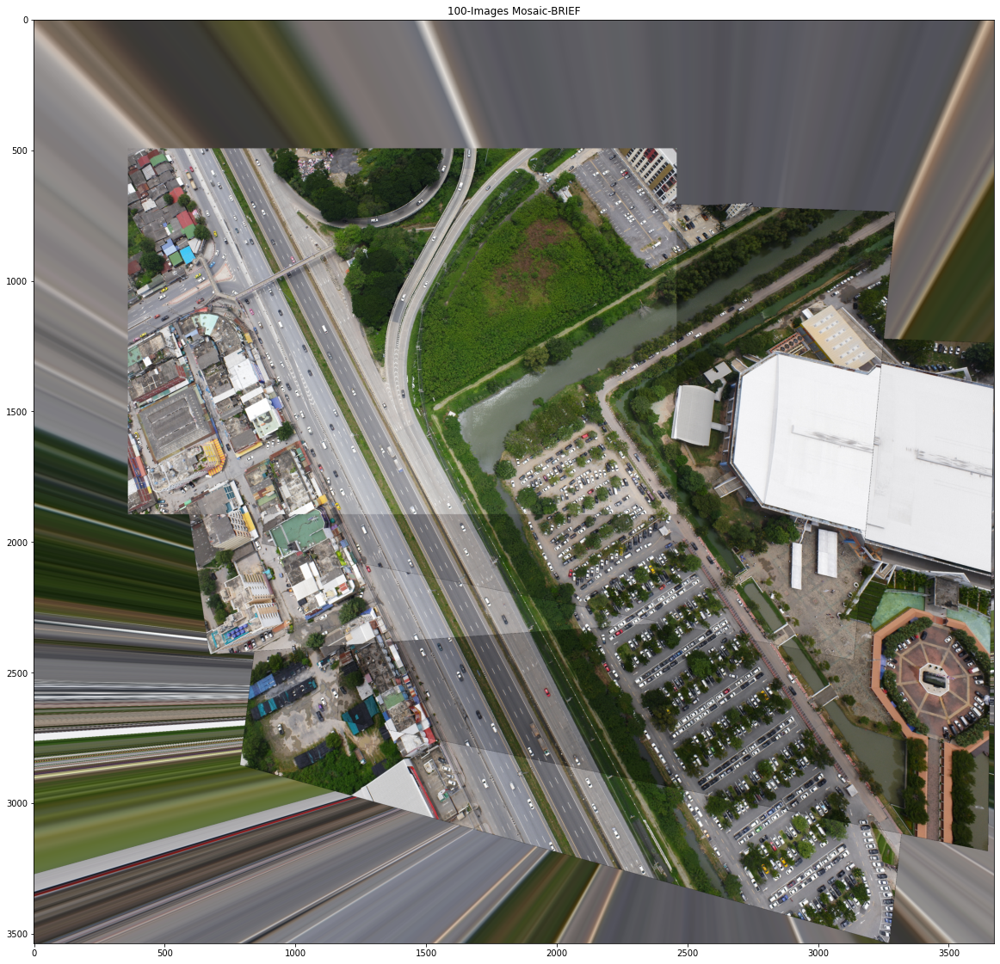

In [ ]:
fig,ax =plt.subplots()
fig.set_size_inches(20,20)
ax.imshow(cv2.cvtColor(warp_imgs_all_brief , cv2.COLOR_BGR2RGB))
ax.set_title('100-Images Mosaic-BRIEF')

In [ ]:
class RootSIFT:
  def __init__(self):
    # initialize the SIFT feature extractor
    #self.extractor = cv2.DescriptorExtractor_create("SIFT")
    self.sift = cv2.xfeatures2d.SIFT_create()

  def compute(self, image, kps, eps=1e-7):
    # compute SIFT descriptors
    (kps, descs) = self.sift.compute(image, kps)

    # if there are no keypoints or descriptors, return an empty tuple
    if len(kps) == 0:
      return ([], None)

    # apply the Hellinger kernel by first L1-normalizing, taking the
    # square-root, and then L2-normalizing
    descs /= (np.linalg.norm(descs, axis=0, ord=2) + eps)
    descs /= (descs.sum(axis=0) + eps)
    descs = np.sqrt(descs)
    #descs /= (np.linalg.norm(descs, axis=0, ord=2) + eps)

    # return a tuple of the keypoints and descriptors
    return (kps, descs)

In [ ]:
sift = cv2.xfeatures2d.SIFT_create()
rootsift = RootSIFT()
keypoints_all_left_rootsift = []
descriptors_all_left_rootsift = []
points_all_left_rootsift=[]

keypoints_all_right_rootsift = []
descriptors_all_right_rootsift = []
points_all_right_rootsift=[]

for imgs in tqdm(images_left_bgr):
  kpt = sift.detect(imgs,None)
  kpt,descrip =  rootsift.compute(imgs, kpt)
  keypoints_all_left_rootsift.append(kpt)
  descriptors_all_left_rootsift.append(descrip)
  points_all_left_rootsift.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

for imgs in tqdm(images_right_bgr):
  kpt = sift.detect(imgs,None)
  kpt,descrip =  rootsift.compute(imgs, kpt)
  keypoints_all_right_rootsift.append(kpt)
  descriptors_all_right_rootsift.append(descrip)
  points_all_right_rootsift.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

100%|██████████| 60/60 [03:14<00:00,  3.24s/it]


In [ ]:

sift = cv2.xfeatures2d.SIFT_create()
keypoints_all_left_sift = []
descriptors_all_left_sift = []
points_all_left_sift=[]

keypoints_all_right_sift = []
descriptors_all_right_sift = []
points_all_right_sift=[]

for imgs in tqdm(images_left_bgr):
  kpt = sift.detect(imgs,None)
  kpt,descrip =  sift.compute(imgs, kpt)
  keypoints_all_left_sift.append(kpt)
  descriptors_all_left_sift.append(descrip)
  points_all_left_sift.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

for imgs in tqdm(images_right_bgr):
  kpt = sift.detect(imgs,None)
  kpt,descrip =  sift.compute(imgs, kpt)
  keypoints_all_right_sift.append(kpt)
  descriptors_all_right_sift.append(descrip)
  points_all_right_sift.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))
  

100%|██████████| 61/61 [03:09<00:00,  3.11s/it]


In [ ]:
def compute_homography_fast(matched_pts1, matched_pts2,thresh=4):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    cv2.RANSAC, ransacReprojThreshold =thresh)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def compute_homography_fast_other(matched_pts1, matched_pts2):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    0)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def get_Hmatrix(imgs,keypts,pts,descripts,ratio=0.8,thresh=4,disp=False):
  FLANN_INDEX_KDTREE = 2
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  #flann = cv2.BFMatcher()

  lff1 = np.float32(descripts[0])
  lff = np.float32(descripts[1])


  matches_lf1_lf = flann.knnMatch(lff1, lff, k=2)

  print("\nNumber of matches",len(matches_lf1_lf))

  matches_4 = []
  ratio = ratio
  # loop over the raw matches
  for m in matches_lf1_lf:
    # ensure the distance is within a certain ratio of each
    # other (i.e. Lowe’s ratio test)
    if len(m) == 2 and m[0].distance < m[1].distance * ratio:
        #matches_1.append((m[0].trainIdx, m[0].queryIdx))
        matches_4.append(m[0])

  print("Number of matches After Lowe's Ratio",len(matches_4))
  
  matches_idx = np.array([m.queryIdx for m in matches_4])
  imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
  matches_idx = np.array([m.trainIdx for m in matches_4])
  imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
  '''
  # Estimate homography 1
  #Compute H1
  # Estimate homography 1
  #Compute H1
  imm1_pts=np.empty((len(matches_4),2))
  imm2_pts=np.empty((len(matches_4),2))
  for i in range(0,len(matches_4)):
    m = matches_4[i]
    (a_x, a_y) = keypts[0][m.queryIdx].pt
    (b_x, b_y) = keypts[1][m.trainIdx].pt
    imm1_pts[i]=(a_x, a_y)
    imm2_pts[i]=(b_x, b_y)    
  H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  Hn, best_inliers=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1000, RANSACthresh=6)
  '''
  
  
  Hn,inliers = compute_homography_fast(imm1_pts,imm2_pts,thresh)  
  inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
  print("Number of Robust matches",len(inlier_matchset))
  print("\n")
  '''
  if len(inlier_matchset)<50:
    matches_4 = []
    ratio = 0.67
    # loop over the raw matches
    for m in matches_lf1_lf:
      # ensure the distance is within a certain ratio of each
      # other (i.e. Lowe’s ratio test)
      if len(m) == 2 and m[0].distance < m[1].distance * ratio:
          #matches_1.append((m[0].trainIdx, m[0].queryIdx))
          matches_4.append(m[0])
    print("Number of matches After Lowe's Ratio New",len(matches_4))
  
    matches_idx = np.array([m.queryIdx for m in matches_4])
    imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
    matches_idx = np.array([m.trainIdx for m in matches_4])
    imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
    Hn,inliers = compute_homography_fast_other(imm1_pts,imm2_pts)  
    inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
    print("Number of Robust matches New",len(inlier_matchset))
    print("\n")    
    '''
  #H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  #Hn=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1500, RANSACthresh=6)

  #global inlier_matchset   
  
  if disp==True:
    dispimg1=cv2.drawMatches(imgs[0], keypts[0], imgs[1], keypts[1], inlier_matchset, None,flags=2)
    displayplot(dispimg1,'Robust Matching between Reference Image and Right Image ')
  
  return Hn/Hn[2,2], len(matches_lf1_lf), len(inlier_matchset)

In [ ]:
from functools import partial
from tqdm import tqdm
tqdm = partial(tqdm, position=0, leave=True)

In [ ]:
print(left_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0061.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0060.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0059.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0058.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0057.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0056.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0055.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0053.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0052.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0051.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0050.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0049.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0048.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0047.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
print(right_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0060.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0061.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0062.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0065.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0066.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0067.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0068.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0069.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0070.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0071.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0072.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0073.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0074.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
H_left_rootsift = []
H_right_rootsift = []

num_matches_rootsift = []
num_good_matches_rootsift = []

for j in tqdm(range(len(images_left))):
  if j==len(images_left)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_left_bgr[j:j+2][::-1],keypoints_all_left_rootsift[j:j+2][::-1],points_all_left_rootsift[j:j+2][::-1],descriptors_all_left_rootsift[j:j+2][::-1])
  H_left_rootsift.append(H_a)
  num_matches_rootsift.append(matches)
  num_good_matches_rootsift.append(gd_matches)

for j in tqdm(range(len(images_right))):
  if j==len(images_right)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_right_bgr[j:j+2][::-1],keypoints_all_right_rootsift[j:j+2][::-1],points_all_right_rootsift[j:j+2][::-1],descriptors_all_right_rootsift[j:j+2][::-1])
  H_right_rootsift.append(H_a)
  #num_matches.append(matches)
  #num_good_matches.append(gd_matches)

  2%|▏         | 1/61 [00:06<06:35,  6.59s/it]


Number of matches 28871
Number of matches After Lowe's Ratio 2381
Number of Robust matches 1347




  3%|▎         | 2/61 [00:13<06:28,  6.59s/it]


Number of matches 35330
Number of matches After Lowe's Ratio 1675
Number of Robust matches 879




  5%|▍         | 3/61 [00:20<06:43,  6.96s/it]


Number of matches 32332
Number of matches After Lowe's Ratio 626
Number of Robust matches 245




  7%|▋         | 4/61 [00:28<06:39,  7.01s/it]


Number of matches 32125
Number of matches After Lowe's Ratio 4695
Number of Robust matches 2562




  8%|▊         | 5/61 [00:35<06:36,  7.08s/it]


Number of matches 32463
Number of matches After Lowe's Ratio 5257
Number of Robust matches 3471




 10%|▉         | 6/61 [00:44<07:06,  7.76s/it]


Number of matches 32266
Number of matches After Lowe's Ratio 4943
Number of Robust matches 2575




 11%|█▏        | 7/61 [00:54<07:33,  8.40s/it]


Number of matches 32877
Number of matches After Lowe's Ratio 5372
Number of Robust matches 3219




 13%|█▎        | 8/61 [01:02<07:10,  8.12s/it]


Number of matches 27613
Number of matches After Lowe's Ratio 3080
Number of Robust matches 2047




 15%|█▍        | 9/61 [01:07<06:27,  7.45s/it]


Number of matches 31966
Number of matches After Lowe's Ratio 4270
Number of Robust matches 2660




 16%|█▋        | 10/61 [01:14<06:05,  7.17s/it]


Number of matches 23666
Number of matches After Lowe's Ratio 1857
Number of Robust matches 1229




 18%|█▊        | 11/61 [01:19<05:24,  6.50s/it]


Number of matches 27909
Number of matches After Lowe's Ratio 3934
Number of Robust matches 2418




 20%|█▉        | 12/61 [01:24<05:01,  6.16s/it]


Number of matches 24162
Number of matches After Lowe's Ratio 3893
Number of Robust matches 2703




 21%|██▏       | 13/61 [01:29<04:34,  5.71s/it]


Number of matches 27592
Number of matches After Lowe's Ratio 4109
Number of Robust matches 2598




 23%|██▎       | 14/61 [01:35<04:27,  5.69s/it]


Number of matches 27282
Number of matches After Lowe's Ratio 5900
Number of Robust matches 4725




 25%|██▍       | 15/61 [01:40<04:19,  5.65s/it]


Number of matches 27099
Number of matches After Lowe's Ratio 4324
Number of Robust matches 3243




 26%|██▌       | 16/61 [01:45<04:09,  5.55s/it]


Number of matches 25919
Number of matches After Lowe's Ratio 4606
Number of Robust matches 3685




 28%|██▊       | 17/61 [01:51<04:02,  5.50s/it]


Number of matches 26581
Number of matches After Lowe's Ratio 4335
Number of Robust matches 3339




 30%|██▉       | 18/61 [01:56<03:57,  5.53s/it]


Number of matches 27052
Number of matches After Lowe's Ratio 5517
Number of Robust matches 4272




 31%|███       | 19/61 [02:02<03:56,  5.63s/it]


Number of matches 28182
Number of matches After Lowe's Ratio 6251
Number of Robust matches 4346




 33%|███▎      | 20/61 [02:08<03:56,  5.77s/it]


Number of matches 29913
Number of matches After Lowe's Ratio 5161
Number of Robust matches 3952




 34%|███▍      | 21/61 [02:15<03:59,  5.98s/it]


Number of matches 32208
Number of matches After Lowe's Ratio 4720
Number of Robust matches 3225




 36%|███▌      | 22/61 [02:22<04:08,  6.37s/it]


Number of matches 31209
Number of matches After Lowe's Ratio 4667
Number of Robust matches 2945




 38%|███▊      | 23/61 [02:29<04:04,  6.43s/it]


Number of matches 31666
Number of matches After Lowe's Ratio 4999
Number of Robust matches 3093




 39%|███▉      | 24/61 [02:36<04:06,  6.65s/it]


Number of matches 31039
Number of matches After Lowe's Ratio 4038
Number of Robust matches 2496




 41%|████      | 25/61 [02:43<04:04,  6.79s/it]


Number of matches 35893
Number of matches After Lowe's Ratio 3441
Number of Robust matches 1542




 43%|████▎     | 26/61 [02:51<04:11,  7.18s/it]


Number of matches 30633
Number of matches After Lowe's Ratio 3661
Number of Robust matches 1866




 44%|████▍     | 27/61 [02:58<04:06,  7.24s/it]


Number of matches 35656
Number of matches After Lowe's Ratio 3547
Number of Robust matches 1841




 46%|████▌     | 28/61 [03:07<04:11,  7.63s/it]


Number of matches 34271
Number of matches After Lowe's Ratio 4066
Number of Robust matches 1770




 48%|████▊     | 29/61 [03:16<04:16,  8.01s/it]


Number of matches 39115
Number of matches After Lowe's Ratio 2527
Number of Robust matches 1255




 49%|████▉     | 30/61 [03:26<04:31,  8.76s/it]


Number of matches 38049
Number of matches After Lowe's Ratio 4121
Number of Robust matches 1943




 51%|█████     | 31/61 [03:39<04:54,  9.83s/it]


Number of matches 38187
Number of matches After Lowe's Ratio 2073
Number of Robust matches 946




 52%|█████▏    | 32/61 [03:52<05:11, 10.74s/it]


Number of matches 35025
Number of matches After Lowe's Ratio 927
Number of Robust matches 434




 54%|█████▍    | 33/61 [04:04<05:10, 11.10s/it]


Number of matches 35065
Number of matches After Lowe's Ratio 3774
Number of Robust matches 2210




 56%|█████▌    | 34/61 [04:15<04:59, 11.11s/it]


Number of matches 32733
Number of matches After Lowe's Ratio 4270
Number of Robust matches 2719




 57%|█████▋    | 35/61 [04:26<04:46, 11.03s/it]


Number of matches 33968
Number of matches After Lowe's Ratio 3829
Number of Robust matches 2536




 59%|█████▉    | 36/61 [04:37<04:38, 11.14s/it]


Number of matches 39070
Number of matches After Lowe's Ratio 4969
Number of Robust matches 2726




 61%|██████    | 37/61 [04:48<04:27, 11.14s/it]


Number of matches 41604
Number of matches After Lowe's Ratio 4595
Number of Robust matches 2030




 62%|██████▏   | 38/61 [04:59<04:17, 11.19s/it]


Number of matches 43881
Number of matches After Lowe's Ratio 4759
Number of Robust matches 2013




 64%|██████▍   | 39/61 [05:11<04:10, 11.38s/it]


Number of matches 40123
Number of matches After Lowe's Ratio 4335
Number of Robust matches 2069




 66%|██████▌   | 40/61 [05:21<03:51, 11.01s/it]


Number of matches 36596
Number of matches After Lowe's Ratio 4833
Number of Robust matches 2539




 67%|██████▋   | 41/61 [05:30<03:24, 10.20s/it]


Number of matches 33986
Number of matches After Lowe's Ratio 5100
Number of Robust matches 3219




 69%|██████▉   | 42/61 [05:37<02:56,  9.28s/it]


Number of matches 30652
Number of matches After Lowe's Ratio 4920
Number of Robust matches 3099




 70%|███████   | 43/61 [05:43<02:31,  8.40s/it]


Number of matches 29868
Number of matches After Lowe's Ratio 5601
Number of Robust matches 3834




 72%|███████▏  | 44/61 [05:49<02:09,  7.64s/it]


Number of matches 28588
Number of matches After Lowe's Ratio 4573
Number of Robust matches 2897




 74%|███████▍  | 45/61 [05:55<01:52,  7.05s/it]


Number of matches 28661
Number of matches After Lowe's Ratio 5188
Number of Robust matches 3586




 75%|███████▌  | 46/61 [06:00<01:40,  6.68s/it]


Number of matches 27785
Number of matches After Lowe's Ratio 5639
Number of Robust matches 3463




 77%|███████▋  | 47/61 [06:06<01:28,  6.35s/it]


Number of matches 27261
Number of matches After Lowe's Ratio 5461
Number of Robust matches 3442




 79%|███████▊  | 48/61 [06:11<01:18,  6.02s/it]


Number of matches 23943
Number of matches After Lowe's Ratio 3360
Number of Robust matches 2216




 80%|████████  | 49/61 [06:16<01:07,  5.62s/it]


Number of matches 23206
Number of matches After Lowe's Ratio 5591
Number of Robust matches 4168




 82%|████████▏ | 50/61 [06:21<00:58,  5.35s/it]


Number of matches 27133
Number of matches After Lowe's Ratio 5266
Number of Robust matches 4131




 84%|████████▎ | 51/61 [06:26<00:54,  5.45s/it]


Number of matches 28897
Number of matches After Lowe's Ratio 4195
Number of Robust matches 3002




 85%|████████▌ | 52/61 [06:33<00:53,  5.91s/it]


Number of matches 30356
Number of matches After Lowe's Ratio 4317
Number of Robust matches 2971




 87%|████████▋ | 53/61 [06:40<00:49,  6.20s/it]


Number of matches 30770
Number of matches After Lowe's Ratio 5482
Number of Robust matches 3941




 89%|████████▊ | 54/61 [06:47<00:45,  6.46s/it]


Number of matches 30376
Number of matches After Lowe's Ratio 4332
Number of Robust matches 2879




 90%|█████████ | 55/61 [06:54<00:39,  6.60s/it]


Number of matches 30122
Number of matches After Lowe's Ratio 4635
Number of Robust matches 2944




 92%|█████████▏| 56/61 [07:01<00:33,  6.79s/it]


Number of matches 30579
Number of matches After Lowe's Ratio 4052
Number of Robust matches 1912




 93%|█████████▎| 57/61 [07:09<00:27,  6.93s/it]


Number of matches 29556
Number of matches After Lowe's Ratio 5749
Number of Robust matches 3284




 95%|█████████▌| 58/61 [07:16<00:20,  6.95s/it]


Number of matches 30860
Number of matches After Lowe's Ratio 3376
Number of Robust matches 1657




 97%|█████████▋| 59/61 [07:23<00:14,  7.06s/it]


Number of matches 30396
Number of matches After Lowe's Ratio 5262
Number of Robust matches 2868




  0%|          | 0/60 [00:00<?, ?it/s]


Number of matches 26655
Number of matches After Lowe's Ratio 1603
Number of Robust matches 667




  2%|▏         | 1/60 [00:06<06:47,  6.90s/it]


Number of matches 32312
Number of matches After Lowe's Ratio 2461
Number of Robust matches 1481




  3%|▎         | 2/60 [00:14<06:51,  7.10s/it]


Number of matches 32696
Number of matches After Lowe's Ratio 4035
Number of Robust matches 2353




  5%|▌         | 3/60 [00:21<06:42,  7.06s/it]


Number of matches 31067
Number of matches After Lowe's Ratio 4211
Number of Robust matches 2874




  7%|▋         | 4/60 [00:27<06:14,  6.69s/it]


Number of matches 19735
Number of matches After Lowe's Ratio 979
Number of Robust matches 759




  8%|▊         | 5/60 [00:31<05:23,  5.87s/it]


Number of matches 27026
Number of matches After Lowe's Ratio 1090
Number of Robust matches 703




 10%|█         | 6/60 [00:36<05:06,  5.68s/it]


Number of matches 19200
Number of matches After Lowe's Ratio 2609
Number of Robust matches 2117




 12%|█▏        | 7/60 [00:40<04:34,  5.18s/it]


Number of matches 28248
Number of matches After Lowe's Ratio 1703
Number of Robust matches 1121




 13%|█▎        | 8/60 [00:46<04:39,  5.38s/it]


Number of matches 29428
Number of matches After Lowe's Ratio 5733
Number of Robust matches 4793




 15%|█▌        | 9/60 [00:52<04:48,  5.65s/it]


Number of matches 28737
Number of matches After Lowe's Ratio 6006
Number of Robust matches 4257




 17%|█▋        | 10/60 [00:58<04:46,  5.73s/it]


Number of matches 28036
Number of matches After Lowe's Ratio 4898
Number of Robust matches 4132




 18%|█▊        | 11/60 [01:04<04:49,  5.90s/it]


Number of matches 31014
Number of matches After Lowe's Ratio 5024
Number of Robust matches 3679




 20%|██        | 12/60 [01:11<04:59,  6.23s/it]


Number of matches 34946
Number of matches After Lowe's Ratio 3984
Number of Robust matches 2824




 22%|██▏       | 13/60 [01:19<05:19,  6.79s/it]


Number of matches 35939
Number of matches After Lowe's Ratio 5339
Number of Robust matches 3615




 23%|██▎       | 14/60 [01:28<05:36,  7.31s/it]


Number of matches 36837
Number of matches After Lowe's Ratio 4834
Number of Robust matches 2877




 25%|██▌       | 15/60 [01:37<05:49,  7.78s/it]


Number of matches 37856
Number of matches After Lowe's Ratio 5226
Number of Robust matches 2671




 27%|██▋       | 16/60 [01:46<06:00,  8.18s/it]


Number of matches 37941
Number of matches After Lowe's Ratio 5330
Number of Robust matches 2326




 28%|██▊       | 17/60 [01:54<05:56,  8.28s/it]


Number of matches 34580
Number of matches After Lowe's Ratio 5121
Number of Robust matches 2274




 30%|███       | 18/60 [02:02<05:41,  8.14s/it]


Number of matches 33372
Number of matches After Lowe's Ratio 3972
Number of Robust matches 2233




 32%|███▏      | 19/60 [02:10<05:24,  7.90s/it]


Number of matches 33599
Number of matches After Lowe's Ratio 5622
Number of Robust matches 2600




 33%|███▎      | 20/60 [02:17<05:09,  7.74s/it]


Number of matches 34878
Number of matches After Lowe's Ratio 4751
Number of Robust matches 2013




 35%|███▌      | 21/60 [02:25<05:04,  7.81s/it]


Number of matches 32992
Number of matches After Lowe's Ratio 4737
Number of Robust matches 2126




 37%|███▋      | 22/60 [02:32<04:51,  7.66s/it]


Number of matches 34056
Number of matches After Lowe's Ratio 3750
Number of Robust matches 2036




 38%|███▊      | 23/60 [02:41<04:54,  7.95s/it]


Number of matches 44723
Number of matches After Lowe's Ratio 1476
Number of Robust matches 703




 40%|████      | 24/60 [02:52<05:24,  9.00s/it]


Number of matches 41727
Number of matches After Lowe's Ratio 3019
Number of Robust matches 1279




 42%|████▏     | 25/60 [03:04<05:41,  9.77s/it]


Number of matches 46928
Number of matches After Lowe's Ratio 456
Number of Robust matches 159




 43%|████▎     | 26/60 [03:16<05:52, 10.38s/it]


Number of matches 39889
Number of matches After Lowe's Ratio 2699
Number of Robust matches 1143




 45%|████▌     | 27/60 [03:26<05:37, 10.23s/it]


Number of matches 38074
Number of matches After Lowe's Ratio 4975
Number of Robust matches 2029




 47%|████▋     | 28/60 [03:34<05:09,  9.68s/it]


Number of matches 33707
Number of matches After Lowe's Ratio 3668
Number of Robust matches 1386




 48%|████▊     | 29/60 [03:42<04:40,  9.05s/it]


Number of matches 32337
Number of matches After Lowe's Ratio 3243
Number of Robust matches 1282




 50%|█████     | 30/60 [03:49<04:15,  8.50s/it]


Number of matches 31634
Number of matches After Lowe's Ratio 3377
Number of Robust matches 1319




 52%|█████▏    | 31/60 [03:56<03:56,  8.15s/it]


Number of matches 31779
Number of matches After Lowe's Ratio 3825
Number of Robust matches 1533




 53%|█████▎    | 32/60 [04:04<03:43,  7.99s/it]


Number of matches 32533
Number of matches After Lowe's Ratio 6199
Number of Robust matches 2625




 55%|█████▌    | 33/60 [04:12<03:37,  8.06s/it]


Number of matches 34689
Number of matches After Lowe's Ratio 3744
Number of Robust matches 1513




 57%|█████▋    | 34/60 [04:20<03:32,  8.19s/it]


Number of matches 32975
Number of matches After Lowe's Ratio 5849
Number of Robust matches 3037




 58%|█████▊    | 35/60 [04:28<03:20,  8.03s/it]


Number of matches 32080
Number of matches After Lowe's Ratio 4515
Number of Robust matches 2377




 60%|██████    | 36/60 [04:35<03:07,  7.80s/it]


Number of matches 32233
Number of matches After Lowe's Ratio 3637
Number of Robust matches 2076




 62%|██████▏   | 37/60 [04:43<02:55,  7.64s/it]


Number of matches 30573
Number of matches After Lowe's Ratio 3272
Number of Robust matches 2521




 63%|██████▎   | 38/60 [04:49<02:39,  7.24s/it]


Number of matches 30768
Number of matches After Lowe's Ratio 3939
Number of Robust matches 2800




 65%|██████▌   | 39/60 [04:55<02:26,  6.99s/it]


Number of matches 26813
Number of matches After Lowe's Ratio 3005
Number of Robust matches 1862




 67%|██████▋   | 40/60 [05:01<02:09,  6.50s/it]


Number of matches 26443
Number of matches After Lowe's Ratio 4744
Number of Robust matches 3377




 68%|██████▊   | 41/60 [05:06<01:56,  6.12s/it]


Number of matches 28580
Number of matches After Lowe's Ratio 2903
Number of Robust matches 1539




 70%|███████   | 42/60 [05:12<01:49,  6.06s/it]


Number of matches 28143
Number of matches After Lowe's Ratio 5408
Number of Robust matches 3550




 72%|███████▏  | 43/60 [05:17<01:37,  5.73s/it]


Number of matches 17004
Number of matches After Lowe's Ratio 1339
Number of Robust matches 1025




 73%|███████▎  | 44/60 [05:19<01:17,  4.82s/it]


Number of matches 13636
Number of matches After Lowe's Ratio 2452
Number of Robust matches 1538




 75%|███████▌  | 45/60 [05:21<00:59,  3.98s/it]


Number of matches 13604
Number of matches After Lowe's Ratio 1397
Number of Robust matches 789




 77%|███████▋  | 46/60 [05:24<00:48,  3.44s/it]


Number of matches 16334
Number of matches After Lowe's Ratio 3294
Number of Robust matches 2355




 78%|███████▊  | 47/60 [05:27<00:43,  3.34s/it]


Number of matches 28245
Number of matches After Lowe's Ratio 1357
Number of Robust matches 1013




 80%|████████  | 48/60 [05:33<00:49,  4.15s/it]


Number of matches 31687
Number of matches After Lowe's Ratio 4663
Number of Robust matches 3312




 82%|████████▏ | 49/60 [05:41<00:57,  5.24s/it]


Number of matches 33859
Number of matches After Lowe's Ratio 4377
Number of Robust matches 2950




 83%|████████▎ | 50/60 [05:48<00:59,  5.98s/it]


Number of matches 28095
Number of matches After Lowe's Ratio 3576
Number of Robust matches 2490




 85%|████████▌ | 51/60 [05:54<00:52,  5.89s/it]


Number of matches 27389
Number of matches After Lowe's Ratio 4202
Number of Robust matches 2539




 87%|████████▋ | 52/60 [06:00<00:46,  5.81s/it]


Number of matches 32426
Number of matches After Lowe's Ratio 3169
Number of Robust matches 1915




 88%|████████▊ | 53/60 [06:07<00:44,  6.33s/it]


Number of matches 30438
Number of matches After Lowe's Ratio 1312
Number of Robust matches 734




 90%|█████████ | 54/60 [06:14<00:38,  6.39s/it]


Number of matches 28440
Number of matches After Lowe's Ratio 2527
Number of Robust matches 1645




 92%|█████████▏| 55/60 [06:19<00:30,  6.12s/it]


Number of matches 26824
Number of matches After Lowe's Ratio 4673
Number of Robust matches 2668




 93%|█████████▎| 56/60 [06:25<00:23,  5.88s/it]


Number of matches 26741
Number of matches After Lowe's Ratio 2644
Number of Robust matches 1408




 95%|█████████▌| 57/60 [06:30<00:17,  5.73s/it]


Number of matches 22819
Number of matches After Lowe's Ratio 3724
Number of Robust matches 2677




 97%|█████████▋| 58/60 [06:34<00:10,  5.22s/it]


Number of matches 17913
Number of matches After Lowe's Ratio 3459
Number of Robust matches 2621




 98%|█████████▊| 59/60 [06:37<00:04,  4.59s/it]


Number of matches 16676
Number of matches After Lowe's Ratio 3585
Number of Robust matches 2730




In [ ]:

H_left_sift = []
H_right_sift = []

num_matches_sift = []
num_good_matches_sift = []

for j in tqdm(range(len(images_left))):
  if j==len(images_left)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_left_bgr[j:j+2][::-1],keypoints_all_left_sift[j:j+2][::-1],points_all_left_sift[j:j+2][::-1],descriptors_all_left_sift[j:j+2][::-1],0.5)
  H_left_sift.append(H_a)
  num_matches_sift.append(matches)
  num_good_matches_sift.append(gd_matches)

for j in tqdm(range(len(images_right))):
  if j==len(images_right)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_right_bgr[j:j+2][::-1],keypoints_all_right_sift[j:j+2][::-1],points_all_right_sift[j:j+2][::-1],descriptors_all_right_sift[j:j+2][::-1],0.5)
  H_right_sift.append(H_a)
  #num_matches.append(matches)
  #num_good_matches.append(gd_matches)
  

  2%|▏         | 1/61 [00:06<06:32,  6.55s/it]


Number of matches 28871
Number of matches After Lowe's Ratio 571
Number of Robust matches 480




  3%|▎         | 2/61 [00:13<06:26,  6.55s/it]


Number of matches 35330
Number of matches After Lowe's Ratio 352
Number of Robust matches 281




  5%|▍         | 3/61 [00:20<06:39,  6.88s/it]


Number of matches 32332
Number of matches After Lowe's Ratio 74
Number of Robust matches 54




  7%|▋         | 4/61 [00:27<06:33,  6.91s/it]


Number of matches 32125
Number of matches After Lowe's Ratio 1498
Number of Robust matches 975




  8%|▊         | 5/61 [00:34<06:32,  7.01s/it]


Number of matches 32463
Number of matches After Lowe's Ratio 1694
Number of Robust matches 898




 10%|▉         | 6/61 [00:41<06:25,  7.00s/it]


Number of matches 32266
Number of matches After Lowe's Ratio 1656
Number of Robust matches 1037




 11%|█▏        | 7/61 [00:49<06:19,  7.04s/it]


Number of matches 32877
Number of matches After Lowe's Ratio 1815
Number of Robust matches 1011




 13%|█▎        | 8/61 [00:55<06:09,  6.97s/it]


Number of matches 27613
Number of matches After Lowe's Ratio 759
Number of Robust matches 517




 15%|█▍        | 9/61 [01:01<05:39,  6.53s/it]


Number of matches 31966
Number of matches After Lowe's Ratio 1288
Number of Robust matches 820




 16%|█▋        | 10/61 [01:08<05:37,  6.62s/it]


Number of matches 23666
Number of matches After Lowe's Ratio 502
Number of Robust matches 428




 18%|█▊        | 11/61 [01:13<05:05,  6.12s/it]


Number of matches 27909
Number of matches After Lowe's Ratio 1299
Number of Robust matches 934




 20%|█▉        | 12/61 [01:18<04:47,  5.86s/it]


Number of matches 24162
Number of matches After Lowe's Ratio 1453
Number of Robust matches 1187




 21%|██▏       | 13/61 [01:22<04:21,  5.45s/it]


Number of matches 27592
Number of matches After Lowe's Ratio 1424
Number of Robust matches 1225




 23%|██▎       | 14/61 [01:28<04:16,  5.46s/it]


Number of matches 27282
Number of matches After Lowe's Ratio 2431
Number of Robust matches 2264




 25%|██▍       | 15/61 [01:33<04:07,  5.38s/it]


Number of matches 27099
Number of matches After Lowe's Ratio 1678
Number of Robust matches 1375




 26%|██▌       | 16/61 [01:38<03:58,  5.30s/it]


Number of matches 25919
Number of matches After Lowe's Ratio 2079
Number of Robust matches 1896




 28%|██▊       | 17/61 [01:43<03:49,  5.22s/it]


Number of matches 26581
Number of matches After Lowe's Ratio 1920
Number of Robust matches 1715




 30%|██▉       | 18/61 [01:48<03:43,  5.21s/it]


Number of matches 27052
Number of matches After Lowe's Ratio 2761
Number of Robust matches 2259




 31%|███       | 19/61 [01:54<03:39,  5.22s/it]


Number of matches 28182
Number of matches After Lowe's Ratio 3199
Number of Robust matches 2716




 33%|███▎      | 20/61 [01:59<03:39,  5.35s/it]


Number of matches 29913
Number of matches After Lowe's Ratio 2436
Number of Robust matches 2114




 34%|███▍      | 21/61 [02:06<03:52,  5.81s/it]


Number of matches 32208
Number of matches After Lowe's Ratio 1950
Number of Robust matches 1553




 36%|███▌      | 22/61 [02:13<03:56,  6.07s/it]


Number of matches 31209
Number of matches After Lowe's Ratio 1614
Number of Robust matches 1233




 38%|███▊      | 23/61 [02:19<03:53,  6.15s/it]


Number of matches 31666
Number of matches After Lowe's Ratio 1792
Number of Robust matches 1475




 39%|███▉      | 24/61 [02:26<03:52,  6.27s/it]


Number of matches 31039
Number of matches After Lowe's Ratio 1276
Number of Robust matches 1048




 41%|████      | 25/61 [02:33<03:56,  6.56s/it]


Number of matches 35893
Number of matches After Lowe's Ratio 1088
Number of Robust matches 818




 43%|████▎     | 26/61 [02:41<04:04,  7.00s/it]


Number of matches 30633
Number of matches After Lowe's Ratio 1044
Number of Robust matches 737




 44%|████▍     | 27/61 [02:48<03:58,  7.02s/it]


Number of matches 35656
Number of matches After Lowe's Ratio 1097
Number of Robust matches 806




 46%|████▌     | 28/61 [02:56<04:02,  7.35s/it]


Number of matches 34271
Number of matches After Lowe's Ratio 1075
Number of Robust matches 655




 48%|████▊     | 29/61 [03:05<04:06,  7.70s/it]


Number of matches 39115
Number of matches After Lowe's Ratio 607
Number of Robust matches 417




 49%|████▉     | 30/61 [03:14<04:15,  8.23s/it]


Number of matches 38049
Number of matches After Lowe's Ratio 1102
Number of Robust matches 802




 51%|█████     | 31/61 [03:23<04:11,  8.39s/it]


Number of matches 38187
Number of matches After Lowe's Ratio 424
Number of Robust matches 287




 52%|█████▏    | 32/61 [03:31<04:04,  8.42s/it]


Number of matches 35025
Number of matches After Lowe's Ratio 137
Number of Robust matches 99




 54%|█████▍    | 33/61 [03:39<03:50,  8.25s/it]


Number of matches 35065
Number of matches After Lowe's Ratio 1070
Number of Robust matches 844




 56%|█████▌    | 34/61 [03:47<03:37,  8.06s/it]


Number of matches 32733
Number of matches After Lowe's Ratio 1219
Number of Robust matches 963




 57%|█████▋    | 35/61 [03:54<03:20,  7.73s/it]


Number of matches 33968
Number of matches After Lowe's Ratio 1177
Number of Robust matches 930




 59%|█████▉    | 36/61 [04:02<03:13,  7.76s/it]


Number of matches 39070
Number of matches After Lowe's Ratio 1508
Number of Robust matches 1165




 61%|██████    | 37/61 [04:11<03:17,  8.23s/it]


Number of matches 41604
Number of matches After Lowe's Ratio 1050
Number of Robust matches 703




 62%|██████▏   | 38/61 [04:22<03:24,  8.91s/it]


Number of matches 43881
Number of matches After Lowe's Ratio 989
Number of Robust matches 657




 64%|██████▍   | 39/61 [04:32<03:28,  9.48s/it]


Number of matches 40123
Number of matches After Lowe's Ratio 944
Number of Robust matches 606




 66%|██████▌   | 40/61 [04:42<03:19,  9.51s/it]


Number of matches 36596
Number of matches After Lowe's Ratio 1217
Number of Robust matches 882




 67%|██████▋   | 41/61 [04:51<03:05,  9.26s/it]


Number of matches 33986
Number of matches After Lowe's Ratio 1597
Number of Robust matches 1303




 69%|██████▉   | 42/61 [04:58<02:43,  8.58s/it]


Number of matches 30652
Number of matches After Lowe's Ratio 1774
Number of Robust matches 1278




 70%|███████   | 43/61 [05:04<02:21,  7.84s/it]


Number of matches 29868
Number of matches After Lowe's Ratio 2043
Number of Robust matches 1727




 72%|███████▏  | 44/61 [05:10<02:03,  7.27s/it]


Number of matches 28588
Number of matches After Lowe's Ratio 1946
Number of Robust matches 1657




 74%|███████▍  | 45/61 [05:15<01:49,  6.82s/it]


Number of matches 28661
Number of matches After Lowe's Ratio 2402
Number of Robust matches 1782




 75%|███████▌  | 46/61 [05:21<01:36,  6.45s/it]


Number of matches 27785
Number of matches After Lowe's Ratio 2588
Number of Robust matches 1939




 77%|███████▋  | 47/61 [05:26<01:25,  6.10s/it]


Number of matches 27261
Number of matches After Lowe's Ratio 2547
Number of Robust matches 1800




 79%|███████▊  | 48/61 [05:32<01:15,  5.84s/it]


Number of matches 23943
Number of matches After Lowe's Ratio 1435
Number of Robust matches 1032




 80%|████████  | 49/61 [05:36<01:04,  5.41s/it]


Number of matches 23206
Number of matches After Lowe's Ratio 2792
Number of Robust matches 2447




 82%|████████▏ | 50/61 [05:40<00:56,  5.13s/it]


Number of matches 27133
Number of matches After Lowe's Ratio 2508
Number of Robust matches 2289




 84%|████████▎ | 51/61 [05:46<00:52,  5.20s/it]


Number of matches 28897
Number of matches After Lowe's Ratio 1410
Number of Robust matches 1200




 85%|████████▌ | 52/61 [05:52<00:48,  5.41s/it]


Number of matches 30356
Number of matches After Lowe's Ratio 1360
Number of Robust matches 1140




 87%|████████▋ | 53/61 [05:58<00:45,  5.65s/it]


Number of matches 30770
Number of matches After Lowe's Ratio 1922
Number of Robust matches 1560




 89%|████████▊ | 54/61 [06:04<00:40,  5.85s/it]


Number of matches 30376
Number of matches After Lowe's Ratio 1317
Number of Robust matches 1027




 90%|█████████ | 55/61 [06:10<00:35,  5.97s/it]


Number of matches 30122
Number of matches After Lowe's Ratio 1648
Number of Robust matches 1306




 92%|█████████▏| 56/61 [06:17<00:30,  6.04s/it]


Number of matches 30579
Number of matches After Lowe's Ratio 1476
Number of Robust matches 1019




 93%|█████████▎| 57/61 [06:23<00:24,  6.04s/it]


Number of matches 29556
Number of matches After Lowe's Ratio 2191
Number of Robust matches 1280




 95%|█████████▌| 58/61 [06:29<00:18,  6.08s/it]


Number of matches 30860
Number of matches After Lowe's Ratio 1122
Number of Robust matches 565




 97%|█████████▋| 59/61 [06:36<00:12,  6.26s/it]


Number of matches 30396
Number of matches After Lowe's Ratio 1900
Number of Robust matches 897




  0%|          | 0/61 [00:00<?, ?it/s]


Number of matches 26655
Number of matches After Lowe's Ratio 449
Number of Robust matches 231




  2%|▏         | 1/61 [00:06<06:16,  6.27s/it]


Number of matches 30330
Number of matches After Lowe's Ratio 543
Number of Robust matches 466




  3%|▎         | 2/61 [00:12<06:14,  6.34s/it]


Number of matches 32312
Number of matches After Lowe's Ratio 709
Number of Robust matches 598




  5%|▍         | 3/61 [00:19<06:17,  6.50s/it]


Number of matches 32696
Number of matches After Lowe's Ratio 1300
Number of Robust matches 1042




  7%|▋         | 4/61 [00:26<06:22,  6.71s/it]


Number of matches 31067
Number of matches After Lowe's Ratio 1395
Number of Robust matches 1253




  8%|▊         | 5/61 [00:32<06:00,  6.43s/it]


Number of matches 19735
Number of matches After Lowe's Ratio 403
Number of Robust matches 300




 10%|▉         | 6/61 [00:36<05:11,  5.66s/it]


Number of matches 27026
Number of matches After Lowe's Ratio 332
Number of Robust matches 294




 11%|█▏        | 7/61 [00:41<04:50,  5.39s/it]


Number of matches 19200
Number of matches After Lowe's Ratio 1249
Number of Robust matches 1098




 13%|█▎        | 8/61 [00:45<04:22,  4.95s/it]


Number of matches 28248
Number of matches After Lowe's Ratio 657
Number of Robust matches 544




 15%|█▍        | 9/61 [00:50<04:30,  5.20s/it]


Number of matches 29428
Number of matches After Lowe's Ratio 2635
Number of Robust matches 2478




 16%|█▋        | 10/61 [00:56<04:35,  5.40s/it]


Number of matches 28737
Number of matches After Lowe's Ratio 2896
Number of Robust matches 2586




 18%|█▊        | 11/61 [01:02<04:35,  5.51s/it]


Number of matches 28036
Number of matches After Lowe's Ratio 2463
Number of Robust matches 2131




 20%|█▉        | 12/61 [01:08<04:36,  5.63s/it]


Number of matches 31014
Number of matches After Lowe's Ratio 2377
Number of Robust matches 2160




 21%|██▏       | 13/61 [01:16<04:57,  6.19s/it]


Number of matches 34946
Number of matches After Lowe's Ratio 1777
Number of Robust matches 1578




 23%|██▎       | 14/61 [01:24<05:28,  6.98s/it]


Number of matches 35939
Number of matches After Lowe's Ratio 2166
Number of Robust matches 1844




 25%|██▍       | 15/61 [01:33<05:44,  7.49s/it]


Number of matches 36837
Number of matches After Lowe's Ratio 1598
Number of Robust matches 1341




 26%|██▌       | 16/61 [01:42<06:01,  8.03s/it]


Number of matches 37856
Number of matches After Lowe's Ratio 1657
Number of Robust matches 1107




 28%|██▊       | 17/61 [01:52<06:12,  8.47s/it]


Number of matches 37941
Number of matches After Lowe's Ratio 1722
Number of Robust matches 1103




 30%|██▉       | 18/61 [02:01<06:11,  8.65s/it]


Number of matches 34580
Number of matches After Lowe's Ratio 1870
Number of Robust matches 1100




 31%|███       | 19/61 [02:09<05:57,  8.52s/it]


Number of matches 33372
Number of matches After Lowe's Ratio 1537
Number of Robust matches 932




 33%|███▎      | 20/61 [02:17<05:39,  8.29s/it]


Number of matches 33599
Number of matches After Lowe's Ratio 2189
Number of Robust matches 1167




 34%|███▍      | 21/61 [02:25<05:30,  8.26s/it]


Number of matches 34878
Number of matches After Lowe's Ratio 1777
Number of Robust matches 897




 36%|███▌      | 22/61 [02:33<05:22,  8.27s/it]


Number of matches 32992
Number of matches After Lowe's Ratio 1685
Number of Robust matches 894




 38%|███▊      | 23/61 [02:41<05:11,  8.20s/it]


Number of matches 34056
Number of matches After Lowe's Ratio 1115
Number of Robust matches 754




 39%|███▉      | 24/61 [02:51<05:20,  8.67s/it]


Number of matches 44723
Number of matches After Lowe's Ratio 281
Number of Robust matches 179




 41%|████      | 25/61 [03:02<05:39,  9.43s/it]


Number of matches 41727
Number of matches After Lowe's Ratio 507
Number of Robust matches 231




 43%|████▎     | 26/61 [03:13<05:40,  9.73s/it]


Number of matches 46928
Number of matches After Lowe's Ratio 40
Number of Robust matches 40




 44%|████▍     | 27/61 [03:24<05:45, 10.17s/it]


Number of matches 39889
Number of matches After Lowe's Ratio 537
Number of Robust matches 268




 46%|████▌     | 28/61 [03:33<05:26,  9.88s/it]


Number of matches 38074
Number of matches After Lowe's Ratio 1359
Number of Robust matches 681




 48%|████▊     | 29/61 [03:41<04:59,  9.36s/it]


Number of matches 33707
Number of matches After Lowe's Ratio 1185
Number of Robust matches 669




 49%|████▉     | 30/61 [03:48<04:28,  8.66s/it]


Number of matches 32337
Number of matches After Lowe's Ratio 970
Number of Robust matches 488




 51%|█████     | 31/61 [03:55<04:02,  8.07s/it]


Number of matches 31634
Number of matches After Lowe's Ratio 1112
Number of Robust matches 537




 52%|█████▏    | 32/61 [04:02<03:40,  7.62s/it]


Number of matches 31779
Number of matches After Lowe's Ratio 1392
Number of Robust matches 668




 54%|█████▍    | 33/61 [04:08<03:26,  7.36s/it]


Number of matches 32533
Number of matches After Lowe's Ratio 2590
Number of Robust matches 1357




 56%|█████▌    | 34/61 [04:16<03:17,  7.32s/it]


Number of matches 34689
Number of matches After Lowe's Ratio 1311
Number of Robust matches 620




 57%|█████▋    | 35/61 [04:23<03:11,  7.36s/it]


Number of matches 32975
Number of matches After Lowe's Ratio 2366
Number of Robust matches 1643




 59%|█████▉    | 36/61 [04:30<02:59,  7.18s/it]


Number of matches 32080
Number of matches After Lowe's Ratio 1803
Number of Robust matches 1344




 61%|██████    | 37/61 [04:37<02:50,  7.12s/it]


Number of matches 32233
Number of matches After Lowe's Ratio 1647
Number of Robust matches 1166




 62%|██████▏   | 38/61 [04:43<02:39,  6.95s/it]


Number of matches 30573
Number of matches After Lowe's Ratio 1460
Number of Robust matches 1299




 64%|██████▍   | 39/61 [04:50<02:28,  6.75s/it]


Number of matches 30768
Number of matches After Lowe's Ratio 1584
Number of Robust matches 1424




 66%|██████▌   | 40/61 [04:56<02:18,  6.61s/it]


Number of matches 26813
Number of matches After Lowe's Ratio 1056
Number of Robust matches 761




 67%|██████▋   | 41/61 [05:01<02:03,  6.19s/it]


Number of matches 26443
Number of matches After Lowe's Ratio 1931
Number of Robust matches 1514




 69%|██████▉   | 42/61 [05:06<01:52,  5.94s/it]


Number of matches 28580
Number of matches After Lowe's Ratio 984
Number of Robust matches 639




 70%|███████   | 43/61 [05:12<01:46,  5.92s/it]


Number of matches 28143
Number of matches After Lowe's Ratio 2202
Number of Robust matches 1822




 72%|███████▏  | 44/61 [05:17<01:36,  5.66s/it]


Number of matches 17004
Number of matches After Lowe's Ratio 848
Number of Robust matches 729




 74%|███████▍  | 45/61 [05:20<01:16,  4.80s/it]


Number of matches 13636
Number of matches After Lowe's Ratio 1332
Number of Robust matches 1034




 75%|███████▌  | 46/61 [05:22<01:00,  4.02s/it]


Number of matches 13604
Number of matches After Lowe's Ratio 552
Number of Robust matches 416




 77%|███████▋  | 47/61 [05:25<00:48,  3.49s/it]


Number of matches 16334
Number of matches After Lowe's Ratio 1462
Number of Robust matches 1180




 79%|███████▊  | 48/61 [05:28<00:43,  3.36s/it]


Number of matches 28245
Number of matches After Lowe's Ratio 781
Number of Robust matches 680




 80%|████████  | 49/61 [05:33<00:48,  4.08s/it]


Number of matches 31687
Number of matches After Lowe's Ratio 1614
Number of Robust matches 1331




 82%|████████▏ | 50/61 [05:41<00:54,  5.00s/it]


Number of matches 33859
Number of matches After Lowe's Ratio 1428
Number of Robust matches 1006




 84%|████████▎ | 51/61 [05:48<00:55,  5.60s/it]


Number of matches 28095
Number of matches After Lowe's Ratio 1296
Number of Robust matches 1020




 85%|████████▌ | 52/61 [05:53<00:50,  5.56s/it]


Number of matches 27389
Number of matches After Lowe's Ratio 1450
Number of Robust matches 1116




 87%|████████▋ | 53/61 [05:59<00:44,  5.57s/it]


Number of matches 32426
Number of matches After Lowe's Ratio 993
Number of Robust matches 709




 89%|████████▊ | 54/61 [06:06<00:41,  6.00s/it]


Number of matches 30438
Number of matches After Lowe's Ratio 237
Number of Robust matches 189




 90%|█████████ | 55/61 [06:12<00:36,  6.01s/it]


Number of matches 28440
Number of matches After Lowe's Ratio 914
Number of Robust matches 723




 92%|█████████▏| 56/61 [06:17<00:29,  5.87s/it]


Number of matches 26824
Number of matches After Lowe's Ratio 1761
Number of Robust matches 1198




 93%|█████████▎| 57/61 [06:22<00:22,  5.69s/it]


Number of matches 26741
Number of matches After Lowe's Ratio 991
Number of Robust matches 633




 95%|█████████▌| 58/61 [06:28<00:16,  5.56s/it]


Number of matches 22819
Number of matches After Lowe's Ratio 1791
Number of Robust matches 1548




 97%|█████████▋| 59/61 [06:32<00:10,  5.07s/it]


Number of matches 17913
Number of matches After Lowe's Ratio 2010
Number of Robust matches 1742




 98%|█████████▊| 60/61 [06:35<00:04,  4.47s/it]


Number of matches 16676
Number of matches After Lowe's Ratio 1993
Number of Robust matches 1723




In [ ]:
def warpnImages(images_left, images_right,H_left,H_right):
    #img1-centre,img2-left,img3-right

    h, w = images_left[0].shape[:2]

    pts_left = []
    pts_right = []

    pts_centre = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)

    for j in range(len(H_left)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_left.append(pts)

    for j in range(len(H_right)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_right.append(pts)

    pts_left_transformed=[]
    pts_right_transformed=[]



    for j,pts in enumerate(pts_left):
      if j==0:
        H_trans = H_left[j]
      else:
        H_trans = H_trans@H_left[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_left_transformed.append(pts_)

    for j,pts in enumerate(pts_right):
      if j==0:
        H_trans = H_right[j]
      else:
        H_trans = H_trans@H_right[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_right_transformed.append(pts_)


    print('Step1:Done')


    #pts = np.concatenate((pts1, pts2_), axis=0)

    pts_concat = np.concatenate((pts_centre,np.concatenate(np.array(pts_left_transformed),axis=0),np.concatenate(np.array(pts_right_transformed),axis=0)), axis=0)

    [xmin, ymin] = np.int32(pts_concat.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts_concat.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    print('Step2:Done')


    return xmax,xmin,ymax,ymin,t,h,w,Ht

In [ ]:
def final_steps_left(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_left = []


    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_left[j+1], H_trans, (xmax-xmin, ymax-ymin))

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
      
      warp_imgs_left.append(result)

    print('Step31:Done')

    return warp_imgs_left

def final_steps_right(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_right = []

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_right[j+1], H_trans, (xmax-xmin, ymax-ymin))
      
      warp_imgs_right.append(result)

    print('Step32:Done')

    return warp_imgs_right

def final_steps_union(warp_imgs_left,warp_imgs_right):
    #Union

    warp_images_all = warp_imgs_left + warp_imgs_right

    warp_img_init = warp_images_all[0]



    #warp_final_all=[]

    for j,warp_img in enumerate(warp_images_all):
      if j==len(warp_images_all)-1:
        break
      black_pixels = np.where((warp_img_init[:, :, 0] == 0) & (warp_img_init[:, :, 1] == 0) & (warp_img_init[:, :, 2] == 0))

      warp_img_init[black_pixels] = warp_images_all[j+1][black_pixels]
    
      #warp_final = np.maximum(warp_img_init,warp_images_all[j+1])
      #warp_img_init = warp_final
      #warp_final_all.append(warp_final)

    print('Step4:Done')


    return warp_img_init

In [ ]:
def final_steps_left_union(images_left,H_left,xmax,xmin,ymax,ymin,t,h,w,Ht):



    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_left[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
        warp_img_init_prev = result
        continue

      black_pixels = np.where((warp_img_init_prev[:, :, 0] == 0) & (warp_img_init_prev[:, :, 1] == 0) & (warp_img_init_prev[:, :, 2] == 0))

      warp_img_init_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step31:Done')

    return warp_img_init_prev

def final_steps_right_union(warp_img_prev,images_right,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_right[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      black_pixels = np.where((warp_img_prev[:, :, 0] == 0) & (warp_img_prev[:, :, 1] == 0) & (warp_img_prev[:, :, 2] == 0))

      warp_img_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step32:Done')

    return warp_img_prev

In [ ]:
xmax,xmin,ymax,ymin,t,h,w,Ht = warpnImages(images_left_bgr_no_enhance, images_right_bgr_no_enhance,H_left_rootsift,H_right_rootsift)

Step1:Done
Step2:Done


In [ ]:
warp_imgs_left = final_steps_left_union(images_left_bgr_no_enhance,H_left_rootsift,xmax,xmin,ymax,ymin,t,h,w,Ht)

In [ ]:
warp_imgs_all_rootsift = final_steps_right_union(warp_imgs_left,images_right_bgr_no_enhance,H_right_rootsift,xmax,xmin,ymax,ymin,t,h,w,Ht)

Step32:Done


Text(0.5, 1.0, '120-Images Mosaic-ROOTSIFT')

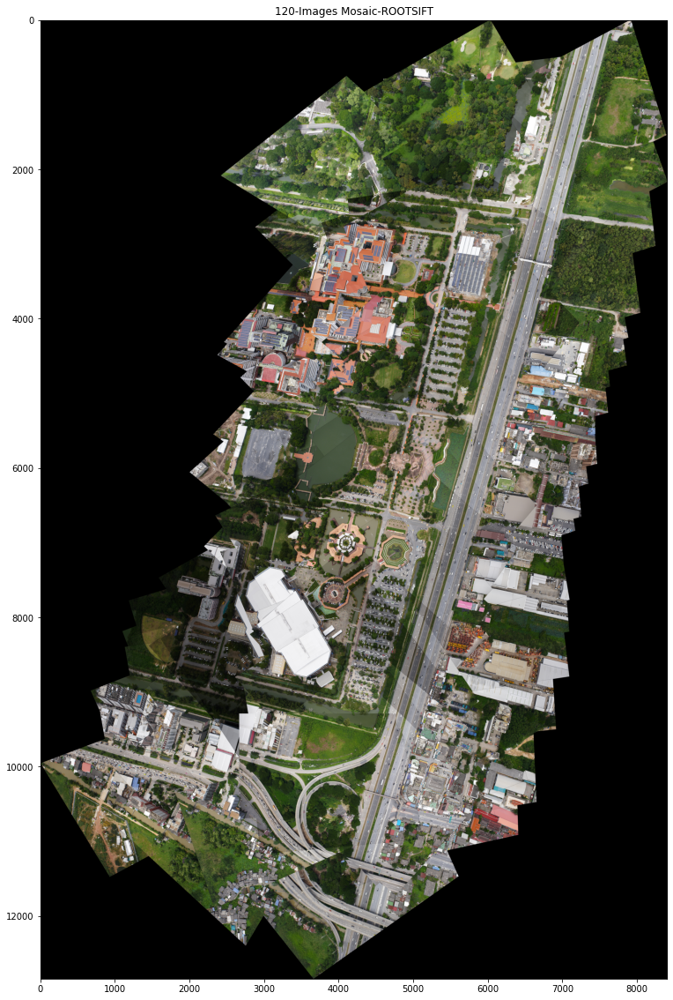

In [ ]:
fig,ax =plt.subplots()
fig.set_size_inches(20,20)
ax.imshow(cv2.cvtColor(warp_imgs_all_rootsift , cv2.COLOR_BGR2RGB))
ax.set_title('120-Images Mosaic-ROOTSIFT')

In [ ]:
xmax,xmin,ymax,ymin,t,h,w,Ht = warpnImages(images_left_bgr_no_enhance, images_right_bgr_no_enhance,H_left_sift,H_right_sift)

Step1:Done
Step2:Done


In [ ]:
warp_imgs_left = final_steps_left_union(images_left_bgr_no_enhance,H_left_sift,xmax,xmin,ymax,ymin,t,h,w,Ht)

Step31:Done


In [ ]:
warp_imgs_all_sift = final_steps_right_union(warp_imgs_left,images_right_bgr_no_enhance,H_right_sift,xmax,xmin,ymax,ymin,t,h,w,Ht)

Step32:Done


Text(0.5, 1.0, '120-Images Mosaic-SIFT')

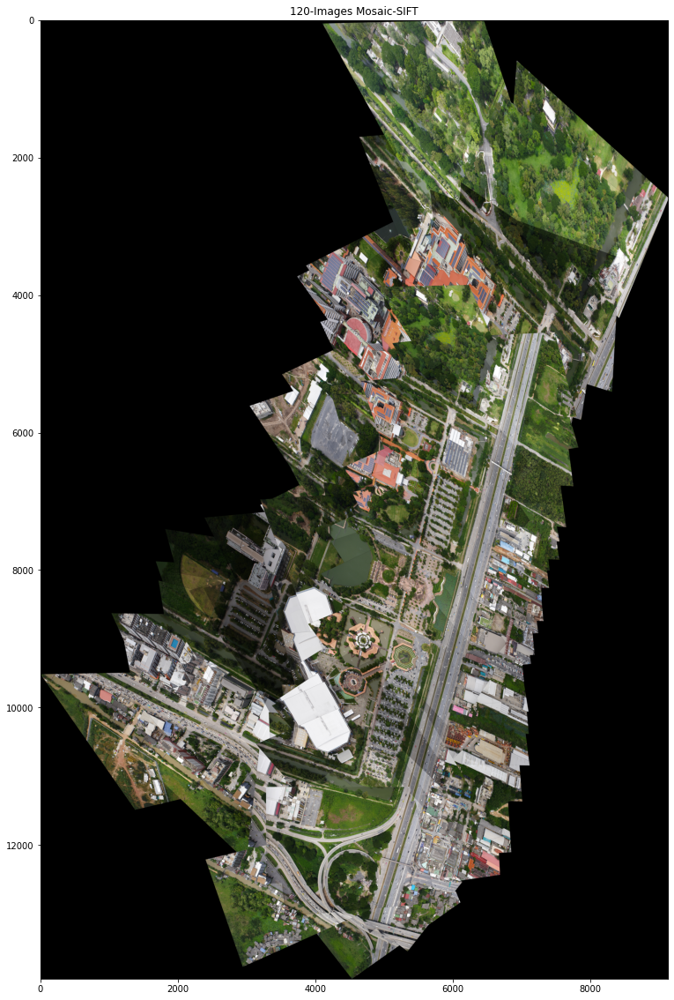

In [ ]:
fig,ax =plt.subplots()
fig.set_size_inches(20,20)
ax.imshow(cv2.cvtColor(warp_imgs_all_sift , cv2.COLOR_BGR2RGB))
ax.set_title('120-Images Mosaic-SIFT')

In [ ]:
akaze = cv2.AKAZE_create()


keypoints_all_left_akaze = []
descriptors_all_left_akaze = []
points_all_left_akaze=[]

keypoints_all_right_akaze = []
descriptors_all_right_akaze = []
points_all_right_akaze=[]

for imgs in tqdm(images_left_bgr):
  kpt = akaze.detect(imgs,None)
  kpt,descrip =  akaze.compute(imgs, kpt)
  keypoints_all_left_akaze.append(kpt)
  descriptors_all_left_akaze.append(descrip)
  points_all_left_akaze.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

for imgs in tqdm(images_right_bgr):
  kpt = akaze.detect(imgs,None)
  kpt,descrip =  akaze.compute(imgs, kpt)
  keypoints_all_right_akaze.append(kpt)
  descriptors_all_right_akaze.append(descrip)
  points_all_right_akaze.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

100%|██████████| 61/61 [01:28<00:00,  1.45s/it]


In [ ]:
def compute_homography_fast(matched_pts1, matched_pts2,thresh=4):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    cv2.RANSAC, ransacReprojThreshold =thresh)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def compute_homography_fast_other(matched_pts1, matched_pts2):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    0)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def get_Hmatrix(imgs,keypts,pts,descripts,ratio=0.8,thresh=4,disp=False):
  FLANN_INDEX_KDTREE = 2
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  #flann = cv2.BFMatcher()

  lff1 = np.float32(descripts[0])
  lff = np.float32(descripts[1])


  matches_lf1_lf = flann.knnMatch(lff1, lff, k=2)

  print("\nNumber of matches",len(matches_lf1_lf))

  matches_4 = []
  ratio = ratio
  # loop over the raw matches
  for m in matches_lf1_lf:
    # ensure the distance is within a certain ratio of each
    # other (i.e. Lowe’s ratio test)
    if len(m) == 2 and m[0].distance < m[1].distance * ratio:
        #matches_1.append((m[0].trainIdx, m[0].queryIdx))
        matches_4.append(m[0])

  print("Number of matches After Lowe's Ratio",len(matches_4))
  
  matches_idx = np.array([m.queryIdx for m in matches_4])
  imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
  matches_idx = np.array([m.trainIdx for m in matches_4])
  imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
  '''
  # Estimate homography 1
  #Compute H1
  # Estimate homography 1
  #Compute H1
  imm1_pts=np.empty((len(matches_4),2))
  imm2_pts=np.empty((len(matches_4),2))
  for i in range(0,len(matches_4)):
    m = matches_4[i]
    (a_x, a_y) = keypts[0][m.queryIdx].pt
    (b_x, b_y) = keypts[1][m.trainIdx].pt
    imm1_pts[i]=(a_x, a_y)
    imm2_pts[i]=(b_x, b_y)    
  H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  Hn, best_inliers=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1000, RANSACthresh=6)
  '''
  
  
  Hn,inliers = compute_homography_fast(imm1_pts,imm2_pts,thresh)  
  inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
  print("Number of Robust matches",len(inlier_matchset))
  print("\n")
  '''
  if len(inlier_matchset)<50:
    matches_4 = []
    ratio = 0.67
    # loop over the raw matches
    for m in matches_lf1_lf:
      # ensure the distance is within a certain ratio of each
      # other (i.e. Lowe’s ratio test)
      if len(m) == 2 and m[0].distance < m[1].distance * ratio:
          #matches_1.append((m[0].trainIdx, m[0].queryIdx))
          matches_4.append(m[0])
    print("Number of matches After Lowe's Ratio New",len(matches_4))
  
    matches_idx = np.array([m.queryIdx for m in matches_4])
    imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
    matches_idx = np.array([m.trainIdx for m in matches_4])
    imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
    Hn,inliers = compute_homography_fast_other(imm1_pts,imm2_pts)  
    inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
    print("Number of Robust matches New",len(inlier_matchset))
    print("\n")    
    '''
  #H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  #Hn=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1500, RANSACthresh=6)

  #global inlier_matchset   
  
  if disp==True:
    dispimg1=cv2.drawMatches(imgs[0], keypts[0], imgs[1], keypts[1], inlier_matchset, None,flags=2)
    displayplot(dispimg1,'Robust Matching between Reference Image and Right Image ')
  
  return Hn/Hn[2,2], len(matches_lf1_lf), len(inlier_matchset)

In [ ]:
from functools import partial
from tqdm import tqdm
tqdm = partial(tqdm, position=0, leave=True)

In [ ]:
print(left_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0062.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0061.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0060.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0059.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0058.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0057.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0056.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0055.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0053.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0052.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0051.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0050.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:

print(right_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0065.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0066.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0067.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0068.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0069.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0070.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0071.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0072.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0073.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0074.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0075.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0076.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0077.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
H_left_akaze = []
H_right_akaze = []

num_matches_akaze = []
num_good_matches_akaze = []

for j in tqdm(range(len(images_left))):
  if j==len(images_left)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_left_bgr[j:j+2][::-1],keypoints_all_left_akaze[j:j+2][::-1],points_all_left_akaze[j:j+2][::-1],descriptors_all_left_akaze[j:j+2][::-1])
  H_left_akaze.append(H_a)
  num_matches_akaze.append(matches)
  num_good_matches_akaze.append(gd_matches)

for j in tqdm(range(len(images_right))):
  if j==len(images_right)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_right_bgr[j:j+2][::-1],keypoints_all_right_akaze[j:j+2][::-1],points_all_right_akaze[j:j+2][::-1],descriptors_all_right_akaze[j:j+2][::-1])
  H_right_akaze.append(H_a)
  #num_matches.append(matches)
  #num_good_matches.append(gd_matches)

  2%|▏         | 1/61 [00:01<01:37,  1.63s/it]


Number of matches 20771
Number of matches After Lowe's Ratio 2771
Number of Robust matches 2138




  3%|▎         | 2/61 [00:03<01:38,  1.67s/it]


Number of matches 18233
Number of matches After Lowe's Ratio 2533
Number of Robust matches 1689




  5%|▍         | 3/61 [00:04<01:32,  1.60s/it]


Number of matches 16819
Number of matches After Lowe's Ratio 1416
Number of Robust matches 834




  7%|▋         | 4/61 [00:06<01:27,  1.53s/it]


Number of matches 16167
Number of matches After Lowe's Ratio 992
Number of Robust matches 437




  8%|▊         | 5/61 [00:07<01:23,  1.49s/it]


Number of matches 21720
Number of matches After Lowe's Ratio 912
Number of Robust matches 264




 10%|▉         | 6/61 [00:09<01:27,  1.58s/it]


Number of matches 18547
Number of matches After Lowe's Ratio 453
Number of Robust matches 32




 11%|█▏        | 7/61 [00:10<01:24,  1.57s/it]


Number of matches 18110
Number of matches After Lowe's Ratio 2194
Number of Robust matches 1278




 13%|█▎        | 8/61 [00:12<01:22,  1.55s/it]


Number of matches 18754
Number of matches After Lowe's Ratio 2316
Number of Robust matches 1354




 15%|█▍        | 9/61 [00:14<01:20,  1.56s/it]


Number of matches 19049
Number of matches After Lowe's Ratio 2346
Number of Robust matches 1152




 16%|█▋        | 10/61 [00:15<01:22,  1.62s/it]


Number of matches 20428
Number of matches After Lowe's Ratio 2484
Number of Robust matches 1632




 18%|█▊        | 11/61 [00:17<01:21,  1.62s/it]


Number of matches 15748
Number of matches After Lowe's Ratio 1184
Number of Robust matches 656




 20%|█▉        | 12/61 [00:18<01:14,  1.51s/it]


Number of matches 21469
Number of matches After Lowe's Ratio 1957
Number of Robust matches 1212




 21%|██▏       | 13/61 [00:20<01:15,  1.58s/it]


Number of matches 15853
Number of matches After Lowe's Ratio 1151
Number of Robust matches 722




 23%|██▎       | 14/61 [00:21<01:09,  1.47s/it]


Number of matches 20465
Number of matches After Lowe's Ratio 2264
Number of Robust matches 1608




 25%|██▍       | 15/61 [00:23<01:13,  1.59s/it]


Number of matches 19280
Number of matches After Lowe's Ratio 2629
Number of Robust matches 1943




 26%|██▌       | 16/61 [00:25<01:13,  1.63s/it]


Number of matches 21349
Number of matches After Lowe's Ratio 2754
Number of Robust matches 1686




 28%|██▊       | 17/61 [00:27<01:14,  1.69s/it]


Number of matches 21345
Number of matches After Lowe's Ratio 4068
Number of Robust matches 3336




 30%|██▉       | 18/61 [00:28<01:15,  1.75s/it]


Number of matches 20541
Number of matches After Lowe's Ratio 3246
Number of Robust matches 2180




 31%|███       | 19/61 [00:30<01:15,  1.81s/it]


Number of matches 19544
Number of matches After Lowe's Ratio 3443
Number of Robust matches 2756




 33%|███▎      | 20/61 [00:32<01:12,  1.78s/it]


Number of matches 19557
Number of matches After Lowe's Ratio 3231
Number of Robust matches 2622




 34%|███▍      | 21/61 [00:34<01:10,  1.77s/it]


Number of matches 19398
Number of matches After Lowe's Ratio 4099
Number of Robust matches 3259




 36%|███▌      | 22/61 [00:36<01:08,  1.76s/it]


Number of matches 19838
Number of matches After Lowe's Ratio 4588
Number of Robust matches 2759




 38%|███▊      | 23/61 [00:37<01:08,  1.81s/it]


Number of matches 19744
Number of matches After Lowe's Ratio 4090
Number of Robust matches 3181




 39%|███▉      | 24/61 [00:39<01:06,  1.79s/it]


Number of matches 20624
Number of matches After Lowe's Ratio 3446
Number of Robust matches 2302




 41%|████      | 25/61 [00:41<01:05,  1.82s/it]


Number of matches 19950
Number of matches After Lowe's Ratio 3065
Number of Robust matches 1969




 43%|████▎     | 26/61 [00:43<01:03,  1.81s/it]


Number of matches 20566
Number of matches After Lowe's Ratio 2818
Number of Robust matches 1656




 44%|████▍     | 27/61 [00:45<01:03,  1.86s/it]


Number of matches 20559
Number of matches After Lowe's Ratio 2345
Number of Robust matches 1503




 46%|████▌     | 28/61 [00:47<01:02,  1.88s/it]


Number of matches 24258
Number of matches After Lowe's Ratio 2096
Number of Robust matches 1058




 48%|████▊     | 29/61 [00:49<01:03,  1.98s/it]


Number of matches 20958
Number of matches After Lowe's Ratio 1770
Number of Robust matches 805




 49%|████▉     | 30/61 [00:51<01:00,  1.94s/it]


Number of matches 22246
Number of matches After Lowe's Ratio 2168
Number of Robust matches 1086




 51%|█████     | 31/61 [00:53<00:59,  1.99s/it]


Number of matches 20947
Number of matches After Lowe's Ratio 2174
Number of Robust matches 956




 52%|█████▏    | 32/61 [00:55<00:57,  1.98s/it]


Number of matches 24081
Number of matches After Lowe's Ratio 1466
Number of Robust matches 696




 54%|█████▍    | 33/61 [00:57<00:57,  2.06s/it]


Number of matches 22618
Number of matches After Lowe's Ratio 1550
Number of Robust matches 743




 56%|█████▌    | 34/61 [00:59<00:55,  2.07s/it]


Number of matches 23539
Number of matches After Lowe's Ratio 974
Number of Robust matches 339




 57%|█████▋    | 35/61 [01:01<00:54,  2.10s/it]


Number of matches 19832
Number of matches After Lowe's Ratio 509
Number of Robust matches 91




 59%|█████▉    | 36/61 [01:03<00:51,  2.04s/it]


Number of matches 19393
Number of matches After Lowe's Ratio 1880
Number of Robust matches 1112




 61%|██████    | 37/61 [01:05<00:46,  1.94s/it]


Number of matches 17976
Number of matches After Lowe's Ratio 2029
Number of Robust matches 1123




 62%|██████▏   | 38/61 [01:07<00:42,  1.83s/it]


Number of matches 19408
Number of matches After Lowe's Ratio 2038
Number of Robust matches 1330




 64%|██████▍   | 39/61 [01:08<00:40,  1.83s/it]


Number of matches 23039
Number of matches After Lowe's Ratio 2445
Number of Robust matches 1157




 66%|██████▌   | 40/61 [01:11<00:41,  2.00s/it]


Number of matches 26557
Number of matches After Lowe's Ratio 2009
Number of Robust matches 895




 67%|██████▋   | 41/61 [01:14<00:44,  2.23s/it]


Number of matches 28674
Number of matches After Lowe's Ratio 2334
Number of Robust matches 837




 69%|██████▉   | 42/61 [01:16<00:45,  2.41s/it]


Number of matches 25251
Number of matches After Lowe's Ratio 2282
Number of Robust matches 1112




 70%|███████   | 43/61 [01:19<00:42,  2.38s/it]


Number of matches 22062
Number of matches After Lowe's Ratio 2503
Number of Robust matches 1256




 72%|███████▏  | 44/61 [01:21<00:38,  2.28s/it]


Number of matches 20521
Number of matches After Lowe's Ratio 2752
Number of Robust matches 1694




 74%|███████▍  | 45/61 [01:23<00:34,  2.13s/it]


Number of matches 19126
Number of matches After Lowe's Ratio 2973
Number of Robust matches 2084




 75%|███████▌  | 46/61 [01:24<00:29,  1.99s/it]


Number of matches 20186
Number of matches After Lowe's Ratio 3542
Number of Robust matches 2400




 77%|███████▋  | 47/61 [01:26<00:27,  1.96s/it]


Number of matches 21213
Number of matches After Lowe's Ratio 3222
Number of Robust matches 2105




 79%|███████▊  | 48/61 [01:28<00:25,  1.99s/it]


Number of matches 21932
Number of matches After Lowe's Ratio 3671
Number of Robust matches 2600




 80%|████████  | 49/61 [01:30<00:23,  1.98s/it]


Number of matches 21264
Number of matches After Lowe's Ratio 3867
Number of Robust matches 2710




 82%|████████▏ | 50/61 [01:32<00:21,  1.96s/it]


Number of matches 20833
Number of matches After Lowe's Ratio 3435
Number of Robust matches 2351




 84%|████████▎ | 51/61 [01:34<00:19,  1.93s/it]


Number of matches 18699
Number of matches After Lowe's Ratio 2042
Number of Robust matches 1483




 85%|████████▌ | 52/61 [01:36<00:16,  1.87s/it]


Number of matches 17733
Number of matches After Lowe's Ratio 3761
Number of Robust matches 2567




 87%|████████▋ | 53/61 [01:37<00:14,  1.78s/it]


Number of matches 18293
Number of matches After Lowe's Ratio 3658
Number of Robust matches 2521




 89%|████████▊ | 54/61 [01:39<00:11,  1.70s/it]


Number of matches 16473
Number of matches After Lowe's Ratio 2108
Number of Robust matches 1475




 90%|█████████ | 55/61 [01:40<00:09,  1.60s/it]


Number of matches 17759
Number of matches After Lowe's Ratio 2207
Number of Robust matches 1543




 92%|█████████▏| 56/61 [01:42<00:07,  1.58s/it]


Number of matches 18253
Number of matches After Lowe's Ratio 2934
Number of Robust matches 2088




 93%|█████████▎| 57/61 [01:43<00:06,  1.63s/it]


Number of matches 18717
Number of matches After Lowe's Ratio 1960
Number of Robust matches 1329




 95%|█████████▌| 58/61 [01:45<00:04,  1.63s/it]


Number of matches 18943
Number of matches After Lowe's Ratio 2367
Number of Robust matches 1705




 97%|█████████▋| 59/61 [01:47<00:03,  1.63s/it]


Number of matches 18446
Number of matches After Lowe's Ratio 2211
Number of Robust matches 1335




  0%|          | 0/61 [00:00<?, ?it/s]


Number of matches 17535
Number of matches After Lowe's Ratio 406
Number of Robust matches 41




  2%|▏         | 1/61 [00:01<01:49,  1.82s/it]


Number of matches 18297
Number of matches After Lowe's Ratio 2821
Number of Robust matches 1942




  3%|▎         | 2/61 [00:03<01:44,  1.77s/it]


Number of matches 15660
Number of matches After Lowe's Ratio 1380
Number of Robust matches 923




  5%|▍         | 3/61 [00:04<01:33,  1.61s/it]


Number of matches 19968
Number of matches After Lowe's Ratio 635
Number of Robust matches 212




  7%|▋         | 4/61 [00:06<01:32,  1.63s/it]


Number of matches 15728
Number of matches After Lowe's Ratio 2108
Number of Robust matches 1445




  8%|▊         | 5/61 [00:07<01:24,  1.52s/it]


Number of matches 21692
Number of matches After Lowe's Ratio 1802
Number of Robust matches 1173




 10%|▉         | 6/61 [00:09<01:33,  1.70s/it]


Number of matches 21865
Number of matches After Lowe's Ratio 3663
Number of Robust matches 2834




 11%|█▏        | 7/61 [00:11<01:36,  1.78s/it]


Number of matches 21455
Number of matches After Lowe's Ratio 5035
Number of Robust matches 3513




 13%|█▎        | 8/61 [00:13<01:36,  1.82s/it]


Number of matches 19571
Number of matches After Lowe's Ratio 4046
Number of Robust matches 3312




 15%|█▍        | 9/61 [00:15<01:33,  1.80s/it]


Number of matches 20134
Number of matches After Lowe's Ratio 3960
Number of Robust matches 3264




 16%|█▋        | 10/61 [00:17<01:35,  1.87s/it]


Number of matches 21099
Number of matches After Lowe's Ratio 2829
Number of Robust matches 2224




 18%|█▊        | 11/61 [00:19<01:34,  1.89s/it]


Number of matches 22136
Number of matches After Lowe's Ratio 3622
Number of Robust matches 2670




 20%|█▉        | 12/61 [00:21<01:35,  1.95s/it]


Number of matches 23198
Number of matches After Lowe's Ratio 2971
Number of Robust matches 1975




 21%|██▏       | 13/61 [00:23<01:38,  2.04s/it]


Number of matches 24310
Number of matches After Lowe's Ratio 2914
Number of Robust matches 1413




 23%|██▎       | 14/61 [00:26<01:42,  2.18s/it]


Number of matches 24654
Number of matches After Lowe's Ratio 3161
Number of Robust matches 1671




 25%|██▍       | 15/61 [00:28<01:42,  2.24s/it]


Number of matches 22984
Number of matches After Lowe's Ratio 3124
Number of Robust matches 1766




 26%|██▌       | 16/61 [00:30<01:39,  2.21s/it]


Number of matches 21716
Number of matches After Lowe's Ratio 2699
Number of Robust matches 1344




 28%|██▊       | 17/61 [00:32<01:34,  2.14s/it]


Number of matches 22411
Number of matches After Lowe's Ratio 3366
Number of Robust matches 1415




 30%|██▉       | 18/61 [00:34<01:32,  2.14s/it]


Number of matches 20504
Number of matches After Lowe's Ratio 2674
Number of Robust matches 1124




 31%|███       | 19/61 [00:36<01:25,  2.05s/it]


Number of matches 20204
Number of matches After Lowe's Ratio 2706
Number of Robust matches 1178




 33%|███▎      | 20/61 [00:38<01:21,  1.98s/it]


Number of matches 20233
Number of matches After Lowe's Ratio 2179
Number of Robust matches 1195




 34%|███▍      | 21/61 [00:40<01:20,  2.01s/it]


Number of matches 27287
Number of matches After Lowe's Ratio 810
Number of Robust matches 205




 36%|███▌      | 22/61 [00:43<01:28,  2.26s/it]


Number of matches 25609
Number of matches After Lowe's Ratio 1285
Number of Robust matches 417




 38%|███▊      | 23/61 [00:46<01:29,  2.37s/it]


Number of matches 29338
Number of matches After Lowe's Ratio 473
Number of Robust matches 5




 39%|███▉      | 24/61 [00:48<01:33,  2.52s/it]


Number of matches 24561
Number of matches After Lowe's Ratio 1224
Number of Robust matches 427




 41%|████      | 25/61 [00:51<01:28,  2.45s/it]


Number of matches 22164
Number of matches After Lowe's Ratio 2307
Number of Robust matches 889




 43%|████▎     | 26/61 [00:53<01:22,  2.35s/it]


Number of matches 20348
Number of matches After Lowe's Ratio 2242
Number of Robust matches 922




 44%|████▍     | 27/61 [00:55<01:14,  2.18s/it]


Number of matches 19519
Number of matches After Lowe's Ratio 1953
Number of Robust matches 863




 46%|████▌     | 28/61 [00:56<01:07,  2.04s/it]


Number of matches 20911
Number of matches After Lowe's Ratio 2006
Number of Robust matches 690




 48%|████▊     | 29/61 [00:58<01:03,  2.00s/it]


Number of matches 20565
Number of matches After Lowe's Ratio 1822
Number of Robust matches 767




 49%|████▉     | 30/61 [01:00<01:02,  2.00s/it]


Number of matches 20347
Number of matches After Lowe's Ratio 3746
Number of Robust matches 1511




 51%|█████     | 31/61 [01:02<00:58,  1.96s/it]


Number of matches 22441
Number of matches After Lowe's Ratio 1806
Number of Robust matches 762




 52%|█████▏    | 32/61 [01:04<00:57,  1.99s/it]


Number of matches 21870
Number of matches After Lowe's Ratio 3182
Number of Robust matches 1483




 54%|█████▍    | 33/61 [01:06<00:55,  1.98s/it]


Number of matches 20671
Number of matches After Lowe's Ratio 2331
Number of Robust matches 1177




 56%|█████▌    | 34/61 [01:08<00:53,  1.97s/it]


Number of matches 18732
Number of matches After Lowe's Ratio 2444
Number of Robust matches 1455




 57%|█████▋    | 35/61 [01:10<00:48,  1.87s/it]


Number of matches 18770
Number of matches After Lowe's Ratio 1739
Number of Robust matches 1328




 59%|█████▉    | 36/61 [01:11<00:44,  1.79s/it]


Number of matches 18471
Number of matches After Lowe's Ratio 1814
Number of Robust matches 1295




 61%|██████    | 37/61 [01:13<00:41,  1.73s/it]


Number of matches 17991
Number of matches After Lowe's Ratio 2186
Number of Robust matches 1385




 62%|██████▏   | 38/61 [01:14<00:38,  1.68s/it]


Number of matches 17772
Number of matches After Lowe's Ratio 3524
Number of Robust matches 2534




 64%|██████▍   | 39/61 [01:16<00:37,  1.69s/it]


Number of matches 19455
Number of matches After Lowe's Ratio 2587
Number of Robust matches 1750




 66%|██████▌   | 40/61 [01:18<00:35,  1.70s/it]


Number of matches 19249
Number of matches After Lowe's Ratio 4178
Number of Robust matches 2633




 67%|██████▋   | 41/61 [01:19<00:32,  1.64s/it]


Number of matches 11374
Number of matches After Lowe's Ratio 1293
Number of Robust matches 768




 69%|██████▉   | 42/61 [01:20<00:26,  1.39s/it]


Number of matches 9212
Number of matches After Lowe's Ratio 1262
Number of Robust matches 638




 70%|███████   | 43/61 [01:21<00:20,  1.15s/it]


Number of matches 8884
Number of matches After Lowe's Ratio 810
Number of Robust matches 396




 72%|███████▏  | 44/61 [01:21<00:16,  1.01it/s]


Number of matches 10223
Number of matches After Lowe's Ratio 1901
Number of Robust matches 1129




 74%|███████▍  | 45/61 [01:22<00:14,  1.07it/s]


Number of matches 16870
Number of matches After Lowe's Ratio 1627
Number of Robust matches 1125




 75%|███████▌  | 46/61 [01:24<00:17,  1.14s/it]


Number of matches 18877
Number of matches After Lowe's Ratio 2674
Number of Robust matches 1743




 77%|███████▋  | 47/61 [01:26<00:18,  1.30s/it]


Number of matches 18688
Number of matches After Lowe's Ratio 2534
Number of Robust matches 1366




 79%|███████▊  | 48/61 [01:27<00:17,  1.38s/it]


Number of matches 17070
Number of matches After Lowe's Ratio 2077
Number of Robust matches 1368




 80%|████████  | 49/61 [01:29<00:16,  1.41s/it]


Number of matches 19473
Number of matches After Lowe's Ratio 2311
Number of Robust matches 1466




 82%|████████▏ | 50/61 [01:30<00:16,  1.54s/it]


Number of matches 22561
Number of matches After Lowe's Ratio 2091
Number of Robust matches 1176




 84%|████████▎ | 51/61 [01:33<00:17,  1.76s/it]


Number of matches 23442
Number of matches After Lowe's Ratio 710
Number of Robust matches 201




 85%|████████▌ | 52/61 [01:35<00:16,  1.86s/it]


Number of matches 20704
Number of matches After Lowe's Ratio 1465
Number of Robust matches 792




 87%|████████▋ | 53/61 [01:37<00:14,  1.86s/it]


Number of matches 20471
Number of matches After Lowe's Ratio 2222
Number of Robust matches 1126




 89%|████████▊ | 54/61 [01:38<00:12,  1.83s/it]


Number of matches 18228
Number of matches After Lowe's Ratio 1362
Number of Robust matches 769




 90%|█████████ | 55/61 [01:40<00:10,  1.76s/it]


Number of matches 14142
Number of matches After Lowe's Ratio 2238
Number of Robust matches 1043




 92%|█████████▏| 56/61 [01:41<00:07,  1.53s/it]


Number of matches 11021
Number of matches After Lowe's Ratio 2181
Number of Robust matches 1574




 93%|█████████▎| 57/61 [01:42<00:05,  1.30s/it]


Number of matches 10323
Number of matches After Lowe's Ratio 2081
Number of Robust matches 1495




 95%|█████████▌| 58/61 [01:42<00:03,  1.12s/it]


Number of matches 11051
Number of matches After Lowe's Ratio 2075
Number of Robust matches 1201




 97%|█████████▋| 59/61 [01:43<00:02,  1.02s/it]


Number of matches 12642
Number of matches After Lowe's Ratio 2221
Number of Robust matches 1361




 98%|█████████▊| 60/61 [01:44<00:01,  1.01s/it]


Number of matches 16172
Number of matches After Lowe's Ratio 2065
Number of Robust matches 1086




In [ ]:
def warpnImages(images_left, images_right,H_left,H_right):
    #img1-centre,img2-left,img3-right

    h, w = images_left[0].shape[:2]

    pts_left = []
    pts_right = []

    pts_centre = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)

    for j in range(len(H_left)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_left.append(pts)

    for j in range(len(H_right)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_right.append(pts)

    pts_left_transformed=[]
    pts_right_transformed=[]



    for j,pts in enumerate(pts_left):
      if j==0:
        H_trans = H_left[j]
      else:
        H_trans = H_trans@H_left[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_left_transformed.append(pts_)

    for j,pts in enumerate(pts_right):
      if j==0:
        H_trans = H_right[j]
      else:
        H_trans = H_trans@H_right[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_right_transformed.append(pts_)


    print('Step1:Done')


    #pts = np.concatenate((pts1, pts2_), axis=0)

    pts_concat = np.concatenate((pts_centre,np.concatenate(np.array(pts_left_transformed),axis=0),np.concatenate(np.array(pts_right_transformed),axis=0)), axis=0)

    [xmin, ymin] = np.int32(pts_concat.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts_concat.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    print('Step2:Done')


    return xmax,xmin,ymax,ymin,t,h,w,Ht

In [ ]:
def final_steps_left(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_left = []


    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_left[j+1], H_trans, (xmax-xmin, ymax-ymin))

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
      
      warp_imgs_left.append(result)

    print('Step31:Done')

    return warp_imgs_left

def final_steps_right(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_right = []

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_right[j+1], H_trans, (xmax-xmin, ymax-ymin))
      
      warp_imgs_right.append(result)

    print('Step32:Done')

    return warp_imgs_right

def final_steps_union(warp_imgs_left,warp_imgs_right):
    #Union

    warp_images_all = warp_imgs_left + warp_imgs_right

    warp_img_init = warp_images_all[0]



    #warp_final_all=[]

    for j,warp_img in enumerate(warp_images_all):
      if j==len(warp_images_all)-1:
        break
      black_pixels = np.where((warp_img_init[:, :, 0] == 0) & (warp_img_init[:, :, 1] == 0) & (warp_img_init[:, :, 2] == 0))

      warp_img_init[black_pixels] = warp_images_all[j+1][black_pixels]
    
      #warp_final = np.maximum(warp_img_init,warp_images_all[j+1])
      #warp_img_init = warp_final
      #warp_final_all.append(warp_final)

    print('Step4:Done')


    return warp_img_init

In [ ]:
def final_steps_left_union(images_left,H_left,xmax,xmin,ymax,ymin,t,h,w,Ht):



    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_left[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
        warp_img_init_prev = result
        continue

      black_pixels = np.where((warp_img_init_prev[:, :, 0] == 0) & (warp_img_init_prev[:, :, 1] == 0) & (warp_img_init_prev[:, :, 2] == 0))

      warp_img_init_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step31:Done')

    return warp_img_init_prev

def final_steps_right_union(warp_img_prev,images_right,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_right[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      black_pixels = np.where((warp_img_prev[:, :, 0] == 0) & (warp_img_prev[:, :, 1] == 0) & (warp_img_prev[:, :, 2] == 0))

      warp_img_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step32:Done')

    return warp_img_prev

In [ ]:
xmax,xmin,ymax,ymin,t,h,w,Ht = warpnImages(images_left_bgr_no_enhance, images_right_bgr_no_enhance,H_left_akaze,H_right_akaze)

Step1:Done
Step2:Done


In [ ]:
warp_imgs_left = final_steps_left_union(images_left_bgr_no_enhance,H_left_akaze,xmax,xmin,ymax,ymin,t,h,w,Ht)

In [ ]:
warp_imgs_all_akaze = final_steps_right_union(warp_imgs_left,images_right_bgr_no_enhance,H_right_akaze,xmax,xmin,ymax,ymin,t,h,w,Ht)

Step32:Done


Text(0.5, 1.0, '101-Images Mosaic-AKAZE')

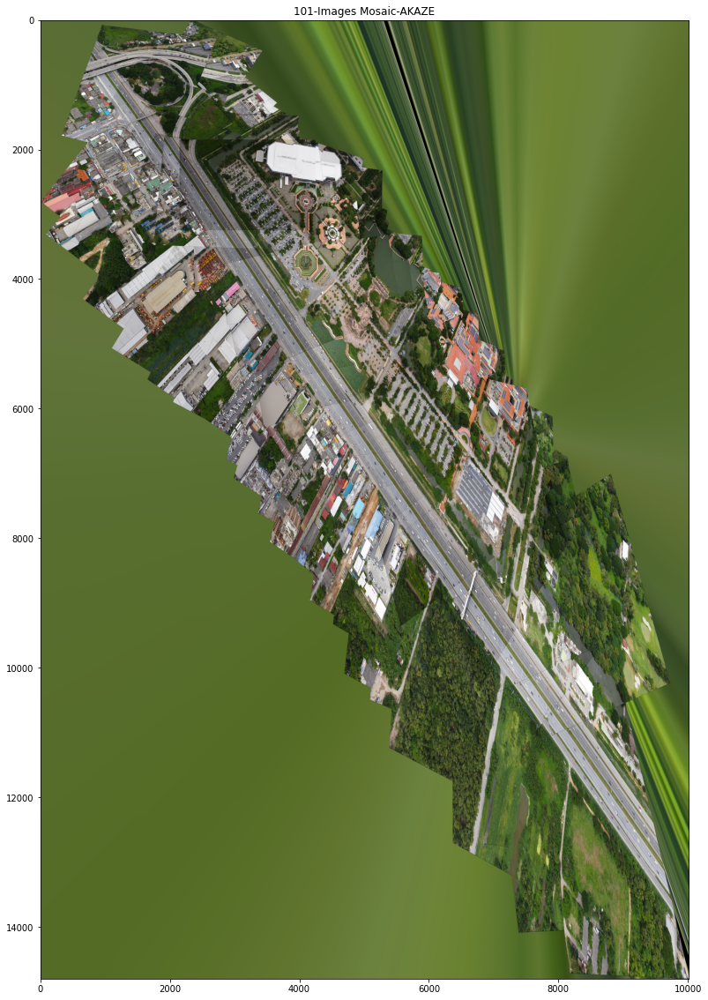

In [ ]:
fig,ax =plt.subplots()
fig.set_size_inches(20,20)
ax.imshow(cv2.cvtColor(warp_imgs_all_akaze , cv2.COLOR_BGR2RGB))
ax.set_title('101-Images Mosaic-AKAZE')

In [ ]:
Threshl=60;
Octaves=8; 
#PatternScales=1.0f;
brisk = cv2.BRISK_create(Threshl,Octaves)


keypoints_all_left_brisk = []
descriptors_all_left_brisk = []
points_all_left_brisk=[]

keypoints_all_right_brisk = []
descriptors_all_right_brisk = []
points_all_right_brisk=[]

for imgs in tqdm(images_left_bgr):
  kpt = brisk.detect(imgs,None)
  kpt,descrip =  brisk.compute(imgs, kpt)
  keypoints_all_left_brisk.append(kpt)
  descriptors_all_left_brisk.append(descrip)
  points_all_left_brisk.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

for imgs in tqdm(images_right_bgr):
  kpt = brisk.detect(imgs,None)
  kpt,descrip =  brisk.compute(imgs, kpt)
  keypoints_all_right_brisk.append(kpt)
  descriptors_all_right_brisk.append(descrip)
  points_all_right_brisk.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

100%|██████████| 61/61 [00:55<00:00,  1.10it/s]


In [ ]:
def compute_homography_fast(matched_pts1, matched_pts2,thresh=4):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    cv2.RANSAC, ransacReprojThreshold =thresh)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def compute_homography_fast_other(matched_pts1, matched_pts2):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    0)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def get_Hmatrix(imgs,keypts,pts,descripts,ratio=0.8,thresh=4,disp=False):
  FLANN_INDEX_KDTREE = 2
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  #flann = cv2.BFMatcher()

  lff1 = np.float32(descripts[0])
  lff = np.float32(descripts[1])


  matches_lf1_lf = flann.knnMatch(lff1, lff, k=2)

  print("\nNumber of matches",len(matches_lf1_lf))

  matches_4 = []
  ratio = ratio
  # loop over the raw matches
  for m in matches_lf1_lf:
    # ensure the distance is within a certain ratio of each
    # other (i.e. Lowe’s ratio test)
    if len(m) == 2 and m[0].distance < m[1].distance * ratio:
        #matches_1.append((m[0].trainIdx, m[0].queryIdx))
        matches_4.append(m[0])

  print("Number of matches After Lowe's Ratio",len(matches_4))
  
  matches_idx = np.array([m.queryIdx for m in matches_4])
  imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
  matches_idx = np.array([m.trainIdx for m in matches_4])
  imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
  '''
  # Estimate homography 1
  #Compute H1
  # Estimate homography 1
  #Compute H1
  imm1_pts=np.empty((len(matches_4),2))
  imm2_pts=np.empty((len(matches_4),2))
  for i in range(0,len(matches_4)):
    m = matches_4[i]
    (a_x, a_y) = keypts[0][m.queryIdx].pt
    (b_x, b_y) = keypts[1][m.trainIdx].pt
    imm1_pts[i]=(a_x, a_y)
    imm2_pts[i]=(b_x, b_y)    
  H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  Hn, best_inliers=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1000, RANSACthresh=6)
  '''
  
  
  Hn,inliers = compute_homography_fast(imm1_pts,imm2_pts,thresh)  
  inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
  print("Number of Robust matches",len(inlier_matchset))
  print("\n")
  '''
  if len(inlier_matchset)<50:
    matches_4 = []
    ratio = 0.67
    # loop over the raw matches
    for m in matches_lf1_lf:
      # ensure the distance is within a certain ratio of each
      # other (i.e. Lowe’s ratio test)
      if len(m) == 2 and m[0].distance < m[1].distance * ratio:
          #matches_1.append((m[0].trainIdx, m[0].queryIdx))
          matches_4.append(m[0])
    print("Number of matches After Lowe's Ratio New",len(matches_4))
  
    matches_idx = np.array([m.queryIdx for m in matches_4])
    imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
    matches_idx = np.array([m.trainIdx for m in matches_4])
    imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
    Hn,inliers = compute_homography_fast_other(imm1_pts,imm2_pts)  
    inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
    print("Number of Robust matches New",len(inlier_matchset))
    print("\n")    
    '''
  #H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  #Hn=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1500, RANSACthresh=6)

  #global inlier_matchset   
  
  if disp==True:
    dispimg1=cv2.drawMatches(imgs[0], keypts[0], imgs[1], keypts[1], inlier_matchset, None,flags=2)
    displayplot(dispimg1,'Robust Matching between Reference Image and Right Image ')
  
  return Hn/Hn[2,2], len(matches_lf1_lf), len(inlier_matchset)

In [ ]:
from functools import partial
from tqdm import tqdm
tqdm = partial(tqdm, position=0, leave=True)

In [ ]:
print(left_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0062.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0061.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0060.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0059.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0058.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0057.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0056.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0055.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0053.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0052.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0051.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0050.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
print(right_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0065.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0066.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0067.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0068.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0069.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0070.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0071.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0072.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0073.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0074.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0075.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0076.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0077.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
H_left_brisk = []
H_right_brisk = []

num_matches_brisk = []
num_good_matches_brisk = []

for j in tqdm(range(len(images_left))):
  if j==len(images_left)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_left_bgr[j:j+2][::-1],keypoints_all_left_brisk[j:j+2][::-1],points_all_left_brisk[j:j+2][::-1],descriptors_all_left_brisk[j:j+2][::-1],0.9,6)
  H_left_brisk.append(H_a)
  num_matches_brisk.append(matches)
  num_good_matches_brisk.append(gd_matches)

for j in tqdm(range(len(images_right))):
  if j==len(images_right)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_right_bgr[j:j+2][::-1],keypoints_all_right_brisk[j:j+2][::-1],points_all_right_brisk[j:j+2][::-1],descriptors_all_right_brisk[j:j+2][::-1],0.9,6)
  H_right_brisk.append(H_a)
  #num_matches.append(matches)
  #num_good_matches.append(gd_matches)

  2%|▏         | 1/61 [00:03<03:25,  3.43s/it]


Number of matches 35128
Number of matches After Lowe's Ratio 6689
Number of Robust matches 2415




  3%|▎         | 2/61 [00:07<03:31,  3.58s/it]


Number of matches 24778
Number of matches After Lowe's Ratio 5020
Number of Robust matches 1933




  5%|▍         | 3/61 [00:09<03:07,  3.24s/it]


Number of matches 23035
Number of matches After Lowe's Ratio 3966
Number of Robust matches 641




  7%|▋         | 4/61 [00:12<02:49,  2.97s/it]


Number of matches 25059
Number of matches After Lowe's Ratio 4426
Number of Robust matches 368




  8%|▊         | 5/61 [00:15<02:50,  3.05s/it]


Number of matches 30921
Number of matches After Lowe's Ratio 4775
Number of Robust matches 384




 10%|▉         | 6/61 [00:18<02:56,  3.21s/it]


Number of matches 26028
Number of matches After Lowe's Ratio 3604
Number of Robust matches 8




 11%|█▏        | 7/61 [00:21<02:49,  3.14s/it]


Number of matches 23435
Number of matches After Lowe's Ratio 4818
Number of Robust matches 1510




 13%|█▎        | 8/61 [00:24<02:44,  3.10s/it]


Number of matches 28302
Number of matches After Lowe's Ratio 5980
Number of Robust matches 1689




 15%|█▍        | 9/61 [00:28<02:45,  3.18s/it]


Number of matches 26534
Number of matches After Lowe's Ratio 5242
Number of Robust matches 1454




 16%|█▋        | 10/61 [00:31<02:43,  3.21s/it]


Number of matches 32280
Number of matches After Lowe's Ratio 6646
Number of Robust matches 1993




 18%|█▊        | 11/61 [00:35<02:45,  3.32s/it]


Number of matches 22854
Number of matches After Lowe's Ratio 4343
Number of Robust matches 1030




 20%|█▉        | 12/61 [00:37<02:34,  3.15s/it]


Number of matches 31108
Number of matches After Lowe's Ratio 6124
Number of Robust matches 1879



Number of matches 26430
Number of matches After Lowe's Ratio 5131


 21%|██▏       | 13/61 [00:41<02:37,  3.29s/it]

Number of Robust matches 1186




 23%|██▎       | 14/61 [00:44<02:31,  3.23s/it]


Number of matches 32653
Number of matches After Lowe's Ratio 6913
Number of Robust matches 2372




 25%|██▍       | 15/61 [00:48<02:40,  3.48s/it]


Number of matches 32146
Number of matches After Lowe's Ratio 7173
Number of Robust matches 2909




 26%|██▌       | 16/61 [00:52<02:45,  3.68s/it]


Number of matches 37734
Number of matches After Lowe's Ratio 7867
Number of Robust matches 2837



Number of matches 37547
Number of matches After Lowe's Ratio 8926


 28%|██▊       | 17/61 [00:57<02:59,  4.07s/it]

Number of Robust matches 4506




 30%|██▉       | 18/61 [01:02<03:01,  4.21s/it]


Number of matches 34839
Number of matches After Lowe's Ratio 7881
Number of Robust matches 3356




 31%|███       | 19/61 [01:06<02:53,  4.13s/it]


Number of matches 30911
Number of matches After Lowe's Ratio 7308
Number of Robust matches 3264




 33%|███▎      | 20/61 [01:09<02:43,  3.99s/it]


Number of matches 32047
Number of matches After Lowe's Ratio 7269
Number of Robust matches 2913




 34%|███▍      | 21/61 [01:13<02:36,  3.90s/it]


Number of matches 33078
Number of matches After Lowe's Ratio 7778
Number of Robust matches 3453




 36%|███▌      | 22/61 [01:17<02:32,  3.91s/it]


Number of matches 31280
Number of matches After Lowe's Ratio 7751
Number of Robust matches 3752




 38%|███▊      | 23/61 [01:21<02:24,  3.81s/it]


Number of matches 31427
Number of matches After Lowe's Ratio 6797
Number of Robust matches 2526




 39%|███▉      | 24/61 [01:24<02:20,  3.79s/it]


Number of matches 32135
Number of matches After Lowe's Ratio 6303
Number of Robust matches 2110




 41%|████      | 25/61 [01:28<02:15,  3.76s/it]


Number of matches 31815
Number of matches After Lowe's Ratio 6597
Number of Robust matches 2293




 43%|████▎     | 26/61 [01:32<02:11,  3.76s/it]


Number of matches 33078
Number of matches After Lowe's Ratio 7214
Number of Robust matches 2558




 44%|████▍     | 27/61 [01:36<02:11,  3.87s/it]


Number of matches 35870
Number of matches After Lowe's Ratio 6931
Number of Robust matches 2335




 46%|████▌     | 28/61 [01:41<02:18,  4.20s/it]


Number of matches 43958
Number of matches After Lowe's Ratio 8800
Number of Robust matches 1788




 48%|████▊     | 29/61 [01:47<02:28,  4.65s/it]


Number of matches 37987
Number of matches After Lowe's Ratio 7163
Number of Robust matches 1771




 49%|████▉     | 30/61 [01:51<02:22,  4.60s/it]


Number of matches 32058
Number of matches After Lowe's Ratio 6480
Number of Robust matches 1694




 51%|█████     | 31/61 [01:55<02:11,  4.38s/it]


Number of matches 30297
Number of matches After Lowe's Ratio 6149
Number of Robust matches 1007




 52%|█████▏    | 32/61 [01:59<02:00,  4.16s/it]


Number of matches 33725
Number of matches After Lowe's Ratio 5338
Number of Robust matches 376




 54%|█████▍    | 33/61 [02:03<01:55,  4.11s/it]


Number of matches 34224
Number of matches After Lowe's Ratio 6019
Number of Robust matches 1180



Number of matches 34530
Number of matches After Lowe's Ratio 4800


 56%|█████▌    | 34/61 [02:07<01:52,  4.17s/it]

Number of Robust matches 433




 57%|█████▋    | 35/61 [02:11<01:44,  4.03s/it]


Number of matches 24599
Number of matches After Lowe's Ratio 3583
Number of Robust matches 22




 59%|█████▉    | 36/61 [02:13<01:29,  3.58s/it]


Number of matches 24704
Number of matches After Lowe's Ratio 4891
Number of Robust matches 1092




 61%|██████    | 37/61 [02:16<01:18,  3.26s/it]


Number of matches 21196
Number of matches After Lowe's Ratio 4402
Number of Robust matches 1176




 62%|██████▏   | 38/61 [02:18<01:09,  3.01s/it]


Number of matches 26252
Number of matches After Lowe's Ratio 5045
Number of Robust matches 1117




 64%|██████▍   | 39/61 [02:21<01:06,  3.01s/it]


Number of matches 32005
Number of matches After Lowe's Ratio 6291
Number of Robust matches 1462




 66%|██████▌   | 40/61 [02:26<01:13,  3.48s/it]


Number of matches 44696
Number of matches After Lowe's Ratio 7833
Number of Robust matches 1019




 67%|██████▋   | 41/61 [02:32<01:27,  4.38s/it]


Number of matches 48468
Number of matches After Lowe's Ratio 8882
Number of Robust matches 1390




 69%|██████▉   | 42/61 [02:39<01:37,  5.13s/it]


Number of matches 44596
Number of matches After Lowe's Ratio 8277
Number of Robust matches 1640



Number of matches 35503
Number of matches After Lowe's Ratio 6981


 70%|███████   | 43/61 [02:45<01:36,  5.35s/it]

Number of Robust matches 2284




 72%|███████▏  | 44/61 [02:49<01:25,  5.02s/it]


Number of matches 32924
Number of matches After Lowe's Ratio 7472
Number of Robust matches 2762




 74%|███████▍  | 45/61 [02:53<01:13,  4.59s/it]


Number of matches 30917
Number of matches After Lowe's Ratio 7140
Number of Robust matches 2832




 75%|███████▌  | 46/61 [02:56<01:04,  4.27s/it]


Number of matches 30511
Number of matches After Lowe's Ratio 7317
Number of Robust matches 3156




 77%|███████▋  | 47/61 [03:00<00:57,  4.08s/it]


Number of matches 36828
Number of matches After Lowe's Ratio 7926
Number of Robust matches 2589




 79%|███████▊  | 48/61 [03:05<00:55,  4.29s/it]


Number of matches 39748
Number of matches After Lowe's Ratio 8679
Number of Robust matches 3061



Number of matches 38033
Number of matches After Lowe's Ratio 8411


 80%|████████  | 49/61 [03:10<00:55,  4.60s/it]

Number of Robust matches 2898




 82%|████████▏ | 50/61 [03:15<00:51,  4.70s/it]


Number of matches 39826
Number of matches After Lowe's Ratio 8603
Number of Robust matches 2908



Number of matches 33296
Number of matches After Lowe's Ratio 6728


 84%|████████▎ | 51/61 [03:20<00:48,  4.84s/it]

Number of Robust matches 2112




 85%|████████▌ | 52/61 [03:24<00:41,  4.59s/it]


Number of matches 31758
Number of matches After Lowe's Ratio 8503
Number of Robust matches 3883




 87%|████████▋ | 53/61 [03:28<00:33,  4.23s/it]


Number of matches 31028
Number of matches After Lowe's Ratio 7724
Number of Robust matches 3460




 89%|████████▊ | 54/61 [03:31<00:27,  3.96s/it]


Number of matches 27881
Number of matches After Lowe's Ratio 5674
Number of Robust matches 1782




 90%|█████████ | 55/61 [03:34<00:21,  3.63s/it]


Number of matches 27362
Number of matches After Lowe's Ratio 5587
Number of Robust matches 1782




 92%|█████████▏| 56/61 [03:37<00:17,  3.45s/it]


Number of matches 27680
Number of matches After Lowe's Ratio 6456
Number of Robust matches 2614




 93%|█████████▎| 57/61 [03:40<00:13,  3.34s/it]


Number of matches 32777
Number of matches After Lowe's Ratio 7182
Number of Robust matches 2119




 95%|█████████▌| 58/61 [03:43<00:10,  3.39s/it]


Number of matches 27042
Number of matches After Lowe's Ratio 6134
Number of Robust matches 2319




 97%|█████████▋| 59/61 [03:47<00:06,  3.35s/it]


Number of matches 29160
Number of matches After Lowe's Ratio 6229
Number of Robust matches 1454




  0%|          | 0/61 [00:00<?, ?it/s]


Number of matches 25316
Number of matches After Lowe's Ratio 3955
Number of Robust matches 17




  2%|▏         | 1/61 [00:04<04:03,  4.06s/it]


Number of matches 28715
Number of matches After Lowe's Ratio 6344
Number of Robust matches 2675




  3%|▎         | 2/61 [00:07<03:40,  3.74s/it]


Number of matches 25864
Number of matches After Lowe's Ratio 4830
Number of Robust matches 1238




  5%|▍         | 3/61 [00:09<03:18,  3.42s/it]


Number of matches 24371
Number of matches After Lowe's Ratio 3951
Number of Robust matches 365




  7%|▋         | 4/61 [00:12<02:59,  3.15s/it]


Number of matches 21250
Number of matches After Lowe's Ratio 4699
Number of Robust matches 1981




  8%|▊         | 5/61 [00:14<02:43,  2.92s/it]


Number of matches 31082
Number of matches After Lowe's Ratio 5093
Number of Robust matches 1145




 10%|▉         | 6/61 [00:18<02:48,  3.06s/it]


Number of matches 31880
Number of matches After Lowe's Ratio 7262
Number of Robust matches 3443




 11%|█▏        | 7/61 [00:21<02:59,  3.33s/it]


Number of matches 33259
Number of matches After Lowe's Ratio 7348
Number of Robust matches 3641




 13%|█▎        | 8/61 [00:25<02:59,  3.39s/it]


Number of matches 29687
Number of matches After Lowe's Ratio 6446
Number of Robust matches 2933




 15%|█▍        | 9/61 [00:29<03:00,  3.48s/it]


Number of matches 33001
Number of matches After Lowe's Ratio 6704
Number of Robust matches 3006




 16%|█▋        | 10/61 [00:33<03:03,  3.60s/it]


Number of matches 33071
Number of matches After Lowe's Ratio 6083
Number of Robust matches 2066




 18%|█▊        | 11/61 [00:37<03:07,  3.75s/it]


Number of matches 35123
Number of matches After Lowe's Ratio 6781
Number of Robust matches 2741




 20%|█▉        | 12/61 [00:41<03:12,  3.94s/it]


Number of matches 39155
Number of matches After Lowe's Ratio 7470
Number of Robust matches 2706




 21%|██▏       | 13/61 [00:46<03:22,  4.23s/it]


Number of matches 37668
Number of matches After Lowe's Ratio 7860
Number of Robust matches 2575




 23%|██▎       | 14/61 [00:51<03:36,  4.61s/it]


Number of matches 40615
Number of matches After Lowe's Ratio 8702
Number of Robust matches 2598




 25%|██▍       | 15/61 [00:57<03:38,  4.76s/it]


Number of matches 35723
Number of matches After Lowe's Ratio 7887
Number of Robust matches 2382




 26%|██▌       | 16/61 [01:01<03:25,  4.57s/it]


Number of matches 29133
Number of matches After Lowe's Ratio 6206
Number of Robust matches 1951




 28%|██▊       | 17/61 [01:04<03:08,  4.27s/it]


Number of matches 31575
Number of matches After Lowe's Ratio 7653
Number of Robust matches 1762




 30%|██▉       | 18/61 [01:08<02:55,  4.09s/it]


Number of matches 30053
Number of matches After Lowe's Ratio 6669
Number of Robust matches 1402




 31%|███       | 19/61 [01:11<02:37,  3.75s/it]


Number of matches 24008
Number of matches After Lowe's Ratio 4782
Number of Robust matches 1178




 33%|███▎      | 20/61 [01:14<02:20,  3.42s/it]


Number of matches 29051
Number of matches After Lowe's Ratio 5480
Number of Robust matches 1208




 34%|███▍      | 21/61 [01:18<02:23,  3.58s/it]


Number of matches 45494
Number of matches After Lowe's Ratio 5928
Number of Robust matches 20




 36%|███▌      | 22/61 [01:24<02:54,  4.47s/it]


Number of matches 41453
Number of matches After Lowe's Ratio 5619
Number of Robust matches 986




 38%|███▊      | 23/61 [01:30<03:08,  4.97s/it]


Number of matches 47391
Number of matches After Lowe's Ratio 5235
Number of Robust matches 8




 39%|███▉      | 24/61 [01:36<03:15,  5.29s/it]


Number of matches 36711
Number of matches After Lowe's Ratio 5239
Number of Robust matches 735




 41%|████      | 25/61 [01:41<03:02,  5.06s/it]


Number of matches 34496
Number of matches After Lowe's Ratio 6546
Number of Robust matches 1460




 43%|████▎     | 26/61 [01:45<02:48,  4.82s/it]


Number of matches 32321
Number of matches After Lowe's Ratio 6686
Number of Robust matches 1366




 44%|████▍     | 27/61 [01:49<02:31,  4.46s/it]


Number of matches 28452
Number of matches After Lowe's Ratio 5818
Number of Robust matches 1052




 46%|████▌     | 28/61 [01:52<02:12,  4.02s/it]


Number of matches 26073
Number of matches After Lowe's Ratio 5197
Number of Robust matches 650




 48%|████▊     | 29/61 [01:54<01:55,  3.60s/it]


Number of matches 27594
Number of matches After Lowe's Ratio 5471
Number of Robust matches 763




 49%|████▉     | 30/61 [01:57<01:44,  3.38s/it]


Number of matches 29922
Number of matches After Lowe's Ratio 7017
Number of Robust matches 1670




 51%|█████     | 31/61 [02:00<01:41,  3.38s/it]


Number of matches 31761
Number of matches After Lowe's Ratio 5996
Number of Robust matches 827




 52%|█████▏    | 32/61 [02:04<01:40,  3.46s/it]


Number of matches 28598
Number of matches After Lowe's Ratio 6297
Number of Robust matches 1768




 54%|█████▍    | 33/61 [02:08<01:38,  3.51s/it]


Number of matches 32677
Number of matches After Lowe's Ratio 6856
Number of Robust matches 1469




 56%|█████▌    | 34/61 [02:11<01:33,  3.45s/it]


Number of matches 25600
Number of matches After Lowe's Ratio 5018
Number of Robust matches 1131




 57%|█████▋    | 35/61 [02:14<01:22,  3.19s/it]


Number of matches 28462
Number of matches After Lowe's Ratio 4575
Number of Robust matches 1093




 59%|█████▉    | 36/61 [02:17<01:18,  3.15s/it]


Number of matches 28784
Number of matches After Lowe's Ratio 5134
Number of Robust matches 1545




 61%|██████    | 37/61 [02:20<01:14,  3.09s/it]


Number of matches 27866
Number of matches After Lowe's Ratio 5140
Number of Robust matches 1545




 62%|██████▏   | 38/61 [02:22<01:08,  2.99s/it]


Number of matches 25725
Number of matches After Lowe's Ratio 5807
Number of Robust matches 2571




 64%|██████▍   | 39/61 [02:25<01:03,  2.90s/it]


Number of matches 25632
Number of matches After Lowe's Ratio 4891
Number of Robust matches 1146




 66%|██████▌   | 40/61 [02:28<00:58,  2.79s/it]


Number of matches 25983
Number of matches After Lowe's Ratio 6035
Number of Robust matches 2631




 67%|██████▋   | 41/61 [02:30<00:52,  2.62s/it]


Number of matches 13694
Number of matches After Lowe's Ratio 2637
Number of Robust matches 808




 69%|██████▉   | 42/61 [02:31<00:40,  2.12s/it]


Number of matches 9250
Number of matches After Lowe's Ratio 2251
Number of Robust matches 923




 70%|███████   | 43/61 [02:32<00:31,  1.73s/it]


Number of matches 10843
Number of matches After Lowe's Ratio 1984
Number of Robust matches 601




 72%|███████▏  | 44/61 [02:32<00:24,  1.45s/it]


Number of matches 12481
Number of matches After Lowe's Ratio 3186
Number of Robust matches 1490




 74%|███████▍  | 45/61 [02:33<00:21,  1.34s/it]


Number of matches 22262
Number of matches After Lowe's Ratio 4119
Number of Robust matches 1299




 75%|███████▌  | 46/61 [02:36<00:24,  1.62s/it]


Number of matches 25793
Number of matches After Lowe's Ratio 5720
Number of Robust matches 2159




 77%|███████▋  | 47/61 [02:38<00:27,  1.95s/it]


Number of matches 25355
Number of matches After Lowe's Ratio 5675
Number of Robust matches 1907




 79%|███████▊  | 48/61 [02:41<00:27,  2.10s/it]


Number of matches 24668
Number of matches After Lowe's Ratio 5547
Number of Robust matches 1742




 80%|████████  | 49/61 [02:44<00:26,  2.25s/it]


Number of matches 28990
Number of matches After Lowe's Ratio 6375
Number of Robust matches 1988




 82%|████████▏ | 50/61 [02:47<00:29,  2.68s/it]


Number of matches 31746
Number of matches After Lowe's Ratio 6013
Number of Robust matches 1610




 84%|████████▎ | 51/61 [02:51<00:30,  3.07s/it]


Number of matches 34561
Number of matches After Lowe's Ratio 5106
Number of Robust matches 20




 85%|████████▌ | 52/61 [02:56<00:31,  3.49s/it]


Number of matches 32479
Number of matches After Lowe's Ratio 5852
Number of Robust matches 1388




 87%|████████▋ | 53/61 [02:59<00:28,  3.59s/it]


Number of matches 29618
Number of matches After Lowe's Ratio 6535
Number of Robust matches 1751




 89%|████████▊ | 54/61 [03:02<00:23,  3.38s/it]


Number of matches 20718
Number of matches After Lowe's Ratio 4043
Number of Robust matches 962




 90%|█████████ | 55/61 [03:04<00:17,  2.94s/it]


Number of matches 16590
Number of matches After Lowe's Ratio 3916
Number of Robust matches 1535




 92%|█████████▏| 56/61 [03:06<00:12,  2.47s/it]


Number of matches 13873
Number of matches After Lowe's Ratio 3480
Number of Robust matches 1583




 93%|█████████▎| 57/61 [03:07<00:08,  2.04s/it]


Number of matches 12587
Number of matches After Lowe's Ratio 3012
Number of Robust matches 1359




 95%|█████████▌| 58/61 [03:08<00:05,  1.70s/it]


Number of matches 12733
Number of matches After Lowe's Ratio 3099
Number of Robust matches 1310




 97%|█████████▋| 59/61 [03:09<00:02,  1.49s/it]


Number of matches 14107
Number of matches After Lowe's Ratio 3597
Number of Robust matches 1377




 98%|█████████▊| 60/61 [03:10<00:01,  1.43s/it]


Number of matches 16570
Number of matches After Lowe's Ratio 3366
Number of Robust matches 1131




In [ ]:
def warpnImages(images_left, images_right,H_left,H_right):
    #img1-centre,img2-left,img3-right

    h, w = images_left[0].shape[:2]

    pts_left = []
    pts_right = []

    pts_centre = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)

    for j in range(len(H_left)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_left.append(pts)

    for j in range(len(H_right)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_right.append(pts)

    pts_left_transformed=[]
    pts_right_transformed=[]



    for j,pts in enumerate(pts_left):
      if j==0:
        H_trans = H_left[j]
      else:
        H_trans = H_trans@H_left[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_left_transformed.append(pts_)

    for j,pts in enumerate(pts_right):
      if j==0:
        H_trans = H_right[j]
      else:
        H_trans = H_trans@H_right[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_right_transformed.append(pts_)


    print('Step1:Done')


    #pts = np.concatenate((pts1, pts2_), axis=0)

    pts_concat = np.concatenate((pts_centre,np.concatenate(np.array(pts_left_transformed),axis=0),np.concatenate(np.array(pts_right_transformed),axis=0)), axis=0)

    [xmin, ymin] = np.int32(pts_concat.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts_concat.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    print('Step2:Done')


    return xmax,xmin,ymax,ymin,t,h,w,Ht

In [ ]:
def final_steps_left(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_left = []


    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_left[j+1], H_trans, (xmax-xmin, ymax-ymin))

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
      
      warp_imgs_left.append(result)

    print('Step31:Done')

    return warp_imgs_left

def final_steps_right(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_right = []

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_right[j+1], H_trans, (xmax-xmin, ymax-ymin))
      
      warp_imgs_right.append(result)

    print('Step32:Done')

    return warp_imgs_right

def final_steps_union(warp_imgs_left,warp_imgs_right):
    #Union

    warp_images_all = warp_imgs_left + warp_imgs_right

    warp_img_init = warp_images_all[0]



    #warp_final_all=[]

    for j,warp_img in enumerate(warp_images_all):
      if j==len(warp_images_all)-1:
        break
      black_pixels = np.where((warp_img_init[:, :, 0] == 0) & (warp_img_init[:, :, 1] == 0) & (warp_img_init[:, :, 2] == 0))

      warp_img_init[black_pixels] = warp_images_all[j+1][black_pixels]
    
      #warp_final = np.maximum(warp_img_init,warp_images_all[j+1])
      #warp_img_init = warp_final
      #warp_final_all.append(warp_final)

    print('Step4:Done')


    return warp_img_init

In [ ]:
def final_steps_left_union(images_left,H_left,xmax,xmin,ymax,ymin,t,h,w,Ht):



    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_left[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
        warp_img_init_prev = result
        continue

      black_pixels = np.where((warp_img_init_prev[:, :, 0] == 0) & (warp_img_init_prev[:, :, 1] == 0) & (warp_img_init_prev[:, :, 2] == 0))

      warp_img_init_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step31:Done')

    return warp_img_init_prev

def final_steps_right_union(warp_img_prev,images_right,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_right[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      black_pixels = np.where((warp_img_prev[:, :, 0] == 0) & (warp_img_prev[:, :, 1] == 0) & (warp_img_prev[:, :, 2] == 0))

      warp_img_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step32:Done')

    return warp_img_prev

In [ ]:
xmax,xmin,ymax,ymin,t,h,w,Ht = warpnImages(images_left_bgr_no_enhance, images_right_bgr_no_enhance,H_left_brisk,H_right_brisk)


Step1:Done
Step2:Done


In [ ]:
warp_imgs_left = final_steps_left_union(images_left_bgr_no_enhance,H_left_brisk,xmax,xmin,ymax,ymin,t,h,w,Ht)

In [ ]:
warp_imgs_all_brisk = final_steps_right_union(warp_imgs_left, images_right_bgr_no_enhance,H_right_brisk,xmax,xmin,ymax,ymin,t,h,w,Ht)


Step32:Done


Text(0.5, 1.0, '61-Images Mosaic-BRISK')

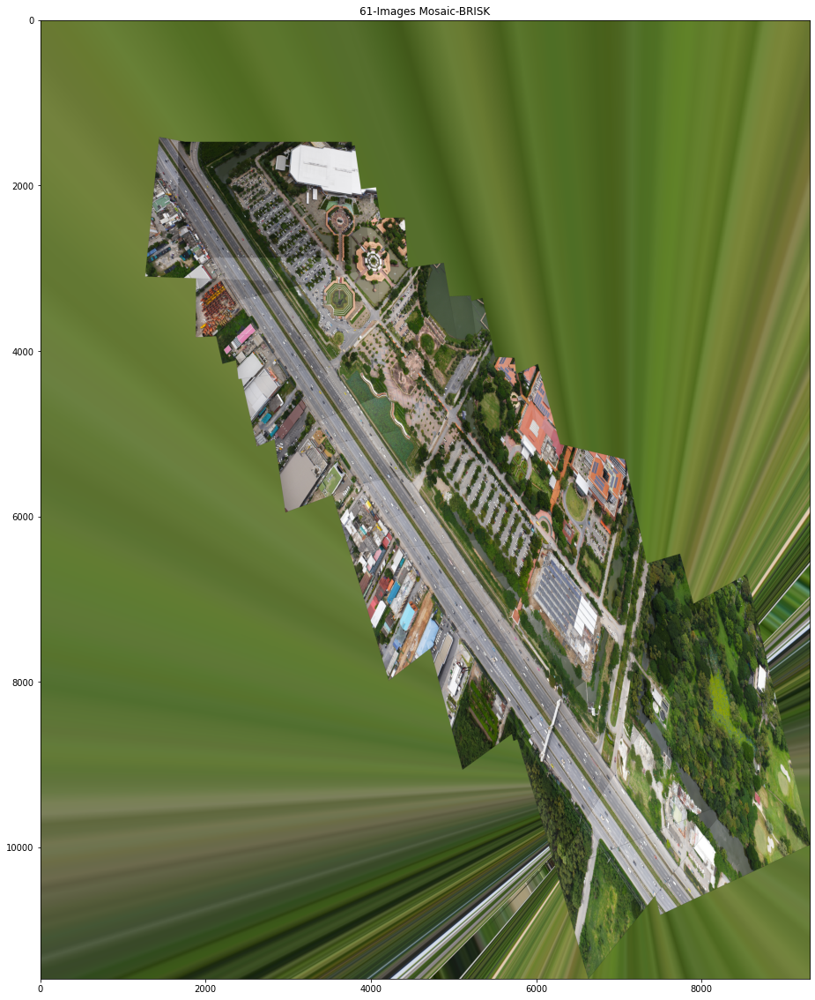

In [ ]:
fig,ax =plt.subplots()
fig.set_size_inches(20,20)
ax.imshow(cv2.cvtColor(warp_imgs_all_brisk , cv2.COLOR_BGR2RGB))
ax.set_title('61-Images Mosaic-BRISK')

In [ ]:
mser = cv2.MSER_create()
sift = cv2.xfeatures2d.SIFT_create()

keypoints_all_left_mser = []
descriptors_all_left_mser = []
points_all_left_mser=[]

keypoints_all_right_mser = []
descriptors_all_right_mser = []
points_all_right_mser=[]

for imgs in tqdm(images_left_bgr_no_enhance):
  kpt = mser.detect(imgs,None)
  kpt,descrip =  sift.compute(imgs, kpt)
  keypoints_all_left_mser.append(kpt)
  descriptors_all_left_mser.append(descrip)
  points_all_left_mser.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

for imgs in tqdm(images_right_bgr_no_enhance):
  kpt = mser.detect(imgs,None)
  kpt,descrip =  sift.compute(imgs, kpt)
  keypoints_all_right_mser.append(kpt)
  descriptors_all_right_mser.append(descrip)
  points_all_right_mser.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

100%|██████████| 61/61 [06:09<00:00,  6.05s/it]


In [ ]:
#num_kps_sift = []
#num_kps_brisk = []
#num_kps_agast = []
#num_kps_kaze = []
#num_kps_akaze = []
#num_kps_orb = []
num_kps_mser = []
#num_kps_daisy = []
#num_kps_surfsift = []
#num_kps_fast = []
#num_kps_freak = []
#num_kps_gftt = []
#num_kps_star = []

#for j in tqdm(keypoints_all_left_sift + keypoints_all_right_sift):
#  num_kps_sift.append(len(j))

#for j in tqdm(keypoints_all_left_brisk + keypoints_all_right_brisk):
  #num_kps_brisk.append(len(j))

#for j in tqdm(keypoints_all_left_agast + keypoints_all_right_agast):
  #num_kps_agast.append(len(j))

#for j in tqdm(keypoints_all_left_kaze + keypoints_all_right_kaze):
#  num_kps_kaze.append(len(j))

#for j in tqdm(keypoints_all_left_akaze + keypoints_all_right_akaze):
  #num_kps_akaze.append(len(j))

#for j in tqdm(keypoints_all_left_orb + keypoints_all_right_orb):
  #num_kps_orb.append(len(j))

for j in tqdm(keypoints_all_left_mser + keypoints_all_right_mser):
  num_kps_mser.append(len(j))

#for j in tqdm(keypoints_all_left_daisy + keypoints_all_right_daisy):
#  num_kps_daisy.append(len(j))

#for j in tqdm(keypoints_all_left_surfsift + keypoints_all_right_surfsift):
#  num_kps_surfsift.append(len(j))

#for j in tqdm(keypoints_all_left_fast + keypoints_all_right_fast):
  #num_kps_fast.append(len(j))

#for j in tqdm(keypoints_all_left_freak + keypoints_all_right_freak):
  #num_kps_freak.append(len(j))

#for j in tqdm(keypoints_all_left_gftt + keypoints_all_right_gftt):
  #num_kps_gftt.append(len(j))

#for j in tqdm(keypoints_all_left_star + keypoints_all_right_star):
  #num_kps_star.append(len(j))

100%|██████████| 122/122 [00:00<00:00, 176267.68it/s]


In [ ]:
def compute_homography_fast(matched_pts1, matched_pts2,thresh=4):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    cv2.RANSAC, ransacReprojThreshold =thresh)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def compute_homography_fast_other(matched_pts1, matched_pts2):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    0)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def get_Hmatrix(imgs,keypts,pts,descripts,ratio=0.8,thresh=4,disp=False):
  FLANN_INDEX_KDTREE = 2
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  #flann = cv2.BFMatcher()

  lff1 = np.float32(descripts[0])
  lff = np.float32(descripts[1])


  matches_lf1_lf = flann.knnMatch(lff1, lff, k=2)

  print("\nNumber of matches",len(matches_lf1_lf))

  matches_4 = []
  ratio = ratio
  # loop over the raw matches
  for m in matches_lf1_lf:
    # ensure the distance is within a certain ratio of each
    # other (i.e. Lowe’s ratio test)
    if len(m) == 2 and m[0].distance < m[1].distance * ratio:
        #matches_1.append((m[0].trainIdx, m[0].queryIdx))
        matches_4.append(m[0])

  print("Number of matches After Lowe's Ratio",len(matches_4))
  
  matches_idx = np.array([m.queryIdx for m in matches_4])
  imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
  matches_idx = np.array([m.trainIdx for m in matches_4])
  imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
  '''
  # Estimate homography 1
  #Compute H1
  # Estimate homography 1
  #Compute H1
  imm1_pts=np.empty((len(matches_4),2))
  imm2_pts=np.empty((len(matches_4),2))
  for i in range(0,len(matches_4)):
    m = matches_4[i]
    (a_x, a_y) = keypts[0][m.queryIdx].pt
    (b_x, b_y) = keypts[1][m.trainIdx].pt
    imm1_pts[i]=(a_x, a_y)
    imm2_pts[i]=(b_x, b_y)    
  H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  Hn, best_inliers=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1000, RANSACthresh=6)
  '''
  
  
  Hn,inliers = compute_homography_fast(imm1_pts,imm2_pts,thresh)  
  inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
  print("Number of Robust matches",len(inlier_matchset))
  print("\n")
  '''
  if len(inlier_matchset)<50:
    matches_4 = []
    ratio = 0.67
    # loop over the raw matches
    for m in matches_lf1_lf:
      # ensure the distance is within a certain ratio of each
      # other (i.e. Lowe’s ratio test)
      if len(m) == 2 and m[0].distance < m[1].distance * ratio:
          #matches_1.append((m[0].trainIdx, m[0].queryIdx))
          matches_4.append(m[0])
    print("Number of matches After Lowe's Ratio New",len(matches_4))
  
    matches_idx = np.array([m.queryIdx for m in matches_4])
    imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
    matches_idx = np.array([m.trainIdx for m in matches_4])
    imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
    Hn,inliers = compute_homography_fast_other(imm1_pts,imm2_pts)  
    inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
    print("Number of Robust matches New",len(inlier_matchset))
    print("\n")    
    '''
  #H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  #Hn=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1500, RANSACthresh=6)

  #global inlier_matchset   
  
  if disp==True:
    dispimg1=cv2.drawMatches(imgs[0], keypts[0], imgs[1], keypts[1], inlier_matchset, None,flags=2)
    displayplot(dispimg1,'Robust Matching between Reference Image and Right Image ')
  
  return Hn/Hn[2,2], len(matches_lf1_lf), len(inlier_matchset)

In [ ]:
from functools import partial
from tqdm import tqdm
tqdm = partial(tqdm, position=0, leave=True)

In [ ]:
print(left_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0062.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0061.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0060.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0059.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0058.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0057.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0056.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0055.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0053.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0052.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0051.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0050.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
print(right_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0065.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0066.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0067.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0068.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0069.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0070.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0071.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0072.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0073.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0074.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0075.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0076.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0077.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
H_left_mser = []
H_right_mser = []

num_matches_mser = []
num_good_matches_mser = []

for j in tqdm(range(len(images_left))):
  if j==len(images_left)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_left_bgr[j:j+2][::-1],keypoints_all_left_mser[j:j+2][::-1],points_all_left_mser[j:j+2][::-1],descriptors_all_left_mser[j:j+2][::-1],0.9)
  H_left_mser.append(H_a)
  #num_matches_sift.append(matches)
  #num_good_matches_sift.append(gd_matches)

for j in tqdm(range(len(images_right))):
  if j==len(images_right)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_right_bgr[j:j+2][::-1],keypoints_all_right_mser[j:j+2][::-1],points_all_right_mser[j:j+2][::-1],descriptors_all_right_mser[j:j+2][::-1],0.9)
  H_right_mser.append(H_a)
  #num_matches.append(matches)
  #num_good_matches.append(gd_matches)

  2%|▏         | 1/61 [00:00<00:16,  3.58it/s]


Number of matches 2578
Number of matches After Lowe's Ratio 791
Number of Robust matches 240




  3%|▎         | 2/61 [00:00<00:18,  3.21it/s]


Number of matches 2515
Number of matches After Lowe's Ratio 735
Number of Robust matches 152




  5%|▍         | 3/61 [00:01<00:18,  3.06it/s]


Number of matches 2573
Number of matches After Lowe's Ratio 489
Number of Robust matches 106




  7%|▋         | 4/61 [00:01<00:19,  2.93it/s]


Number of matches 2649
Number of matches After Lowe's Ratio 563
Number of Robust matches 73




  8%|▊         | 5/61 [00:01<00:20,  2.78it/s]


Number of matches 3077
Number of matches After Lowe's Ratio 432
Number of Robust matches 58




 10%|▉         | 6/61 [00:02<00:21,  2.59it/s]


Number of matches 2731
Number of matches After Lowe's Ratio 199
Number of Robust matches 31




 11%|█▏        | 7/61 [00:02<00:21,  2.50it/s]


Number of matches 2847
Number of matches After Lowe's Ratio 1011
Number of Robust matches 219




 13%|█▎        | 8/61 [00:03<00:21,  2.49it/s]


Number of matches 2761
Number of matches After Lowe's Ratio 359
Number of Robust matches 80




 15%|█▍        | 9/61 [00:03<00:21,  2.45it/s]


Number of matches 2570
Number of matches After Lowe's Ratio 679
Number of Robust matches 143




 16%|█▋        | 10/61 [00:03<00:20,  2.50it/s]


Number of matches 2642
Number of matches After Lowe's Ratio 396
Number of Robust matches 74




 18%|█▊        | 11/61 [00:04<00:19,  2.54it/s]


Number of matches 2122
Number of matches After Lowe's Ratio 518
Number of Robust matches 131




 20%|█▉        | 12/61 [00:04<00:18,  2.68it/s]


Number of matches 2614
Number of matches After Lowe's Ratio 529
Number of Robust matches 138




 21%|██▏       | 13/61 [00:04<00:17,  2.78it/s]


Number of matches 1521
Number of matches After Lowe's Ratio 252
Number of Robust matches 71




 23%|██▎       | 14/61 [00:05<00:14,  3.17it/s]


Number of matches 1844
Number of matches After Lowe's Ratio 596
Number of Robust matches 231




 25%|██▍       | 15/61 [00:05<00:13,  3.42it/s]


Number of matches 1636
Number of matches After Lowe's Ratio 245
Number of Robust matches 72




 26%|██▌       | 16/61 [00:05<00:12,  3.66it/s]


Number of matches 1977
Number of matches After Lowe's Ratio 438
Number of Robust matches 144




 28%|██▊       | 17/61 [00:05<00:11,  3.69it/s]


Number of matches 2022
Number of matches After Lowe's Ratio 602
Number of Robust matches 244




 30%|██▉       | 18/61 [00:06<00:11,  3.78it/s]


Number of matches 1919
Number of matches After Lowe's Ratio 545
Number of Robust matches 211




 31%|███       | 19/61 [00:06<00:11,  3.79it/s]


Number of matches 2101
Number of matches After Lowe's Ratio 632
Number of Robust matches 278




 33%|███▎      | 20/61 [00:06<00:11,  3.70it/s]


Number of matches 2304
Number of matches After Lowe's Ratio 758
Number of Robust matches 320




 34%|███▍      | 21/61 [00:06<00:11,  3.54it/s]


Number of matches 2185
Number of matches After Lowe's Ratio 911
Number of Robust matches 294




 36%|███▌      | 22/61 [00:07<00:11,  3.52it/s]


Number of matches 2208
Number of matches After Lowe's Ratio 970
Number of Robust matches 378




 38%|███▊      | 23/61 [00:07<00:10,  3.46it/s]


Number of matches 2367
Number of matches After Lowe's Ratio 843
Number of Robust matches 313




 39%|███▉      | 24/61 [00:07<00:11,  3.31it/s]


Number of matches 2393
Number of matches After Lowe's Ratio 551
Number of Robust matches 186




 41%|████      | 25/61 [00:08<00:11,  3.21it/s]


Number of matches 2359
Number of matches After Lowe's Ratio 855
Number of Robust matches 259




 43%|████▎     | 26/61 [00:08<00:11,  3.14it/s]


Number of matches 2461
Number of matches After Lowe's Ratio 663
Number of Robust matches 204




 44%|████▍     | 27/61 [00:08<00:10,  3.14it/s]


Number of matches 2249
Number of matches After Lowe's Ratio 780
Number of Robust matches 210




 46%|████▌     | 28/61 [00:09<00:10,  3.06it/s]


Number of matches 2372
Number of matches After Lowe's Ratio 131
Number of Robust matches 15




 48%|████▊     | 29/61 [00:09<00:10,  3.02it/s]


Number of matches 2069
Number of matches After Lowe's Ratio 229
Number of Robust matches 53




 49%|████▉     | 30/61 [00:09<00:09,  3.10it/s]


Number of matches 2359
Number of matches After Lowe's Ratio 809
Number of Robust matches 199




 51%|█████     | 31/61 [00:10<00:10,  2.97it/s]


Number of matches 2766
Number of matches After Lowe's Ratio 292
Number of Robust matches 50




 52%|█████▏    | 32/61 [00:10<00:10,  2.83it/s]


Number of matches 3058
Number of matches After Lowe's Ratio 270
Number of Robust matches 24




 54%|█████▍    | 33/61 [00:11<00:10,  2.62it/s]


Number of matches 3085
Number of matches After Lowe's Ratio 850
Number of Robust matches 214




 56%|█████▌    | 34/61 [00:11<00:10,  2.52it/s]


Number of matches 3255
Number of matches After Lowe's Ratio 546
Number of Robust matches 134




 57%|█████▋    | 35/61 [00:11<00:10,  2.39it/s]


Number of matches 2861
Number of matches After Lowe's Ratio 137
Number of Robust matches 12




 59%|█████▉    | 36/61 [00:12<00:10,  2.37it/s]


Number of matches 2662
Number of matches After Lowe's Ratio 768
Number of Robust matches 182




 61%|██████    | 37/61 [00:12<00:09,  2.43it/s]


Number of matches 2577
Number of matches After Lowe's Ratio 915
Number of Robust matches 222




 62%|██████▏   | 38/61 [00:13<00:09,  2.50it/s]


Number of matches 2927
Number of matches After Lowe's Ratio 833
Number of Robust matches 205




 64%|██████▍   | 39/61 [00:13<00:09,  2.40it/s]


Number of matches 3331
Number of matches After Lowe's Ratio 1017
Number of Robust matches 231




 66%|██████▌   | 40/61 [00:14<00:09,  2.28it/s]


Number of matches 3499
Number of matches After Lowe's Ratio 935
Number of Robust matches 179




 67%|██████▋   | 41/61 [00:14<00:09,  2.12it/s]


Number of matches 3895
Number of matches After Lowe's Ratio 1283
Number of Robust matches 325




 69%|██████▉   | 42/61 [00:15<00:09,  1.99it/s]


Number of matches 3345
Number of matches After Lowe's Ratio 1064
Number of Robust matches 287




 70%|███████   | 43/61 [00:15<00:08,  2.02it/s]


Number of matches 2826
Number of matches After Lowe's Ratio 1072
Number of Robust matches 301




 72%|███████▏  | 44/61 [00:16<00:07,  2.14it/s]


Number of matches 2607
Number of matches After Lowe's Ratio 986
Number of Robust matches 340




 74%|███████▍  | 45/61 [00:16<00:06,  2.29it/s]


Number of matches 2230
Number of matches After Lowe's Ratio 842
Number of Robust matches 277




 75%|███████▌  | 46/61 [00:16<00:05,  2.52it/s]


Number of matches 2359
Number of matches After Lowe's Ratio 929
Number of Robust matches 327




 77%|███████▋  | 47/61 [00:17<00:05,  2.67it/s]


Number of matches 2556
Number of matches After Lowe's Ratio 928
Number of Robust matches 325




 79%|███████▊  | 48/61 [00:17<00:04,  2.73it/s]


Number of matches 2370
Number of matches After Lowe's Ratio 934
Number of Robust matches 276




 80%|████████  | 49/61 [00:17<00:04,  2.84it/s]


Number of matches 2175
Number of matches After Lowe's Ratio 931
Number of Robust matches 282




 82%|████████▏ | 50/61 [00:18<00:03,  2.96it/s]


Number of matches 1943
Number of matches After Lowe's Ratio 766
Number of Robust matches 260




 84%|████████▎ | 51/61 [00:18<00:03,  3.19it/s]


Number of matches 1749
Number of matches After Lowe's Ratio 468
Number of Robust matches 155




 85%|████████▌ | 52/61 [00:18<00:02,  3.46it/s]


Number of matches 1809
Number of matches After Lowe's Ratio 814
Number of Robust matches 306




 87%|████████▋ | 53/61 [00:18<00:02,  3.62it/s]


Number of matches 1908
Number of matches After Lowe's Ratio 766
Number of Robust matches 242




 89%|████████▊ | 54/61 [00:19<00:01,  3.64it/s]


Number of matches 1778
Number of matches After Lowe's Ratio 633
Number of Robust matches 190




 90%|█████████ | 55/61 [00:19<00:01,  3.71it/s]


Number of matches 2041
Number of matches After Lowe's Ratio 695
Number of Robust matches 275




 92%|█████████▏| 56/61 [00:19<00:01,  3.67it/s]


Number of matches 2214
Number of matches After Lowe's Ratio 946
Number of Robust matches 403




 93%|█████████▎| 57/61 [00:19<00:01,  3.52it/s]


Number of matches 2180
Number of matches After Lowe's Ratio 637
Number of Robust matches 201




 95%|█████████▌| 58/61 [00:20<00:00,  3.49it/s]


Number of matches 2265
Number of matches After Lowe's Ratio 579
Number of Robust matches 186




 97%|█████████▋| 59/61 [00:20<00:00,  3.34it/s]


Number of matches 2489
Number of matches After Lowe's Ratio 737
Number of Robust matches 159




  0%|          | 0/61 [00:00<?, ?it/s]


Number of matches 2358
Number of matches After Lowe's Ratio 158
Number of Robust matches 11




  2%|▏         | 1/61 [00:00<00:19,  3.00it/s]


Number of matches 1782
Number of matches After Lowe's Ratio 671
Number of Robust matches 210




  3%|▎         | 2/61 [00:00<00:17,  3.28it/s]


Number of matches 1452
Number of matches After Lowe's Ratio 337
Number of Robust matches 123




  5%|▍         | 3/61 [00:00<00:16,  3.60it/s]


Number of matches 2306
Number of matches After Lowe's Ratio 311
Number of Robust matches 92




  7%|▋         | 4/61 [00:01<00:16,  3.53it/s]


Number of matches 1911
Number of matches After Lowe's Ratio 714
Number of Robust matches 284




  8%|▊         | 5/61 [00:01<00:15,  3.64it/s]


Number of matches 2142
Number of matches After Lowe's Ratio 463
Number of Robust matches 171




 10%|▉         | 6/61 [00:01<00:15,  3.53it/s]


Number of matches 2191
Number of matches After Lowe's Ratio 961
Number of Robust matches 428




 11%|█▏        | 7/61 [00:01<00:15,  3.49it/s]


Number of matches 2029
Number of matches After Lowe's Ratio 868
Number of Robust matches 326




 13%|█▎        | 8/61 [00:02<00:15,  3.45it/s]


Number of matches 2512
Number of matches After Lowe's Ratio 931
Number of Robust matches 375




 15%|█▍        | 9/61 [00:02<00:15,  3.30it/s]


Number of matches 2412
Number of matches After Lowe's Ratio 956
Number of Robust matches 428




 16%|█▋        | 10/61 [00:02<00:15,  3.20it/s]


Number of matches 2826
Number of matches After Lowe's Ratio 683
Number of Robust matches 224




 18%|█▊        | 11/61 [00:03<00:16,  3.00it/s]


Number of matches 2981
Number of matches After Lowe's Ratio 998
Number of Robust matches 371




 20%|█▉        | 12/61 [00:03<00:17,  2.82it/s]


Number of matches 3041
Number of matches After Lowe's Ratio 1012
Number of Robust matches 300




 21%|██▏       | 13/61 [00:04<00:18,  2.65it/s]


Number of matches 3227
Number of matches After Lowe's Ratio 1187
Number of Robust matches 349




 23%|██▎       | 14/61 [00:04<00:18,  2.55it/s]


Number of matches 3127
Number of matches After Lowe's Ratio 1029
Number of Robust matches 298




 25%|██▍       | 15/61 [00:04<00:18,  2.44it/s]


Number of matches 3082
Number of matches After Lowe's Ratio 1250
Number of Robust matches 340




 26%|██▌       | 16/61 [00:05<00:18,  2.41it/s]


Number of matches 2828
Number of matches After Lowe's Ratio 1009
Number of Robust matches 251




 28%|██▊       | 17/61 [00:05<00:18,  2.44it/s]


Number of matches 2804
Number of matches After Lowe's Ratio 1164
Number of Robust matches 286




 30%|██▉       | 18/61 [00:06<00:17,  2.43it/s]


Number of matches 3047
Number of matches After Lowe's Ratio 1136
Number of Robust matches 248




 31%|███       | 19/61 [00:06<00:17,  2.37it/s]


Number of matches 3292
Number of matches After Lowe's Ratio 843
Number of Robust matches 193




 33%|███▎      | 20/61 [00:07<00:17,  2.36it/s]


Number of matches 2865
Number of matches After Lowe's Ratio 738
Number of Robust matches 201




 34%|███▍      | 21/61 [00:07<00:16,  2.40it/s]


Number of matches 3522
Number of matches After Lowe's Ratio 429
Number of Robust matches 50




 36%|███▌      | 22/61 [00:08<00:17,  2.21it/s]


Number of matches 3409
Number of matches After Lowe's Ratio 963
Number of Robust matches 210




 38%|███▊      | 23/61 [00:08<00:18,  2.11it/s]


Number of matches 3648
Number of matches After Lowe's Ratio 130
Number of Robust matches 11




 39%|███▉      | 24/61 [00:09<00:18,  2.04it/s]


Number of matches 3290
Number of matches After Lowe's Ratio 737
Number of Robust matches 154




 41%|████      | 25/61 [00:09<00:17,  2.06it/s]


Number of matches 3162
Number of matches After Lowe's Ratio 912
Number of Robust matches 204




 43%|████▎     | 26/61 [00:09<00:16,  2.17it/s]


Number of matches 2667
Number of matches After Lowe's Ratio 984
Number of Robust matches 271




 44%|████▍     | 27/61 [00:10<00:15,  2.26it/s]


Number of matches 3045
Number of matches After Lowe's Ratio 708
Number of Robust matches 165




 46%|████▌     | 28/61 [00:10<00:14,  2.27it/s]


Number of matches 2955
Number of matches After Lowe's Ratio 707
Number of Robust matches 145




 48%|████▊     | 29/61 [00:11<00:13,  2.34it/s]


Number of matches 2928
Number of matches After Lowe's Ratio 838
Number of Robust matches 223




 49%|████▉     | 30/61 [00:11<00:13,  2.37it/s]


Number of matches 2889
Number of matches After Lowe's Ratio 1236
Number of Robust matches 309




 51%|█████     | 31/61 [00:12<00:12,  2.40it/s]


Number of matches 2877
Number of matches After Lowe's Ratio 915
Number of Robust matches 232




 52%|█████▏    | 32/61 [00:12<00:11,  2.42it/s]


Number of matches 2724
Number of matches After Lowe's Ratio 324
Number of Robust matches 77




 54%|█████▍    | 33/61 [00:12<00:11,  2.50it/s]


Number of matches 2688
Number of matches After Lowe's Ratio 865
Number of Robust matches 250




 56%|█████▌    | 34/61 [00:13<00:10,  2.53it/s]


Number of matches 2695
Number of matches After Lowe's Ratio 627
Number of Robust matches 150




 57%|█████▋    | 35/61 [00:13<00:09,  2.64it/s]


Number of matches 2283
Number of matches After Lowe's Ratio 386
Number of Robust matches 107




 59%|█████▉    | 36/61 [00:13<00:08,  2.80it/s]


Number of matches 2330
Number of matches After Lowe's Ratio 641
Number of Robust matches 222




 61%|██████    | 37/61 [00:14<00:08,  2.93it/s]


Number of matches 2095
Number of matches After Lowe's Ratio 623
Number of Robust matches 214




 62%|██████▏   | 38/61 [00:14<00:07,  3.09it/s]


Number of matches 2164
Number of matches After Lowe's Ratio 992
Number of Robust matches 341




 64%|██████▍   | 39/61 [00:14<00:06,  3.21it/s]


Number of matches 2280
Number of matches After Lowe's Ratio 593
Number of Robust matches 223




 66%|██████▌   | 40/61 [00:15<00:06,  3.16it/s]


Number of matches 2267
Number of matches After Lowe's Ratio 1082
Number of Robust matches 353




 67%|██████▋   | 41/61 [00:15<00:06,  3.23it/s]


Number of matches 1729
Number of matches After Lowe's Ratio 486
Number of Robust matches 143




 69%|██████▉   | 42/61 [00:15<00:05,  3.42it/s]


Number of matches 1584
Number of matches After Lowe's Ratio 637
Number of Robust matches 177




 70%|███████   | 43/61 [00:15<00:05,  3.58it/s]


Number of matches 1530
Number of matches After Lowe's Ratio 405
Number of Robust matches 77




 72%|███████▏  | 44/61 [00:16<00:04,  3.81it/s]


Number of matches 1591
Number of matches After Lowe's Ratio 725
Number of Robust matches 218




 74%|███████▍  | 45/61 [00:16<00:04,  3.83it/s]


Number of matches 1992
Number of matches After Lowe's Ratio 579
Number of Robust matches 117




 75%|███████▌  | 46/61 [00:16<00:04,  3.60it/s]


Number of matches 2134
Number of matches After Lowe's Ratio 780
Number of Robust matches 213




 77%|███████▋  | 47/61 [00:16<00:04,  3.43it/s]


Number of matches 2368
Number of matches After Lowe's Ratio 802
Number of Robust matches 206




 79%|███████▊  | 48/61 [00:17<00:04,  3.00it/s]


Number of matches 2046
Number of matches After Lowe's Ratio 682
Number of Robust matches 183




 80%|████████  | 49/61 [00:17<00:03,  3.13it/s]


Number of matches 2397
Number of matches After Lowe's Ratio 866
Number of Robust matches 251




 82%|████████▏ | 50/61 [00:17<00:03,  3.08it/s]


Number of matches 2837
Number of matches After Lowe's Ratio 731
Number of Robust matches 236




 84%|████████▎ | 51/61 [00:18<00:03,  2.87it/s]


Number of matches 2292
Number of matches After Lowe's Ratio 108
Number of Robust matches 14




 85%|████████▌ | 52/61 [00:18<00:03,  2.95it/s]


Number of matches 2116
Number of matches After Lowe's Ratio 504
Number of Robust matches 138




 87%|████████▋ | 53/61 [00:19<00:02,  3.07it/s]


Number of matches 2317
Number of matches After Lowe's Ratio 626
Number of Robust matches 198




 89%|████████▊ | 54/61 [00:19<00:02,  2.97it/s]


Number of matches 2369
Number of matches After Lowe's Ratio 726
Number of Robust matches 173




 90%|█████████ | 55/61 [00:19<00:01,  3.02it/s]


Number of matches 2165
Number of matches After Lowe's Ratio 748
Number of Robust matches 223




 92%|█████████▏| 56/61 [00:19<00:01,  3.18it/s]


Number of matches 1852
Number of matches After Lowe's Ratio 617
Number of Robust matches 250




 93%|█████████▎| 57/61 [00:20<00:01,  3.34it/s]


Number of matches 1864
Number of matches After Lowe's Ratio 660
Number of Robust matches 202




 95%|█████████▌| 58/61 [00:20<00:00,  3.32it/s]


Number of matches 2013
Number of matches After Lowe's Ratio 844
Number of Robust matches 217




 97%|█████████▋| 59/61 [00:20<00:00,  3.39it/s]


Number of matches 2176
Number of matches After Lowe's Ratio 871
Number of Robust matches 240




 98%|█████████▊| 60/61 [00:21<00:00,  3.32it/s]


Number of matches 2640
Number of matches After Lowe's Ratio 852
Number of Robust matches 250




In [ ]:
def warpnImages(images_left, images_right,H_left,H_right):
    #img1-centre,img2-left,img3-right

    h, w = images_left[0].shape[:2]

    pts_left = []
    pts_right = []

    pts_centre = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)

    for j in range(len(H_left)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_left.append(pts)

    for j in range(len(H_right)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_right.append(pts)

    pts_left_transformed=[]
    pts_right_transformed=[]



    for j,pts in enumerate(pts_left):
      if j==0:
        H_trans = H_left[j]
      else:
        H_trans = H_trans@H_left[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_left_transformed.append(pts_)

    for j,pts in enumerate(pts_right):
      if j==0:
        H_trans = H_right[j]
      else:
        H_trans = H_trans@H_right[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_right_transformed.append(pts_)


    print('Step1:Done')


    #pts = np.concatenate((pts1, pts2_), axis=0)

    pts_concat = np.concatenate((pts_centre,np.concatenate(np.array(pts_left_transformed),axis=0),np.concatenate(np.array(pts_right_transformed),axis=0)), axis=0)

    [xmin, ymin] = np.int32(pts_concat.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts_concat.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    print('Step2:Done')


    return xmax,xmin,ymax,ymin,t,h,w,Ht

In [ ]:
def final_steps_left(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_left = []


    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_left[j+1], H_trans, (xmax-xmin, ymax-ymin))

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
      
      warp_imgs_left.append(result)

    print('Step31:Done')

    return warp_imgs_left

def final_steps_right(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_right = []

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_right[j+1], H_trans, (xmax-xmin, ymax-ymin))
      
      warp_imgs_right.append(result)

    print('Step32:Done')

    return warp_imgs_right

def final_steps_union(warp_imgs_left,warp_imgs_right):
    #Union

    warp_images_all = warp_imgs_left + warp_imgs_right

    warp_img_init = warp_images_all[0]



    #warp_final_all=[]

    for j,warp_img in enumerate(warp_images_all):
      if j==len(warp_images_all)-1:
        break
      black_pixels = np.where((warp_img_init[:, :, 0] == 0) & (warp_img_init[:, :, 1] == 0) & (warp_img_init[:, :, 2] == 0))

      warp_img_init[black_pixels] = warp_images_all[j+1][black_pixels]
    
      #warp_final = np.maximum(warp_img_init,warp_images_all[j+1])
      #warp_img_init = warp_final
      #warp_final_all.append(warp_final)

    print('Step4:Done')


    return warp_img_init

In [ ]:
def final_steps_left_union(images_left,H_left,xmax,xmin,ymax,ymin,t,h,w,Ht):



    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_left[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
        warp_img_init_prev = result
        continue

      black_pixels = np.where((warp_img_init_prev[:, :, 0] == 0) & (warp_img_init_prev[:, :, 1] == 0) & (warp_img_init_prev[:, :, 2] == 0))

      warp_img_init_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step31:Done')

    return warp_img_init_prev

def final_steps_right_union(warp_img_prev,images_right,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_right[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      black_pixels = np.where((warp_img_prev[:, :, 0] == 0) & (warp_img_prev[:, :, 1] == 0) & (warp_img_prev[:, :, 2] == 0))

      warp_img_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step32:Done')

    return warp_img_prev

In [ ]:
xmax,xmin,ymax,ymin,t,h,w,Ht = warpnImages(images_left_bgr_no_enhance, images_right_bgr_no_enhance,H_left_mser,H_right_mser)

Step1:Done
Step2:Done


In [ ]:
warp_imgs_left = final_steps_left_union(images_left_bgr_no_enhance,H_left_mser,xmax,xmin,ymax,ymin,t,h,w,Ht)

Step31:Done


In [ ]:
warp_imgs_all_mser = final_steps_right_union(warp_imgs_left,images_right_bgr_no_enhance,H_right_mser,xmax,xmin,ymax,ymin,t,h,w,Ht)

Step32:Done


Text(0.5, 1.0, '120-Images Mosaic-MSER')

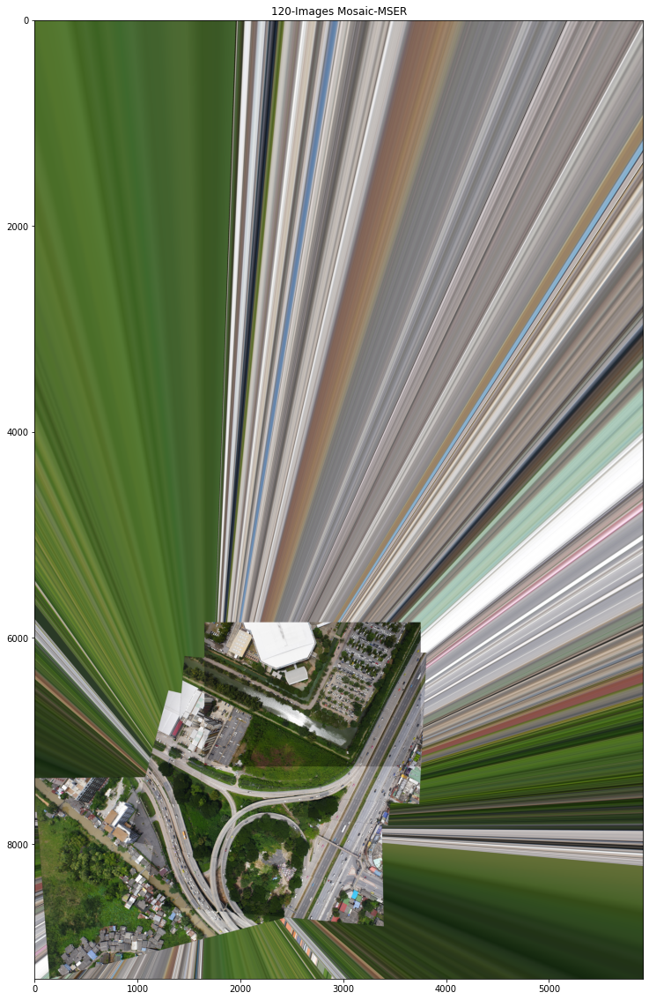

In [ ]:
fig,ax =plt.subplots()
fig.set_size_inches(20,20)
ax.imshow(cv2.cvtColor(warp_imgs_all_mser , cv2.COLOR_BGR2RGB))
ax.set_title('120-Images Mosaic-MSER')

In [ ]:
agast = cv2.AgastFeatureDetector_create()
sift = cv2.xfeatures2d.SIFT_create()

keypoints_all_left_agast = []
descriptors_all_left_agast = []
points_all_left_agast=[]

keypoints_all_right_agast = []
descriptors_all_right_agast = []
points_all_right_agast=[]

for imgs in tqdm(images_left_bgr_no_enhance):
  kpt = agast.detect(imgs,None)
  kpt,descrip =  sift.compute(imgs, kpt)
  keypoints_all_left_agast.append(kpt)
  descriptors_all_left_agast.append(descrip)
  points_all_left_agast.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

for imgs in tqdm(images_right_bgr_no_enhance):
  kpt = agast.detect(imgs,None)
  kpt,descrip =  sift.compute(imgs, kpt)
  keypoints_all_right_agast.append(kpt)
  descriptors_all_right_agast.append(descrip)
  points_all_right_agast.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

100%|██████████| 61/61 [08:32<00:00,  8.41s/it]


In [ ]:
#num_kps_sift = []
#num_kps_brisk = []
num_kps_agast = []
#num_kps_kaze = []
#num_kps_akaze = []
#num_kps_orb = []
#num_kps_mser = []
#num_kps_daisy = []
#num_kps_surfsift = []
#num_kps_fast = []
#num_kps_freak = []
#num_kps_gftt = []
#num_kps_star = []

#for j in tqdm(keypoints_all_left_sift + keypoints_all_right_sift):
#  num_kps_sift.append(len(j))

#for j in tqdm(keypoints_all_left_brisk + keypoints_all_right_brisk):
  #num_kps_brisk.append(len(j))

for j in tqdm(keypoints_all_left_agast + keypoints_all_right_agast):
  num_kps_agast.append(len(j))

#for j in tqdm(keypoints_all_left_kaze + keypoints_all_right_kaze):
#  num_kps_kaze.append(len(j))

#for j in tqdm(keypoints_all_left_akaze + keypoints_all_right_akaze):
  #num_kps_akaze.append(len(j))

#for j in tqdm(keypoints_all_left_orb + keypoints_all_right_orb):
  #num_kps_orb.append(len(j))

#for j in tqdm(keypoints_all_left_mser + keypoints_all_right_mser):
#  num_kps_mser.append(len(j))

#for j in tqdm(keypoints_all_left_daisy + keypoints_all_right_daisy):
#  num_kps_daisy.append(len(j))

#for j in tqdm(keypoints_all_left_surfsift + keypoints_all_right_surfsift):
#  num_kps_surfsift.append(len(j))

#for j in tqdm(keypoints_all_left_fast + keypoints_all_right_fast):
#  num_kps_fast.append(len(j))

#for j in tqdm(keypoints_all_left_freak + keypoints_all_right_freak):
  #num_kps_freak.append(len(j))

#for j in tqdm(keypoints_all_left_gftt + keypoints_all_right_gftt):
#  num_kps_gftt.append(len(j))

#for j in tqdm(keypoints_all_left_star + keypoints_all_right_star):
  #num_kps_star.append(len(j))

100%|██████████| 122/122 [00:00<00:00, 82307.40it/s]


In [ ]:
def compute_homography_fast(matched_pts1, matched_pts2,thresh=4):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    cv2.RANSAC, ransacReprojThreshold =thresh)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def compute_homography_fast_other(matched_pts1, matched_pts2):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    0)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def get_Hmatrix(imgs,keypts,pts,descripts,ratio=0.8,thresh=4,disp=False):
  FLANN_INDEX_KDTREE = 2
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  #flann = cv2.BFMatcher()

  lff1 = np.float32(descripts[0])
  lff = np.float32(descripts[1])


  matches_lf1_lf = flann.knnMatch(lff1, lff, k=2)

  print("\nNumber of matches",len(matches_lf1_lf))

  matches_4 = []
  ratio = ratio
  # loop over the raw matches
  for m in matches_lf1_lf:
    # ensure the distance is within a certain ratio of each
    # other (i.e. Lowe’s ratio test)
    if len(m) == 2 and m[0].distance < m[1].distance * ratio:
        #matches_1.append((m[0].trainIdx, m[0].queryIdx))
        matches_4.append(m[0])

  print("Number of matches After Lowe's Ratio",len(matches_4))
  
  matches_idx = np.array([m.queryIdx for m in matches_4])
  imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
  matches_idx = np.array([m.trainIdx for m in matches_4])
  imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
  '''
  # Estimate homography 1
  #Compute H1
  # Estimate homography 1
  #Compute H1
  imm1_pts=np.empty((len(matches_4),2))
  imm2_pts=np.empty((len(matches_4),2))
  for i in range(0,len(matches_4)):
    m = matches_4[i]
    (a_x, a_y) = keypts[0][m.queryIdx].pt
    (b_x, b_y) = keypts[1][m.trainIdx].pt
    imm1_pts[i]=(a_x, a_y)
    imm2_pts[i]=(b_x, b_y)    
  H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  Hn, best_inliers=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1000, RANSACthresh=6)
  '''
  
  
  Hn,inliers = compute_homography_fast(imm1_pts,imm2_pts,thresh)  
  inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
  print("Number of Robust matches",len(inlier_matchset))
  print("\n")
  '''
  if len(inlier_matchset)<50:
    matches_4 = []
    ratio = 0.67
    # loop over the raw matches
    for m in matches_lf1_lf:
      # ensure the distance is within a certain ratio of each
      # other (i.e. Lowe’s ratio test)
      if len(m) == 2 and m[0].distance < m[1].distance * ratio:
          #matches_1.append((m[0].trainIdx, m[0].queryIdx))
          matches_4.append(m[0])
    print("Number of matches After Lowe's Ratio New",len(matches_4))
  
    matches_idx = np.array([m.queryIdx for m in matches_4])
    imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
    matches_idx = np.array([m.trainIdx for m in matches_4])
    imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
    Hn,inliers = compute_homography_fast_other(imm1_pts,imm2_pts)  
    inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
    print("Number of Robust matches New",len(inlier_matchset))
    print("\n")    
    '''
  #H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  #Hn=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1500, RANSACthresh=6)

  #global inlier_matchset   
  
  if disp==True:
    dispimg1=cv2.drawMatches(imgs[0], keypts[0], imgs[1], keypts[1], inlier_matchset, None,flags=2)
    displayplot(dispimg1,'Robust Matching between Reference Image and Right Image ')
  
  return Hn/Hn[2,2], len(matches_lf1_lf), len(inlier_matchset)

In [ ]:
from functools import partial
from tqdm import tqdm
tqdm = partial(tqdm, position=0, leave=True)

In [ ]:
print(left_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0062.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0061.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0060.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0059.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0058.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0057.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0056.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0055.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0053.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0052.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0051.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0050.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
print(right_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0065.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0066.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0067.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0068.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0069.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0070.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0071.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0072.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0073.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0074.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0075.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0076.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0077.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
H_left_agast = []
H_right_agast = []

num_matches_agast = []
num_good_matches_agast = []

for j in tqdm(range(len(images_left))):
  if j==len(images_left)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_left_bgr[j:j+2][::-1],keypoints_all_left_agast[j:j+2][::-1],points_all_left_agast[j:j+2][::-1],descriptors_all_left_agast[j:j+2][::-1],0.8)
  H_left_agast.append(H_a)
  #num_matches_sift.append(matches)
  #num_good_matches_sift.append(gd_matches)

for j in tqdm(range(len(images_right))):
  if j==len(images_right)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_right_bgr[j:j+2][::-1],keypoints_all_right_agast[j:j+2][::-1],points_all_right_agast[j:j+2][::-1],descriptors_all_right_agast[j:j+2][::-1],0.8)
  H_right_agast.append(H_a)
  #num_matches.append(matches)
  #num_good_matches.append(gd_matches)

  2%|▏         | 1/61 [00:32<32:47, 32.80s/it]


Number of matches 136160
Number of matches After Lowe's Ratio 20113
Number of Robust matches 13353




  3%|▎         | 2/61 [01:07<32:45, 33.32s/it]


Number of matches 120007
Number of matches After Lowe's Ratio 16054
Number of Robust matches 10551




  5%|▍         | 3/61 [01:37<31:09, 32.24s/it]


Number of matches 117876
Number of matches After Lowe's Ratio 6545
Number of Robust matches 3540




  7%|▋         | 4/61 [02:06<29:50, 31.42s/it]


Number of matches 123626
Number of matches After Lowe's Ratio 4772
Number of Robust matches 1776




  8%|▊         | 5/61 [02:38<29:24, 31.51s/it]


Number of matches 135893
Number of matches After Lowe's Ratio 1815
Number of Robust matches 683




 10%|▉         | 6/61 [03:10<29:06, 31.75s/it]


Number of matches 119233
Number of matches After Lowe's Ratio 132
Number of Robust matches 64



Number of matches 119944
Number of matches After Lowe's Ratio 14638


 11%|█▏        | 7/61 [03:40<28:12, 31.34s/it]

Number of Robust matches 7731




 13%|█▎        | 8/61 [04:11<27:29, 31.13s/it]


Number of matches 127483
Number of matches After Lowe's Ratio 1461
Number of Robust matches 618




 15%|█▍        | 9/61 [04:43<27:07, 31.30s/it]


Number of matches 120719
Number of matches After Lowe's Ratio 4930
Number of Robust matches 2477




 16%|█▋        | 10/61 [05:14<26:36, 31.30s/it]


Number of matches 127159
Number of matches After Lowe's Ratio 2256
Number of Robust matches 1160




 18%|█▊        | 11/61 [05:44<25:38, 30.77s/it]


Number of matches 100181
Number of matches After Lowe's Ratio 7032
Number of Robust matches 4355




 20%|█▉        | 12/61 [06:10<24:06, 29.52s/it]


Number of matches 113929
Number of matches After Lowe's Ratio 6302
Number of Robust matches 3623




 21%|██▏       | 13/61 [06:35<22:32, 28.18s/it]


Number of matches 72363
Number of matches After Lowe's Ratio 2512
Number of Robust matches 1660




 23%|██▎       | 14/61 [06:55<20:07, 25.70s/it]


Number of matches 98954
Number of matches After Lowe's Ratio 9380
Number of Robust matches 6326




 25%|██▍       | 15/61 [07:19<19:09, 25.00s/it]


Number of matches 79366
Number of matches After Lowe's Ratio 626
Number of Robust matches 292




 26%|██▌       | 16/61 [07:40<18:00, 24.01s/it]


Number of matches 110204
Number of matches After Lowe's Ratio 3268
Number of Robust matches 2335



Number of matches 105901
Number of matches After Lowe's Ratio 7066


 28%|██▊       | 17/61 [08:08<18:23, 25.08s/it]

Number of Robust matches 5495




 30%|██▉       | 18/61 [08:34<18:17, 25.53s/it]


Number of matches 107504
Number of matches After Lowe's Ratio 9800
Number of Robust matches 7031




 31%|███       | 19/61 [09:01<18:01, 25.74s/it]


Number of matches 103271
Number of matches After Lowe's Ratio 6637
Number of Robust matches 4666



Number of matches 116933
Number of matches After Lowe's Ratio 11669


 33%|███▎      | 20/61 [09:29<18:02, 26.39s/it]

Number of Robust matches 9323




 34%|███▍      | 21/61 [09:59<18:19, 27.49s/it]


Number of matches 119028
Number of matches After Lowe's Ratio 25406
Number of Robust matches 20114




 36%|███▌      | 22/61 [10:30<18:31, 28.51s/it]


Number of matches 124258
Number of matches After Lowe's Ratio 22311
Number of Robust matches 16071




 38%|███▊      | 23/61 [11:02<18:46, 29.64s/it]


Number of matches 131124
Number of matches After Lowe's Ratio 13151
Number of Robust matches 10020




 39%|███▉      | 24/61 [11:35<18:56, 30.72s/it]


Number of matches 134054
Number of matches After Lowe's Ratio 4644
Number of Robust matches 2687




 41%|████      | 25/61 [12:08<18:51, 31.43s/it]


Number of matches 127609
Number of matches After Lowe's Ratio 24227
Number of Robust matches 16984




 43%|████▎     | 26/61 [12:40<18:21, 31.47s/it]


Number of matches 124545
Number of matches After Lowe's Ratio 5011
Number of Robust matches 2891




 44%|████▍     | 27/61 [13:11<17:47, 31.40s/it]


Number of matches 130795
Number of matches After Lowe's Ratio 17913
Number of Robust matches 12370




 46%|████▌     | 28/61 [14:20<23:31, 42.76s/it]


Number of matches 141804
Number of matches After Lowe's Ratio 179
Number of Robust matches 64




 48%|████▊     | 29/61 [15:23<25:58, 48.72s/it]


Number of matches 128214
Number of matches After Lowe's Ratio 596
Number of Robust matches 141




 49%|████▉     | 30/61 [15:54<22:26, 43.45s/it]


Number of matches 130355
Number of matches After Lowe's Ratio 11540
Number of Robust matches 5515




 51%|█████     | 31/61 [16:25<19:48, 39.61s/it]


Number of matches 120660
Number of matches After Lowe's Ratio 479
Number of Robust matches 127




 52%|█████▏    | 32/61 [17:34<23:31, 48.66s/it]


Number of matches 137824
Number of matches After Lowe's Ratio 262
Number of Robust matches 81




 54%|█████▍    | 33/61 [18:42<25:19, 54.25s/it]


Number of matches 141614
Number of matches After Lowe's Ratio 6853
Number of Robust matches 3293




 56%|█████▌    | 34/61 [19:45<25:34, 56.84s/it]


Number of matches 131535
Number of matches After Lowe's Ratio 4225
Number of Robust matches 1929




 57%|█████▋    | 35/61 [20:16<21:21, 49.28s/it]


Number of matches 127536
Number of matches After Lowe's Ratio 42
Number of Robust matches 8



Number of matches 129839
Number of matches After Lowe's Ratio 20467


 59%|█████▉    | 36/61 [20:47<18:14, 43.78s/it]

Number of Robust matches 12653




 61%|██████    | 37/61 [21:18<15:59, 39.99s/it]


Number of matches 126651
Number of matches After Lowe's Ratio 18752
Number of Robust matches 10516




 62%|██████▏   | 38/61 [22:26<18:30, 48.26s/it]


Number of matches 135662
Number of matches After Lowe's Ratio 16911
Number of Robust matches 11826



Number of matches 139772
Number of matches After Lowe's Ratio 13794


 64%|██████▍   | 39/61 [23:33<19:44, 53.82s/it]

Number of Robust matches 7734




 66%|██████▌   | 40/61 [24:42<20:29, 58.53s/it]


Number of matches 152790
Number of matches After Lowe's Ratio 19037
Number of Robust matches 9481




 67%|██████▋   | 41/61 [25:49<20:21, 61.06s/it]


Number of matches 158880
Number of matches After Lowe's Ratio 21056
Number of Robust matches 8382




 69%|██████▉   | 42/61 [26:50<19:21, 61.15s/it]


Number of matches 152717
Number of matches After Lowe's Ratio 20048
Number of Robust matches 10430



Number of matches 132257
Number of matches After Lowe's Ratio 21212


 70%|███████   | 43/61 [27:49<18:04, 60.24s/it]

Number of Robust matches 11557




 72%|███████▏  | 44/61 [28:51<17:12, 60.76s/it]


Number of matches 126012
Number of matches After Lowe's Ratio 25455
Number of Robust matches 13265



Number of matches 118729
Number of matches After Lowe's Ratio 24985


 74%|███████▍  | 45/61 [29:51<16:09, 60.60s/it]

Number of Robust matches 17923




 75%|███████▌  | 46/61 [30:50<15:01, 60.09s/it]


Number of matches 112501
Number of matches After Lowe's Ratio 21209
Number of Robust matches 13141



Number of matches 120367
Number of matches After Lowe's Ratio 21407


 77%|███████▋  | 47/61 [31:53<14:13, 60.96s/it]

Number of Robust matches 16256




 79%|███████▊  | 48/61 [32:46<12:43, 58.71s/it]


Number of matches 128900
Number of matches After Lowe's Ratio 22757
Number of Robust matches 15722



Number of matches 118239
Number of matches After Lowe's Ratio 23718


 80%|████████  | 49/61 [33:36<11:12, 56.04s/it]

Number of Robust matches 15577




 82%|████████▏ | 50/61 [34:27<09:58, 54.44s/it]


Number of matches 117746
Number of matches After Lowe's Ratio 18132
Number of Robust matches 12607




 84%|████████▎ | 51/61 [35:11<08:34, 51.44s/it]


Number of matches 94610
Number of matches After Lowe's Ratio 9084
Number of Robust matches 5419



Number of matches 93123
Number of matches After Lowe's Ratio 22679


 85%|████████▌ | 52/61 [35:35<06:27, 43.03s/it]

Number of Robust matches 15788




 87%|████████▋ | 53/61 [35:57<04:56, 37.01s/it]


Number of matches 94525
Number of matches After Lowe's Ratio 16534
Number of Robust matches 12169




 89%|████████▊ | 54/61 [36:45<04:41, 40.19s/it]


Number of matches 97507
Number of matches After Lowe's Ratio 17423
Number of Robust matches 9965



Number of matches 93618
Number of matches After Lowe's Ratio 16494


 90%|█████████ | 55/61 [37:08<03:30, 35.03s/it]

Number of Robust matches 11453




 92%|█████████▏| 56/61 [37:31<02:36, 31.31s/it]


Number of matches 100100
Number of matches After Lowe's Ratio 24780
Number of Robust matches 15737




 93%|█████████▎| 57/61 [38:19<02:25, 36.28s/it]


Number of matches 102617
Number of matches After Lowe's Ratio 7601
Number of Robust matches 4953




 95%|█████████▌| 58/61 [38:43<01:38, 32.74s/it]


Number of matches 103996
Number of matches After Lowe's Ratio 5198
Number of Robust matches 3355




 97%|█████████▋| 59/61 [39:09<01:01, 30.79s/it]


Number of matches 112006
Number of matches After Lowe's Ratio 10998
Number of Robust matches 6351




  0%|          | 0/61 [00:00<?, ?it/s]


Number of matches 108059
Number of matches After Lowe's Ratio 406
Number of Robust matches 147




  2%|▏         | 1/61 [00:44<44:33, 44.56s/it]


Number of matches 106595
Number of matches After Lowe's Ratio 15861
Number of Robust matches 10901




  3%|▎         | 2/61 [01:06<37:13, 37.86s/it]


Number of matches 58345
Number of matches After Lowe's Ratio 5417
Number of Robust matches 3458




  5%|▍         | 3/61 [01:22<30:12, 31.25s/it]


Number of matches 81499
Number of matches After Lowe's Ratio 3406
Number of Robust matches 2087




  7%|▋         | 4/61 [01:40<25:57, 27.32s/it]


Number of matches 63079
Number of matches After Lowe's Ratio 9649
Number of Robust matches 7430




  8%|▊         | 5/61 [01:59<23:13, 24.89s/it]


Number of matches 114291
Number of matches After Lowe's Ratio 8696
Number of Robust matches 5809




 10%|▉         | 6/61 [02:50<29:56, 32.67s/it]


Number of matches 116170
Number of matches After Lowe's Ratio 19060
Number of Robust matches 11241




 11%|█▏        | 7/61 [03:41<34:17, 38.11s/it]


Number of matches 119668
Number of matches After Lowe's Ratio 18854
Number of Robust matches 14252



Number of matches 117998
Number of matches After Lowe's Ratio 23134


 13%|█▎        | 8/61 [04:32<37:00, 41.89s/it]

Number of Robust matches 19272



Number of matches 132866
Number of matches After Lowe's Ratio 33376


 15%|█▍        | 9/61 [05:26<39:34, 45.66s/it]

Number of Robust matches 21703




 16%|█▋        | 10/61 [06:19<40:38, 47.81s/it]


Number of matches 140126
Number of matches After Lowe's Ratio 9338
Number of Robust matches 6298



Number of matches 141469
Number of matches After Lowe's Ratio 15211


 18%|█▊        | 11/61 [07:09<40:16, 48.33s/it]

Number of Robust matches 10405




 20%|█▉        | 12/61 [07:57<39:35, 48.48s/it]


Number of matches 145304
Number of matches After Lowe's Ratio 18131
Number of Robust matches 10139




 21%|██▏       | 13/61 [08:44<38:20, 47.94s/it]


Number of matches 140550
Number of matches After Lowe's Ratio 13038
Number of Robust matches 7079




 23%|██▎       | 14/61 [09:32<37:31, 47.91s/it]


Number of matches 145499
Number of matches After Lowe's Ratio 9466
Number of Robust matches 4677




 25%|██▍       | 15/61 [10:18<36:20, 47.41s/it]


Number of matches 131418
Number of matches After Lowe's Ratio 16829
Number of Robust matches 8763




 26%|██▌       | 16/61 [10:51<32:12, 42.95s/it]


Number of matches 118887
Number of matches After Lowe's Ratio 13692
Number of Robust matches 6262




 28%|██▊       | 17/61 [11:24<29:23, 40.08s/it]


Number of matches 120713
Number of matches After Lowe's Ratio 20879
Number of Robust matches 10842




 30%|██▉       | 18/61 [11:57<27:14, 38.00s/it]


Number of matches 119094
Number of matches After Lowe's Ratio 21444
Number of Robust matches 9373




 31%|███       | 19/61 [12:29<25:17, 36.14s/it]


Number of matches 110691
Number of matches After Lowe's Ratio 6441
Number of Robust matches 3311



Number of matches 128357
Number of matches After Lowe's Ratio 8026


 33%|███▎      | 20/61 [13:19<27:27, 40.18s/it]

Number of Robust matches 3959




 34%|███▍      | 21/61 [13:53<25:35, 38.40s/it]


Number of matches 157198
Number of matches After Lowe's Ratio 3116
Number of Robust matches 1399




 36%|███▌      | 22/61 [14:51<28:49, 44.33s/it]


Number of matches 141400
Number of matches After Lowe's Ratio 12930
Number of Robust matches 5115




 38%|███▊      | 23/61 [15:52<31:07, 49.16s/it]


Number of matches 162834
Number of matches After Lowe's Ratio 47
Number of Robust matches 12




 39%|███▉      | 24/61 [16:49<31:49, 51.60s/it]


Number of matches 136771
Number of matches After Lowe's Ratio 10637
Number of Robust matches 4219




 41%|████      | 25/61 [17:23<27:43, 46.22s/it]


Number of matches 139861
Number of matches After Lowe's Ratio 7022
Number of Robust matches 2395



Number of matches 121764
Number of matches After Lowe's Ratio 16850


 43%|████▎     | 26/61 [18:14<27:58, 47.95s/it]

Number of Robust matches 6789




 44%|████▍     | 27/61 [18:47<24:27, 43.17s/it]


Number of matches 110405
Number of matches After Lowe's Ratio 5391
Number of Robust matches 2636




 46%|████▌     | 28/61 [19:12<20:46, 37.78s/it]


Number of matches 96942
Number of matches After Lowe's Ratio 10318
Number of Robust matches 4215



Number of matches 106417
Number of matches After Lowe's Ratio 15835


 48%|████▊     | 29/61 [19:39<18:28, 34.64s/it]

Number of Robust matches 6676




 49%|████▉     | 30/61 [20:06<16:42, 32.33s/it]


Number of matches 110856
Number of matches After Lowe's Ratio 26908
Number of Robust matches 11406



Number of matches 119085
Number of matches After Lowe's Ratio 13511


 51%|█████     | 31/61 [20:56<18:52, 37.76s/it]

Number of Robust matches 6205




 52%|█████▏    | 32/61 [21:30<17:37, 36.47s/it]


Number of matches 119392
Number of matches After Lowe's Ratio 558
Number of Robust matches 157




 54%|█████▍    | 33/61 [22:04<16:43, 35.83s/it]


Number of matches 128047
Number of matches After Lowe's Ratio 10213
Number of Robust matches 5789




 56%|█████▌    | 34/61 [22:38<15:47, 35.11s/it]


Number of matches 121827
Number of matches After Lowe's Ratio 7493
Number of Robust matches 4176




 57%|█████▋    | 35/61 [23:12<15:10, 35.03s/it]


Number of matches 133957
Number of matches After Lowe's Ratio 5288
Number of Robust matches 3333




 59%|█████▉    | 36/61 [23:47<14:30, 34.82s/it]


Number of matches 132546
Number of matches After Lowe's Ratio 9898
Number of Robust matches 5821




 61%|██████    | 37/61 [24:20<13:46, 34.44s/it]


Number of matches 122243
Number of matches After Lowe's Ratio 7912
Number of Robust matches 4844




 62%|██████▏   | 38/61 [24:54<13:08, 34.27s/it]


Number of matches 114883
Number of matches After Lowe's Ratio 24137
Number of Robust matches 19867




 64%|██████▍   | 39/61 [25:28<12:28, 34.03s/it]


Number of matches 112767
Number of matches After Lowe's Ratio 10930
Number of Robust matches 6539



Number of matches 111056
Number of matches After Lowe's Ratio 17985


 66%|██████▌   | 40/61 [26:18<13:38, 38.96s/it]

Number of Robust matches 11152




 67%|██████▋   | 41/61 [26:49<12:11, 36.59s/it]


Number of matches 44286
Number of matches After Lowe's Ratio 4523
Number of Robust matches 3521




 69%|██████▉   | 42/61 [26:58<08:58, 28.36s/it]


Number of matches 32716
Number of matches After Lowe's Ratio 6849
Number of Robust matches 4029




 70%|███████   | 43/61 [27:06<06:36, 22.00s/it]


Number of matches 32593
Number of matches After Lowe's Ratio 4790
Number of Robust matches 2254



Number of matches 43465
Number of matches After Lowe's Ratio 9609


 72%|███████▏  | 44/61 [27:13<05:02, 17.78s/it]

Number of Robust matches 5688




 74%|███████▍  | 45/61 [27:33<04:54, 18.41s/it]


Number of matches 97051
Number of matches After Lowe's Ratio 13065
Number of Robust matches 7428




 75%|███████▌  | 46/61 [28:02<05:22, 21.49s/it]


Number of matches 120175
Number of matches After Lowe's Ratio 21594
Number of Robust matches 13330




 77%|███████▋  | 47/61 [28:36<05:51, 25.12s/it]


Number of matches 117208
Number of matches After Lowe's Ratio 23031
Number of Robust matches 16356




 79%|███████▊  | 48/61 [29:08<05:56, 27.41s/it]


Number of matches 99747
Number of matches After Lowe's Ratio 17689
Number of Robust matches 11277




 80%|████████  | 49/61 [29:35<05:25, 27.10s/it]


Number of matches 99468
Number of matches After Lowe's Ratio 18375
Number of Robust matches 12680




 82%|████████▏ | 50/61 [30:03<05:00, 27.31s/it]


Number of matches 117856
Number of matches After Lowe's Ratio 9873
Number of Robust matches 6083




 84%|████████▎ | 51/61 [30:37<04:54, 29.41s/it]


Number of matches 115884
Number of matches After Lowe's Ratio 64
Number of Robust matches 9




 85%|████████▌ | 52/61 [31:10<04:33, 30.38s/it]


Number of matches 101778
Number of matches After Lowe's Ratio 7820
Number of Robust matches 5403




 87%|████████▋ | 53/61 [31:35<03:50, 28.87s/it]


Number of matches 90654
Number of matches After Lowe's Ratio 5016
Number of Robust matches 2881




 89%|████████▊ | 54/61 [31:57<03:08, 26.90s/it]


Number of matches 81631
Number of matches After Lowe's Ratio 10843
Number of Robust matches 5955




 90%|█████████ | 55/61 [32:17<02:27, 24.67s/it]


Number of matches 65940
Number of matches After Lowe's Ratio 10559
Number of Robust matches 7681




 92%|█████████▏| 56/61 [32:32<01:48, 21.79s/it]


Number of matches 54468
Number of matches After Lowe's Ratio 6586
Number of Robust matches 4927



Number of matches 43516
Number of matches After Lowe's Ratio 10055


 93%|█████████▎| 57/61 [32:44<01:15, 18.97s/it]

Number of Robust matches 6498




 95%|█████████▌| 58/61 [32:55<00:49, 16.41s/it]


Number of matches 47238
Number of matches After Lowe's Ratio 13352
Number of Robust matches 7815




 97%|█████████▋| 59/61 [33:07<00:30, 15.34s/it]


Number of matches 64041
Number of matches After Lowe's Ratio 12984
Number of Robust matches 7891



Number of matches 88122
Number of matches After Lowe's Ratio 15189


 98%|█████████▊| 60/61 [33:26<00:16, 16.32s/it]

Number of Robust matches 8488




In [ ]:
def warpnImages(images_left, images_right,H_left,H_right):
    #img1-centre,img2-left,img3-right

    h, w = images_left[0].shape[:2]

    pts_left = []
    pts_right = []

    pts_centre = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)

    for j in range(len(H_left)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_left.append(pts)

    for j in range(len(H_right)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_right.append(pts)

    pts_left_transformed=[]
    pts_right_transformed=[]



    for j,pts in enumerate(pts_left):
      if j==0:
        H_trans = H_left[j]
      else:
        H_trans = H_trans@H_left[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_left_transformed.append(pts_)

    for j,pts in enumerate(pts_right):
      if j==0:
        H_trans = H_right[j]
      else:
        H_trans = H_trans@H_right[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_right_transformed.append(pts_)


    print('Step1:Done')


    #pts = np.concatenate((pts1, pts2_), axis=0)

    pts_concat = np.concatenate((pts_centre,np.concatenate(np.array(pts_left_transformed),axis=0),np.concatenate(np.array(pts_right_transformed),axis=0)), axis=0)

    [xmin, ymin] = np.int32(pts_concat.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts_concat.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    print('Step2:Done')


    return xmax,xmin,ymax,ymin,t,h,w,Ht

In [ ]:
def final_steps_left(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_left = []


    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_left[j+1], H_trans, (xmax-xmin, ymax-ymin))

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
      
      warp_imgs_left.append(result)

    print('Step31:Done')

    return warp_imgs_left

def final_steps_right(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_right = []

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_right[j+1], H_trans, (xmax-xmin, ymax-ymin))
      
      warp_imgs_right.append(result)

    print('Step32:Done')

    return warp_imgs_right

def final_steps_union(warp_imgs_left,warp_imgs_right):
    #Union

    warp_images_all = warp_imgs_left + warp_imgs_right

    warp_img_init = warp_images_all[0]



    #warp_final_all=[]

    for j,warp_img in enumerate(warp_images_all):
      if j==len(warp_images_all)-1:
        break
      black_pixels = np.where((warp_img_init[:, :, 0] == 0) & (warp_img_init[:, :, 1] == 0) & (warp_img_init[:, :, 2] == 0))

      warp_img_init[black_pixels] = warp_images_all[j+1][black_pixels]
    
      #warp_final = np.maximum(warp_img_init,warp_images_all[j+1])
      #warp_img_init = warp_final
      #warp_final_all.append(warp_final)

    print('Step4:Done')


    return warp_img_init

In [ ]:
def final_steps_left_union(images_left,H_left,xmax,xmin,ymax,ymin,t,h,w,Ht):



    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_left[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
        warp_img_init_prev = result
        continue

      black_pixels = np.where((warp_img_init_prev[:, :, 0] == 0) & (warp_img_init_prev[:, :, 1] == 0) & (warp_img_init_prev[:, :, 2] == 0))

      warp_img_init_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step31:Done')

    return warp_img_init_prev

def final_steps_right_union(warp_img_prev,images_right,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_right[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      black_pixels = np.where((warp_img_prev[:, :, 0] == 0) & (warp_img_prev[:, :, 1] == 0) & (warp_img_prev[:, :, 2] == 0))

      warp_img_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step32:Done')

    return warp_img_prev

In [ ]:
xmax,xmin,ymax,ymin,t,h,w,Ht = warpnImages(images_left_bgr_no_enhance, images_right_bgr_no_enhance,H_left_agast,H_right_agast)

Step1:Done
Step2:Done


In [ ]:
warp_imgs_left = final_steps_left_union(images_left_bgr_no_enhance,H_left_agast,xmax,xmin,ymax,ymin,t,h,w,Ht)


In [ ]:
warp_imgs_all_agast = final_steps_right_union(warp_imgs_left, images_right_bgr_no_enhance,H_right_agast,xmax,xmin,ymax,ymin,t,h,w,Ht)


In [ ]:
fig,ax =plt.subplots()
fig.set_size_inches(20,20)
ax.imshow(cv2.cvtColor(warp_imgs_all_agast , cv2.COLOR_BGR2RGB))
ax.set_title('120-Images Mosaic-AGAST')

In [ ]:
fast = cv2.FastFeatureDetector_create(20)
sift = cv2.xfeatures2d.SIFT_create()

keypoints_all_left_fast = []
descriptors_all_left_fast = []
points_all_left_fast=[]

keypoints_all_right_fast = []
descriptors_all_right_fast = []
points_all_right_fast=[]

for imgs in tqdm(images_left_bgr_no_enhance):
  kpt = fast.detect(imgs,None)
  kpt,descrip =  sift.compute(imgs, kpt)
  keypoints_all_left_fast.append(kpt)
  descriptors_all_left_fast.append(descrip)
  points_all_left_fast.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

for imgs in tqdm(images_right_bgr_no_enhance):
  kpt = fast.detect(imgs,None)
  kpt,descrip =  sift.compute(imgs, kpt)
  keypoints_all_right_fast.append(kpt)
  descriptors_all_right_fast.append(descrip)
  points_all_right_fast.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

100%|██████████| 50/50 [02:56<00:00,  3.53s/it]


In [ ]:
#num_kps_sift = []
#num_kps_brisk = []
#num_kps_agast = []
#num_kps_kaze = []
#num_kps_akaze = []
#num_kps_orb = []
#num_kps_mser = []
#num_kps_daisy = []
#num_kps_surfsift = []
num_kps_fast = []
#num_kps_freak = []
#num_kps_gftt = []
#num_kps_star = []

#for j in tqdm(keypoints_all_left_sift + keypoints_all_right_sift):
#  num_kps_sift.append(len(j))

#for j in tqdm(keypoints_all_left_brisk + keypoints_all_right_brisk):
  #num_kps_brisk.append(len(j))

#for j in tqdm(keypoints_all_left_agast + keypoints_all_right_agast):
#  num_kps_agast.append(len(j))

#for j in tqdm(keypoints_all_left_kaze + keypoints_all_right_kaze):
#  num_kps_kaze.append(len(j))

#for j in tqdm(keypoints_all_left_akaze + keypoints_all_right_akaze):
  #num_kps_akaze.append(len(j))

#for j in tqdm(keypoints_all_left_orb + keypoints_all_right_orb):
  #num_kps_orb.append(len(j))

#for j in tqdm(keypoints_all_left_mser + keypoints_all_right_mser):
#  num_kps_mser.append(len(j))

#for j in tqdm(keypoints_all_left_daisy + keypoints_all_right_daisy):
#  num_kps_daisy.append(len(j))

#for j in tqdm(keypoints_all_left_surfsift + keypoints_all_right_surfsift):
#  num_kps_surfsift.append(len(j))

for j in tqdm(keypoints_all_left_fast + keypoints_all_right_fast):
  num_kps_fast.append(len(j))

#for j in tqdm(keypoints_all_left_freak + keypoints_all_right_freak):
  #num_kps_freak.append(len(j))

#for j in tqdm(keypoints_all_left_gftt + keypoints_all_right_gftt):
#  num_kps_gftt.append(len(j))

#for j in tqdm(keypoints_all_left_star + keypoints_all_right_star):
  #num_kps_star.append(len(j))

100%|██████████| 101/101 [00:00<00:00, 34508.37it/s]


In [ ]:
def compute_homography_fast(matched_pts1, matched_pts2,thresh=4):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    cv2.RANSAC, ransacReprojThreshold =thresh)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def compute_homography_fast_other(matched_pts1, matched_pts2):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    0)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def get_Hmatrix(imgs,keypts,pts,descripts,ratio=0.8,thresh=4,disp=False):
  FLANN_INDEX_KDTREE = 2
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  #flann = cv2.BFMatcher()

  lff1 = np.float32(descripts[0])
  lff = np.float32(descripts[1])


  matches_lf1_lf = flann.knnMatch(lff1, lff, k=2)

  print("\nNumber of matches",len(matches_lf1_lf))

  matches_4 = []
  ratio = ratio
  # loop over the raw matches
  for m in matches_lf1_lf:
    # ensure the distance is within a certain ratio of each
    # other (i.e. Lowe’s ratio test)
    if len(m) == 2 and m[0].distance < m[1].distance * ratio:
        #matches_1.append((m[0].trainIdx, m[0].queryIdx))
        matches_4.append(m[0])

  print("Number of matches After Lowe's Ratio",len(matches_4))
  
  matches_idx = np.array([m.queryIdx for m in matches_4])
  imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
  matches_idx = np.array([m.trainIdx for m in matches_4])
  imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
  '''
  # Estimate homography 1
  #Compute H1
  # Estimate homography 1
  #Compute H1
  imm1_pts=np.empty((len(matches_4),2))
  imm2_pts=np.empty((len(matches_4),2))
  for i in range(0,len(matches_4)):
    m = matches_4[i]
    (a_x, a_y) = keypts[0][m.queryIdx].pt
    (b_x, b_y) = keypts[1][m.trainIdx].pt
    imm1_pts[i]=(a_x, a_y)
    imm2_pts[i]=(b_x, b_y)    
  H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  Hn, best_inliers=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1000, RANSACthresh=6)
  '''
  
  
  Hn,inliers = compute_homography_fast(imm1_pts,imm2_pts,thresh)  
  inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
  print("Number of Robust matches",len(inlier_matchset))
  print("\n")
  '''
  if len(inlier_matchset)<50:
    matches_4 = []
    ratio = 0.67
    # loop over the raw matches
    for m in matches_lf1_lf:
      # ensure the distance is within a certain ratio of each
      # other (i.e. Lowe’s ratio test)
      if len(m) == 2 and m[0].distance < m[1].distance * ratio:
          #matches_1.append((m[0].trainIdx, m[0].queryIdx))
          matches_4.append(m[0])
    print("Number of matches After Lowe's Ratio New",len(matches_4))
  
    matches_idx = np.array([m.queryIdx for m in matches_4])
    imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
    matches_idx = np.array([m.trainIdx for m in matches_4])
    imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
    Hn,inliers = compute_homography_fast_other(imm1_pts,imm2_pts)  
    inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
    print("Number of Robust matches New",len(inlier_matchset))
    print("\n")    
    '''
  #H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  #Hn=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1500, RANSACthresh=6)

  #global inlier_matchset   
  
  if disp==True:
    dispimg1=cv2.drawMatches(imgs[0], keypts[0], imgs[1], keypts[1], inlier_matchset, None,flags=2)
    displayplot(dispimg1,'Robust Matching between Reference Image and Right Image ')
  
  return Hn/Hn[2,2], len(matches_lf1_lf), len(inlier_matchset)

In [ ]:
from functools import partial
from tqdm import tqdm
tqdm = partial(tqdm, position=0, leave=True)

In [ ]:
print(left_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0053.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0052.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0051.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0050.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0049.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0048.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0047.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0046.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0045.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0044.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0043.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0042.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0041.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0040.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
print(right_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0055.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0056.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0057.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0058.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0059.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0060.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0061.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0062.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0065.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0066.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0067.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0068.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
H_left_fast = []
H_right_fast = []

num_matches_fast = []
num_good_matches_fast = []

for j in tqdm(range(len(images_left))):
  if j==len(images_left)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_left_bgr[j:j+2][::-1],keypoints_all_left_fast[j:j+2][::-1],points_all_left_fast[j:j+2][::-1],descriptors_all_left_fast[j:j+2][::-1],0.8)
  H_left_fast.append(H_a)
  #num_matches_sift.append(matches)
  #num_good_matches_sift.append(gd_matches)

for j in tqdm(range(len(images_right))):
  if j==len(images_right)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_right_bgr[j:j+2][::-1],keypoints_all_right_fast[j:j+2][::-1],points_all_right_fast[j:j+2][::-1],descriptors_all_right_fast[j:j+2][::-1],0.8)
  H_right_fast.append(H_a)
  #num_matches.append(matches)
  #num_good_matches.append(gd_matches)

  2%|▏         | 1/51 [00:09<08:14,  9.89s/it]


Number of matches 39843
Number of matches After Lowe's Ratio 485
Number of Robust matches 284




  4%|▍         | 2/51 [00:16<07:21,  9.01s/it]


Number of matches 52528
Number of matches After Lowe's Ratio 497
Number of Robust matches 358




  6%|▌         | 3/51 [00:24<06:58,  8.71s/it]


Number of matches 34339
Number of matches After Lowe's Ratio 122
Number of Robust matches 80




  8%|▊         | 4/51 [00:30<06:08,  7.83s/it]


Number of matches 47210
Number of matches After Lowe's Ratio 989
Number of Robust matches 847



Number of matches 43135
Number of matches After Lowe's Ratio 2
Number of Robust matches 0




TypeError: ignored

In [ ]:
def warpnImages(images_left, images_right,H_left,H_right):
    #img1-centre,img2-left,img3-right

    h, w = images_left[0].shape[:2]

    pts_left = []
    pts_right = []

    pts_centre = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)

    for j in range(len(H_left)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_left.append(pts)

    for j in range(len(H_right)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_right.append(pts)

    pts_left_transformed=[]
    pts_right_transformed=[]



    for j,pts in enumerate(pts_left):
      if j==0:
        H_trans = H_left[j]
      else:
        H_trans = H_trans@H_left[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_left_transformed.append(pts_)

    for j,pts in enumerate(pts_right):
      if j==0:
        H_trans = H_right[j]
      else:
        H_trans = H_trans@H_right[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_right_transformed.append(pts_)


    print('Step1:Done')


    #pts = np.concatenate((pts1, pts2_), axis=0)

    pts_concat = np.concatenate((pts_centre,np.concatenate(np.array(pts_left_transformed),axis=0),np.concatenate(np.array(pts_right_transformed),axis=0)), axis=0)

    [xmin, ymin] = np.int32(pts_concat.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts_concat.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    print('Step2:Done')


    return xmax,xmin,ymax,ymin,t,h,w,Ht

In [ ]:
def final_steps_left(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_left = []


    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_left[j+1], H_trans, (xmax-xmin, ymax-ymin))

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
      
      warp_imgs_left.append(result)

    print('Step31:Done')

    return warp_imgs_left

def final_steps_right(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_right = []

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_right[j+1], H_trans, (xmax-xmin, ymax-ymin))
      
      warp_imgs_right.append(result)

    print('Step32:Done')

    return warp_imgs_right

def final_steps_union(warp_imgs_left,warp_imgs_right):
    #Union

    warp_images_all = warp_imgs_left + warp_imgs_right

    warp_img_init = warp_images_all[0]



    #warp_final_all=[]

    for j,warp_img in enumerate(warp_images_all):
      if j==len(warp_images_all)-1:
        break
      black_pixels = np.where((warp_img_init[:, :, 0] == 0) & (warp_img_init[:, :, 1] == 0) & (warp_img_init[:, :, 2] == 0))

      warp_img_init[black_pixels] = warp_images_all[j+1][black_pixels]
    
      #warp_final = np.maximum(warp_img_init,warp_images_all[j+1])
      #warp_img_init = warp_final
      #warp_final_all.append(warp_final)

    print('Step4:Done')


    return warp_img_init

In [ ]:
def final_steps_left_union(images_left,H_left,xmax,xmin,ymax,ymin,t,h,w,Ht):



    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_left[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
        warp_img_init_prev = result
        continue

      black_pixels = np.where((warp_img_init_prev[:, :, 0] == 0) & (warp_img_init_prev[:, :, 1] == 0) & (warp_img_init_prev[:, :, 2] == 0))

      warp_img_init_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step31:Done')

    return warp_img_init_prev

def final_steps_right_union(warp_img_prev,images_right,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_right[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      black_pixels = np.where((warp_img_prev[:, :, 0] == 0) & (warp_img_prev[:, :, 1] == 0) & (warp_img_prev[:, :, 2] == 0))

      warp_img_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step32:Done')

    return warp_img_prev

In [ ]:
xmax,xmin,ymax,ymin,t,h,w,Ht = warpnImages(images_left_bgr_no_enhance, images_right_bgr_no_enhance,H_left_fast,H_right_fast)

Step1:Done
Step2:Done


In [ ]:
warp_imgs_left = final_steps_left_union(images_left_bgr_no_enhance,H_left_fast,xmax,xmin,ymax,ymin,t,h,w,Ht)

In [ ]:
warp_imgs_all_fast = final_steps_right_union(warp_imgs_left, images_right_bgr_no_enhance,H_right_fast,xmax,xmin,ymax,ymin,t,h,w,Ht)

In [ ]:
fig,ax =plt.subplots()
fig.set_size_inches(20,20)
ax.imshow(cv2.cvtColor(warp_imgs_all_fast , cv2.COLOR_BGR2RGB))
ax.set_title('120-Images Mosaic-FAST')

In [ ]:
gftt = cv2.GFTTDetector_create()
sift = cv2.xfeatures2d.SIFT_create()

keypoints_all_left_gftt = []
descriptors_all_left_gftt = []
points_all_left_gftt=[]

keypoints_all_right_gftt = []
descriptors_all_right_gftt = []
points_all_right_gftt=[]

for imgs in tqdm(images_left_bgr_no_enhance):
  kpt = gftt.detect(imgs,None)
  kpt,descrip =  sift.compute(imgs, kpt)
  keypoints_all_left_gftt.append(kpt)
  descriptors_all_left_gftt.append(descrip)
  points_all_left_gftt.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

for imgs in tqdm(images_right_bgr_no_enhance):
  kpt = gftt.detect(imgs,None)
  kpt,descrip =  sift.compute(imgs, kpt)
  keypoints_all_right_gftt.append(kpt)
  descriptors_all_right_gftt.append(descrip)
  points_all_right_gftt.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

100%|██████████| 55/55 [00:13<00:00,  3.99it/s]


In [ ]:
#num_kps_sift = []
#num_kps_brisk = []
#num_kps_agast = []
#num_kps_kaze = []
#num_kps_akaze = []
#num_kps_orb = []
#num_kps_mser = []
#num_kps_daisy = []
#num_kps_surfsift = []
#num_kps_fast = []
#num_kps_freak = []
num_kps_gftt = []
#num_kps_star = []

#for j in tqdm(keypoints_all_left_sift + keypoints_all_right_sift):
#  num_kps_sift.append(len(j))

#for j in tqdm(keypoints_all_left_brisk + keypoints_all_right_brisk):
  #num_kps_brisk.append(len(j))

#for j in tqdm(keypoints_all_left_agast + keypoints_all_right_agast):
#  num_kps_agast.append(len(j))

#for j in tqdm(keypoints_all_left_kaze + keypoints_all_right_kaze):
#  num_kps_kaze.append(len(j))

#for j in tqdm(keypoints_all_left_akaze + keypoints_all_right_akaze):
  #num_kps_akaze.append(len(j))

#for j in tqdm(keypoints_all_left_orb + keypoints_all_right_orb):
  #num_kps_orb.append(len(j))

#for j in tqdm(keypoints_all_left_mser + keypoints_all_right_mser):
#  num_kps_mser.append(len(j))

#for j in tqdm(keypoints_all_left_daisy + keypoints_all_right_daisy):
#  num_kps_daisy.append(len(j))

#for j in tqdm(keypoints_all_left_surfsift + keypoints_all_right_surfsift):
#  num_kps_surfsift.append(len(j))

#for j in tqdm(keypoints_all_left_fast + keypoints_all_right_fast):
#  num_kps_fast.append(len(j))

#for j in tqdm(keypoints_all_left_freak + keypoints_all_right_freak):
  #num_kps_freak.append(len(j))

for j in tqdm(keypoints_all_left_gftt + keypoints_all_right_gftt):
  num_kps_gftt.append(len(j))

#for j in tqdm(keypoints_all_left_star + keypoints_all_right_star):
  #num_kps_star.append(len(j))

100%|██████████| 111/111 [00:00<00:00, 47405.33it/s]


In [ ]:
def compute_homography_fast(matched_pts1, matched_pts2,thresh=4):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    cv2.RANSAC, ransacReprojThreshold =thresh)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def compute_homography_fast_other(matched_pts1, matched_pts2):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    0)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def get_Hmatrix(imgs,keypts,pts,descripts,ratio=0.8,thresh=4,disp=False):
  FLANN_INDEX_KDTREE = 2
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  #flann = cv2.BFMatcher()

  lff1 = np.float32(descripts[0])
  lff = np.float32(descripts[1])


  matches_lf1_lf = flann.knnMatch(lff1, lff, k=2)

  print("\nNumber of matches",len(matches_lf1_lf))

  matches_4 = []
  ratio = ratio
  # loop over the raw matches
  for m in matches_lf1_lf:
    # ensure the distance is within a certain ratio of each
    # other (i.e. Lowe’s ratio test)
    if len(m) == 2 and m[0].distance < m[1].distance * ratio:
        #matches_1.append((m[0].trainIdx, m[0].queryIdx))
        matches_4.append(m[0])

  print("Number of matches After Lowe's Ratio",len(matches_4))
  
  matches_idx = np.array([m.queryIdx for m in matches_4])
  imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
  matches_idx = np.array([m.trainIdx for m in matches_4])
  imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
  '''
  # Estimate homography 1
  #Compute H1
  # Estimate homography 1
  #Compute H1
  imm1_pts=np.empty((len(matches_4),2))
  imm2_pts=np.empty((len(matches_4),2))
  for i in range(0,len(matches_4)):
    m = matches_4[i]
    (a_x, a_y) = keypts[0][m.queryIdx].pt
    (b_x, b_y) = keypts[1][m.trainIdx].pt
    imm1_pts[i]=(a_x, a_y)
    imm2_pts[i]=(b_x, b_y)    
  H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  Hn, best_inliers=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1000, RANSACthresh=6)
  '''
  
  
  Hn,inliers = compute_homography_fast(imm1_pts,imm2_pts,thresh)  
  inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
  print("Number of Robust matches",len(inlier_matchset))
  print("\n")
  '''
  if len(inlier_matchset)<50:
    matches_4 = []
    ratio = 0.67
    # loop over the raw matches
    for m in matches_lf1_lf:
      # ensure the distance is within a certain ratio of each
      # other (i.e. Lowe’s ratio test)
      if len(m) == 2 and m[0].distance < m[1].distance * ratio:
          #matches_1.append((m[0].trainIdx, m[0].queryIdx))
          matches_4.append(m[0])
    print("Number of matches After Lowe's Ratio New",len(matches_4))
  
    matches_idx = np.array([m.queryIdx for m in matches_4])
    imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
    matches_idx = np.array([m.trainIdx for m in matches_4])
    imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
    Hn,inliers = compute_homography_fast_other(imm1_pts,imm2_pts)  
    inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
    print("Number of Robust matches New",len(inlier_matchset))
    print("\n")    
    '''
  #H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  #Hn=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1500, RANSACthresh=6)

  #global inlier_matchset   
  
  if disp==True:
    dispimg1=cv2.drawMatches(imgs[0], keypts[0], imgs[1], keypts[1], inlier_matchset, None,flags=2)
    displayplot(dispimg1,'Robust Matching between Reference Image and Right Image ')
  
  return Hn/Hn[2,2], len(matches_lf1_lf), len(inlier_matchset)

In [ ]:
from functools import partial
from tqdm import tqdm
tqdm = partial(tqdm, position=0, leave=True)

In [ ]:
print(left_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0059.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0058.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0057.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0056.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0055.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0053.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0052.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0051.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0050.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0049.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0048.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0047.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0046.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0045.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
print(right_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0059.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0060.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0061.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0062.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0065.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0066.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0067.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0068.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0069.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0070.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0071.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0072.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0073.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
H_left_gftt = []
H_right_gftt = []

num_matches_gftt = []
num_good_matches_gftt = []

for j in tqdm(range(len(images_left))):
  if j==len(images_left)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_left_bgr[j:j+2][::-1],keypoints_all_left_gftt[j:j+2][::-1],points_all_left_gftt[j:j+2][::-1],descriptors_all_left_gftt[j:j+2][::-1],0.8)
  H_left_gftt.append(H_a)
  #num_matches_sift.append(matches)
  #num_good_matches_sift.append(gd_matches)

for j in tqdm(range(len(images_right))):
  if j==len(images_right)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_right_bgr[j:j+2][::-1],keypoints_all_right_gftt[j:j+2][::-1],points_all_right_gftt[j:j+2][::-1],descriptors_all_right_gftt[j:j+2][::-1],0.8)
  H_right_gftt.append(H_a)
  #num_matches.append(matches)
  #num_good_matches.append(gd_matches)

  2%|▏         | 1/56 [00:00<00:08,  6.76it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 32
Number of Robust matches 5



Number of matches 1000
Number of matches After Lowe's Ratio 306
Number of Robust matches 187




  7%|▋         | 4/56 [00:00<00:06,  7.89it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 165
Number of Robust matches 94



Number of matches 1000
Number of matches After Lowe's Ratio 180
Number of Robust matches 97




 11%|█         | 6/56 [00:00<00:05,  8.35it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 128
Number of Robust matches 61



Number of matches 1000
Number of matches After Lowe's Ratio 208
Number of Robust matches 124




 12%|█▎        | 7/56 [00:00<00:05,  8.78it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 177
Number of Robust matches 126



Number of matches 1000
Number of matches After Lowe's Ratio 157
Number of Robust matches 117




 18%|█▊        | 10/56 [00:01<00:05,  8.84it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 278
Number of Robust matches 238



Number of matches 1000
Number of matches After Lowe's Ratio 75
Number of Robust matches 25




 20%|█▉        | 11/56 [00:01<00:04,  9.02it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 164
Number of Robust matches 124



Number of matches 1000
Number of matches After Lowe's Ratio 234
Number of Robust matches 202



Number of matches 1000
Number of matches After Lowe's Ratio 323


 25%|██▌       | 14/56 [00:01<00:04,  9.25it/s]

Number of Robust matches 263



Number of matches 1000
Number of matches After Lowe's Ratio 328
Number of Robust matches 260




 29%|██▊       | 16/56 [00:01<00:04,  9.14it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 348
Number of Robust matches 290



Number of matches 1000
Number of matches After Lowe's Ratio 387
Number of Robust matches 299




 32%|███▏      | 18/56 [00:01<00:04,  9.12it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 417
Number of Robust matches 356



Number of matches 1000
Number of matches After Lowe's Ratio 325
Number of Robust matches 256




 36%|███▌      | 20/56 [00:02<00:03,  9.16it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 188
Number of Robust matches 123



Number of matches 1000
Number of matches After Lowe's Ratio 361
Number of Robust matches 273




 39%|███▉      | 22/56 [00:02<00:03,  9.11it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 191
Number of Robust matches 128



Number of matches 1000
Number of matches After Lowe's Ratio 352
Number of Robust matches 296




 43%|████▎     | 24/56 [00:02<00:03,  9.18it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 15
Number of Robust matches 5



Number of matches 1000
Number of matches After Lowe's Ratio 61
Number of Robust matches 38




 46%|████▋     | 26/56 [00:02<00:03,  8.96it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 331
Number of Robust matches 224



Number of matches 1000
Number of matches After Lowe's Ratio 72
Number of Robust matches 30




 50%|█████     | 28/56 [00:03<00:03,  9.18it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 48
Number of Robust matches 20



Number of matches 1000
Number of matches After Lowe's Ratio 245
Number of Robust matches 134




 54%|█████▎    | 30/56 [00:03<00:03,  8.50it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 133
Number of Robust matches 85



Number of matches 1000
Number of matches After Lowe's Ratio 27
Number of Robust matches 6




 57%|█████▋    | 32/56 [00:03<00:02,  8.91it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 371
Number of Robust matches 181



Number of matches 1000
Number of matches After Lowe's Ratio 388
Number of Robust matches 209



Number of matches 1000
Number of matches After Lowe's Ratio 324


 61%|██████    | 34/56 [00:03<00:02,  9.09it/s]

Number of Robust matches 202



Number of matches 1000
Number of matches After Lowe's Ratio 350
Number of Robust matches 211




 64%|██████▍   | 36/56 [00:03<00:02,  9.05it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 338
Number of Robust matches 144



Number of matches 1000
Number of matches After Lowe's Ratio 301
Number of Robust matches 145




 68%|██████▊   | 38/56 [00:04<00:01,  9.16it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 270
Number of Robust matches 138



Number of matches 1000
Number of matches After Lowe's Ratio 372
Number of Robust matches 276




 71%|███████▏  | 40/56 [00:04<00:01,  9.31it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 400
Number of Robust matches 316



Number of matches 1000
Number of matches After Lowe's Ratio 351
Number of Robust matches 289




 75%|███████▌  | 42/56 [00:04<00:01,  9.22it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 442
Number of Robust matches 325



Number of matches 1000
Number of matches After Lowe's Ratio 378
Number of Robust matches 288




 79%|███████▊  | 44/56 [00:04<00:01,  8.73it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 403
Number of Robust matches 295



Number of matches 1000
Number of matches After Lowe's Ratio 361
Number of Robust matches 237




 82%|████████▏ | 46/56 [00:05<00:01,  8.86it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 324
Number of Robust matches 183



Number of matches 1000
Number of matches After Lowe's Ratio 297
Number of Robust matches 173




 86%|████████▌ | 48/56 [00:05<00:00,  9.14it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 491
Number of Robust matches 361



Number of matches 1000
Number of matches After Lowe's Ratio 451
Number of Robust matches 375




 89%|████████▉ | 50/56 [00:05<00:00,  9.30it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 296
Number of Robust matches 211



Number of matches 1000
Number of matches After Lowe's Ratio 269
Number of Robust matches 181




 93%|█████████▎| 52/56 [00:05<00:00,  9.26it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 375
Number of Robust matches 284



Number of matches 1000
Number of matches After Lowe's Ratio 206
Number of Robust matches 145




 96%|█████████▋| 54/56 [00:05<00:00,  9.44it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 232
Number of Robust matches 177



Number of matches 1000
Number of matches After Lowe's Ratio 283
Number of Robust matches 183




  2%|▏         | 1/55 [00:00<00:06,  8.41it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 46
Number of Robust matches 6



Number of matches 1000
Number of matches After Lowe's Ratio 84
Number of Robust matches 22




  5%|▌         | 3/55 [00:00<00:05,  8.74it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 173
Number of Robust matches 80



Number of matches 1000
Number of matches After Lowe's Ratio 202
Number of Robust matches 78




  9%|▉         | 5/55 [00:00<00:05,  9.18it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 370
Number of Robust matches 307



Number of matches 1000
Number of matches After Lowe's Ratio 388
Number of Robust matches 275




 13%|█▎        | 7/55 [00:00<00:06,  7.36it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 252
Number of Robust matches 186



Number of matches 1000
Number of matches After Lowe's Ratio 101
Number of Robust matches 59




 16%|█▋        | 9/55 [00:01<00:05,  8.25it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 375
Number of Robust matches 309



Number of matches 1000
Number of matches After Lowe's Ratio 161
Number of Robust matches 105




 20%|██        | 11/55 [00:01<00:05,  8.63it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 455
Number of Robust matches 361



Number of matches 1000
Number of matches After Lowe's Ratio 442
Number of Robust matches 402




 24%|██▎       | 13/55 [00:01<00:04,  8.95it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 400
Number of Robust matches 326



Number of matches 1000
Number of matches After Lowe's Ratio 369
Number of Robust matches 325




 27%|██▋       | 15/55 [00:01<00:04,  8.99it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 220
Number of Robust matches 156



Number of matches 1000
Number of matches After Lowe's Ratio 356
Number of Robust matches 262




 31%|███       | 17/55 [00:01<00:04,  9.21it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 366
Number of Robust matches 301



Number of matches 1000
Number of matches After Lowe's Ratio 365
Number of Robust matches 270




 35%|███▍      | 19/55 [00:02<00:04,  8.91it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 307
Number of Robust matches 244



Number of matches 1000
Number of matches After Lowe's Ratio 366
Number of Robust matches 272




 38%|███▊      | 21/55 [00:02<00:03,  9.13it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 322
Number of Robust matches 212



Number of matches 1000
Number of matches After Lowe's Ratio 372
Number of Robust matches 206




 42%|████▏     | 23/55 [00:02<00:03,  9.48it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 357
Number of Robust matches 195



Number of matches 1000
Number of matches After Lowe's Ratio 266
Number of Robust matches 157



Number of matches 1000
Number of matches After Lowe's Ratio 220
Number of Robust matches 148




 47%|████▋     | 26/55 [00:02<00:03,  9.47it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 60
Number of Robust matches 22



Number of matches 1000
Number of matches After Lowe's Ratio 160
Number of Robust matches 95




 51%|█████     | 28/55 [00:03<00:03,  8.96it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 20
Number of Robust matches 5



Number of matches 1000
Number of matches After Lowe's Ratio 125
Number of Robust matches 63




 55%|█████▍    | 30/55 [00:03<00:02,  9.03it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 289
Number of Robust matches 136



Number of matches 1000
Number of matches After Lowe's Ratio 355
Number of Robust matches 202




 58%|█████▊    | 32/55 [00:03<00:02,  9.31it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 268
Number of Robust matches 129



Number of matches 1000
Number of matches After Lowe's Ratio 290
Number of Robust matches 134




 62%|██████▏   | 34/55 [00:03<00:02,  8.73it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 240
Number of Robust matches 77



Number of matches 1000
Number of matches After Lowe's Ratio 387
Number of Robust matches 189




 65%|██████▌   | 36/55 [00:04<00:02,  9.13it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 214
Number of Robust matches 120



Number of matches 1000
Number of matches After Lowe's Ratio 91
Number of Robust matches 49




 69%|██████▉   | 38/55 [00:04<00:01,  9.21it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 227
Number of Robust matches 120



Number of matches 1000
Number of matches After Lowe's Ratio 171
Number of Robust matches 85




 73%|███████▎  | 40/55 [00:04<00:01,  9.35it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 230
Number of Robust matches 191



Number of matches 1000
Number of matches After Lowe's Ratio 371
Number of Robust matches 314




 76%|███████▋  | 42/55 [00:04<00:01,  9.44it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 351
Number of Robust matches 277



Number of matches 1000
Number of matches After Lowe's Ratio 538
Number of Robust matches 471




 80%|████████  | 44/55 [00:04<00:01,  9.25it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 275
Number of Robust matches 222



Number of matches 1000
Number of matches After Lowe's Ratio 479
Number of Robust matches 390




 84%|████████▎ | 46/55 [00:05<00:00,  9.12it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 199
Number of Robust matches 144



Number of matches 1000
Number of matches After Lowe's Ratio 343
Number of Robust matches 241




 87%|████████▋ | 48/55 [00:05<00:00,  9.29it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 317
Number of Robust matches 237



Number of matches 1000
Number of matches After Lowe's Ratio 475
Number of Robust matches 358




 91%|█████████ | 50/55 [00:05<00:00,  9.44it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 334
Number of Robust matches 282



Number of matches 1000
Number of matches After Lowe's Ratio 450
Number of Robust matches 364



Number of matches 1000
Number of matches After Lowe's Ratio 401


 95%|█████████▍| 52/55 [00:05<00:00,  9.45it/s]

Number of Robust matches 312



Number of matches 1000
Number of matches After Lowe's Ratio 360
Number of Robust matches 212




 98%|█████████▊| 54/55 [00:05<00:00,  9.07it/s]


Number of matches 1000
Number of matches After Lowe's Ratio 366
Number of Robust matches 222



Number of matches 1000
Number of matches After Lowe's Ratio 234
Number of Robust matches 136




In [ ]:
def warpnImages(images_left, images_right,H_left,H_right):
    #img1-centre,img2-left,img3-right

    h, w = images_left[0].shape[:2]

    pts_left = []
    pts_right = []

    pts_centre = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)

    for j in range(len(H_left)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_left.append(pts)

    for j in range(len(H_right)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_right.append(pts)

    pts_left_transformed=[]
    pts_right_transformed=[]



    for j,pts in enumerate(pts_left):
      if j==0:
        H_trans = H_left[j]
      else:
        H_trans = H_trans@H_left[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_left_transformed.append(pts_)

    for j,pts in enumerate(pts_right):
      if j==0:
        H_trans = H_right[j]
      else:
        H_trans = H_trans@H_right[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_right_transformed.append(pts_)


    print('Step1:Done')


    #pts = np.concatenate((pts1, pts2_), axis=0)

    pts_concat = np.concatenate((pts_centre,np.concatenate(np.array(pts_left_transformed),axis=0),np.concatenate(np.array(pts_right_transformed),axis=0)), axis=0)

    [xmin, ymin] = np.int32(pts_concat.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts_concat.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    print('Step2:Done')


    return xmax,xmin,ymax,ymin,t,h,w,Ht

In [ ]:
def final_steps_left(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_left = []


    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_left[j+1], H_trans, (xmax-xmin, ymax-ymin))

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
      
      warp_imgs_left.append(result)

    print('Step31:Done')

    return warp_imgs_left

def final_steps_right(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_right = []

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_right[j+1], H_trans, (xmax-xmin, ymax-ymin))
      
      warp_imgs_right.append(result)

    print('Step32:Done')

    return warp_imgs_right

def final_steps_union(warp_imgs_left,warp_imgs_right):
    #Union

    warp_images_all = warp_imgs_left + warp_imgs_right

    warp_img_init = warp_images_all[0]



    #warp_final_all=[]

    for j,warp_img in enumerate(warp_images_all):
      if j==len(warp_images_all)-1:
        break
      black_pixels = np.where((warp_img_init[:, :, 0] == 0) & (warp_img_init[:, :, 1] == 0) & (warp_img_init[:, :, 2] == 0))

      warp_img_init[black_pixels] = warp_images_all[j+1][black_pixels]
    
      #warp_final = np.maximum(warp_img_init,warp_images_all[j+1])
      #warp_img_init = warp_final
      #warp_final_all.append(warp_final)

    print('Step4:Done')


    return warp_img_init

In [ ]:
def final_steps_left_union(images_left,H_left,xmax,xmin,ymax,ymin,t,h,w,Ht):



    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_left[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
        warp_img_init_prev = result
        continue

      black_pixels = np.where((warp_img_init_prev[:, :, 0] == 0) & (warp_img_init_prev[:, :, 1] == 0) & (warp_img_init_prev[:, :, 2] == 0))

      warp_img_init_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step31:Done')

    return warp_img_init_prev

def final_steps_right_union(warp_img_prev,images_right,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_right[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      black_pixels = np.where((warp_img_prev[:, :, 0] == 0) & (warp_img_prev[:, :, 1] == 0) & (warp_img_prev[:, :, 2] == 0))

      warp_img_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step32:Done')

    return warp_img_prev

In [ ]:
xmax,xmin,ymax,ymin,t,h,w,Ht = warpnImages(images_left_bgr_no_enhance, images_right_bgr_no_enhance,H_left_gftt,H_right_gftt)

Step1:Done
Step2:Done


In [ ]:
warp_imgs_left = final_steps_left_union(images_left_bgr_no_enhance,H_left_gftt,xmax,xmin,ymax,ymin,t,h,w,Ht)

In [ ]:
warp_imgs_all_gftt = final_steps_right_union(warp_imgs_left, images_right_bgr_no_enhance,H_right_gftt,xmax,xmin,ymax,ymin,t,h,w,Ht)

In [ ]:
fig,ax =plt.subplots()
fig.set_size_inches(20,20)
ax.imshow(cv2.cvtColor(warp_imgs_all_gftt , cv2.COLOR_BGR2RGB))
ax.set_title('120-Images Mosaic-GFTT')

In [ ]:
Threshl=60;
Octaves=8; 
#PatternScales=1.0f;
brisk = cv2.BRISK_create(Threshl,Octaves)

freak = cv2.xfeatures2d.FREAK_create()
keypoints_all_left_freak = []
descriptors_all_left_freak = []
points_all_left_freak=[]

keypoints_all_right_freak = []
descriptors_all_right_freak = []
points_all_right_freak=[]


for imgs in tqdm(images_left_bgr):
  kpt = brisk.detect(imgs)
  kpt,descrip =  freak.compute(imgs, kpt)
  keypoints_all_left_freak.append(kpt)
  descriptors_all_left_freak.append(descrip)
  points_all_left_freak.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

for imgs in tqdm(images_right_bgr):
  kpt = brisk.detect(imgs,None)
  kpt,descrip =  freak.compute(imgs, kpt)
  keypoints_all_right_freak.append(kpt)
  descriptors_all_right_freak.append(descrip)
  points_all_right_freak.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

100%|██████████| 50/50 [00:38<00:00,  1.29it/s]


In [ ]:
#num_kps_sift = []
#num_kps_brisk = []
#num_kps_agast = []
#num_kps_kaze = []
#num_kps_akaze = []
#num_kps_orb = []
#num_kps_mser = []
#num_kps_daisy = []
#num_kps_surfsift = []
#num_kps_fast = []
num_kps_freak = []
#num_kps_gftt = []
#num_kps_star = []

#for j in tqdm(keypoints_all_left_sift + keypoints_all_right_sift):
#  num_kps_sift.append(len(j))

#for j in tqdm(keypoints_all_left_brisk + keypoints_all_right_brisk):
  #num_kps_brisk.append(len(j))

#for j in tqdm(keypoints_all_left_agast + keypoints_all_right_agast):
#  num_kps_agast.append(len(j))

#for j in tqdm(keypoints_all_left_kaze + keypoints_all_right_kaze):
#  num_kps_kaze.append(len(j))

#for j in tqdm(keypoints_all_left_akaze + keypoints_all_right_akaze):
  #num_kps_akaze.append(len(j))

#for j in tqdm(keypoints_all_left_orb + keypoints_all_right_orb):
  #num_kps_orb.append(len(j))

#for j in tqdm(keypoints_all_left_mser + keypoints_all_right_mser):
#  num_kps_mser.append(len(j))

#for j in tqdm(keypoints_all_left_daisy + keypoints_all_right_daisy):
#  num_kps_daisy.append(len(j))

#for j in tqdm(keypoints_all_left_surfsift + keypoints_all_right_surfsift):
#  num_kps_surfsift.append(len(j))

#for j in tqdm(keypoints_all_left_fast + keypoints_all_right_fast):
#  num_kps_fast.append(len(j))

for j in tqdm(keypoints_all_left_freak + keypoints_all_right_freak):
  num_kps_freak.append(len(j))

#for j in tqdm(keypoints_all_left_gftt + keypoints_all_right_gftt):
 # num_kps_gftt.append(len(j))

#for j in tqdm(keypoints_all_left_star + keypoints_all_right_star):
  #num_kps_star.append(len(j))

100%|██████████| 101/101 [00:00<00:00, 126041.27it/s]


In [ ]:
def compute_homography_fast(matched_pts1, matched_pts2,thresh=4):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    cv2.RANSAC, ransacReprojThreshold =thresh)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def compute_homography_fast_other(matched_pts1, matched_pts2):
    #matched_pts1 = cv2.KeyPoint_convert(matched_kp1)
    #matched_pts2 = cv2.KeyPoint_convert(matched_kp2)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_pts1,
                                    matched_pts2,
                                    0)
    inliers = inliers.flatten()
    return H, inliers

In [ ]:
def get_Hmatrix(imgs,keypts,pts,descripts,ratio=0.8,thresh=4,disp=False):
  FLANN_INDEX_KDTREE = 2
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  #flann = cv2.BFMatcher()

  lff1 = np.float32(descripts[0])
  lff = np.float32(descripts[1])


  matches_lf1_lf = flann.knnMatch(lff1, lff, k=2)

  print("\nNumber of matches",len(matches_lf1_lf))

  matches_4 = []
  ratio = ratio
  # loop over the raw matches
  for m in matches_lf1_lf:
    # ensure the distance is within a certain ratio of each
    # other (i.e. Lowe’s ratio test)
    if len(m) == 2 and m[0].distance < m[1].distance * ratio:
        #matches_1.append((m[0].trainIdx, m[0].queryIdx))
        matches_4.append(m[0])

  print("Number of matches After Lowe's Ratio",len(matches_4))
  
  matches_idx = np.array([m.queryIdx for m in matches_4])
  imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
  matches_idx = np.array([m.trainIdx for m in matches_4])
  imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
  '''
  # Estimate homography 1
  #Compute H1
  # Estimate homography 1
  #Compute H1
  imm1_pts=np.empty((len(matches_4),2))
  imm2_pts=np.empty((len(matches_4),2))
  for i in range(0,len(matches_4)):
    m = matches_4[i]
    (a_x, a_y) = keypts[0][m.queryIdx].pt
    (b_x, b_y) = keypts[1][m.trainIdx].pt
    imm1_pts[i]=(a_x, a_y)
    imm2_pts[i]=(b_x, b_y)    
  H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  Hn, best_inliers=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1000, RANSACthresh=6)
  '''
  
  
  Hn,inliers = compute_homography_fast(imm1_pts,imm2_pts,thresh)  
  inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
  print("Number of Robust matches",len(inlier_matchset))
  print("\n")
  '''
  if len(inlier_matchset)<50:
    matches_4 = []
    ratio = 0.67
    # loop over the raw matches
    for m in matches_lf1_lf:
      # ensure the distance is within a certain ratio of each
      # other (i.e. Lowe’s ratio test)
      if len(m) == 2 and m[0].distance < m[1].distance * ratio:
          #matches_1.append((m[0].trainIdx, m[0].queryIdx))
          matches_4.append(m[0])
    print("Number of matches After Lowe's Ratio New",len(matches_4))
  
    matches_idx = np.array([m.queryIdx for m in matches_4])
    imm1_pts = np.array([keypts[0][idx].pt for idx in matches_idx])
    matches_idx = np.array([m.trainIdx for m in matches_4])
    imm2_pts = np.array([keypts[1][idx].pt for idx in matches_idx])
    Hn,inliers = compute_homography_fast_other(imm1_pts,imm2_pts)  
    inlier_matchset = np.array(matches_4)[inliers.astype(bool)].tolist()
    print("Number of Robust matches New",len(inlier_matchset))
    print("\n")    
    '''
  #H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  #Hn=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1500, RANSACthresh=6)

  #global inlier_matchset   
  
  if disp==True:
    dispimg1=cv2.drawMatches(imgs[0], keypts[0], imgs[1], keypts[1], inlier_matchset, None,flags=2)
    displayplot(dispimg1,'Robust Matching between Reference Image and Right Image ')
  
  return Hn/Hn[2,2], len(matches_lf1_lf), len(inlier_matchset)

In [ ]:
from functools import partial
from tqdm import tqdm
tqdm = partial(tqdm, position=0, leave=True)

In [ ]:
print(left_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0053.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0052.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0051.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0050.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0049.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0048.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0047.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0046.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0045.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0044.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0043.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0042.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0041.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0040.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
print(right_files_path)

['/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0054.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0055.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0056.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0057.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0058.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0059.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0060.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0061.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0062.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0063.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0064.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0065.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0066.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0067.JPG', '/content/drive/MyDrive/RGB-img/img/IX-11-01917_0004_0068.JPG', '/content/drive/MyDrive/RGB-img/img/IX-

In [ ]:
H_left_freak = []
H_right_freak = []

num_matches_freak = []
num_good_matches_freak = []

for j in tqdm(range(len(images_left))):
  if j==len(images_left)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_left_bgr[j:j+2][::-1],keypoints_all_left_freak[j:j+2][::-1],points_all_left_freak[j:j+2][::-1],descriptors_all_left_freak[j:j+2][::-1],0.85,6)
  H_left_freak.append(H_a)
  num_matches_freak.append(matches)
  num_good_matches_freak.append(gd_matches)

for j in tqdm(range(len(images_right))):
  if j==len(images_right)-1:
    break

  H_a,matches,gd_matches = get_Hmatrix(images_right_bgr[j:j+2][::-1],keypoints_all_right_freak[j:j+2][::-1],points_all_right_freak[j:j+2][::-1],descriptors_all_right_freak[j:j+2][::-1],0.85,6)
  H_right_freak.append(H_a)
  num_matches_freak.append(matches)
  num_good_matches_freak.append(gd_matches)

  2%|▏         | 1/51 [00:02<01:43,  2.08s/it]


Number of matches 20799
Number of matches After Lowe's Ratio 2054
Number of Robust matches 550




  4%|▍         | 2/51 [00:03<01:36,  1.96s/it]


Number of matches 28885
Number of matches After Lowe's Ratio 2887
Number of Robust matches 1185




  6%|▌         | 3/51 [00:05<01:35,  1.99s/it]


Number of matches 24714
Number of matches After Lowe's Ratio 2349
Number of Robust matches 768




  8%|▊         | 4/51 [00:07<01:32,  1.97s/it]


Number of matches 30963
Number of matches After Lowe's Ratio 3633
Number of Robust matches 1577




 10%|▉         | 5/51 [00:10<01:41,  2.20s/it]


Number of matches 30334
Number of matches After Lowe's Ratio 3558
Number of Robust matches 1723




 12%|█▏        | 6/51 [00:13<01:47,  2.38s/it]


Number of matches 35225
Number of matches After Lowe's Ratio 3888
Number of Robust matches 1560




 14%|█▎        | 7/51 [00:16<01:50,  2.51s/it]


Number of matches 34588
Number of matches After Lowe's Ratio 4538
Number of Robust matches 2613




 16%|█▌        | 8/51 [00:19<01:54,  2.66s/it]


Number of matches 32541
Number of matches After Lowe's Ratio 3919
Number of Robust matches 1821




 18%|█▊        | 9/51 [00:21<01:51,  2.66s/it]


Number of matches 28721
Number of matches After Lowe's Ratio 3637
Number of Robust matches 1966




 20%|█▉        | 10/51 [00:24<01:47,  2.61s/it]


Number of matches 30225
Number of matches After Lowe's Ratio 3772
Number of Robust matches 1792




 22%|██▏       | 11/51 [00:27<01:47,  2.68s/it]


Number of matches 30991
Number of matches After Lowe's Ratio 4186
Number of Robust matches 2242




 24%|██▎       | 12/51 [00:29<01:44,  2.67s/it]


Number of matches 29265
Number of matches After Lowe's Ratio 4285
Number of Robust matches 2455




 25%|██▌       | 13/51 [00:32<01:41,  2.66s/it]


Number of matches 29356
Number of matches After Lowe's Ratio 3675
Number of Robust matches 1758




 27%|██▋       | 14/51 [00:34<01:37,  2.63s/it]


Number of matches 30010
Number of matches After Lowe's Ratio 3235
Number of Robust matches 1296




 29%|██▉       | 15/51 [00:37<01:35,  2.64s/it]


Number of matches 29570
Number of matches After Lowe's Ratio 3381
Number of Robust matches 1337




 31%|███▏      | 16/51 [00:40<01:33,  2.67s/it]


Number of matches 30831
Number of matches After Lowe's Ratio 3718
Number of Robust matches 1523




 33%|███▎      | 17/51 [00:43<01:32,  2.72s/it]


Number of matches 33305
Number of matches After Lowe's Ratio 3443
Number of Robust matches 1345



Number of matches 41880
Number of matches After Lowe's Ratio 3872


 35%|███▌      | 18/51 [00:46<01:33,  2.84s/it]

Number of Robust matches 872




 37%|███▋      | 19/51 [00:50<01:40,  3.13s/it]


Number of matches 35904
Number of matches After Lowe's Ratio 3631
Number of Robust matches 948




 39%|███▉      | 20/51 [00:53<01:37,  3.14s/it]


Number of matches 30389
Number of matches After Lowe's Ratio 3284
Number of Robust matches 936




 41%|████      | 21/51 [00:56<01:31,  3.05s/it]


Number of matches 28704
Number of matches After Lowe's Ratio 2793
Number of Robust matches 636




 43%|████▎     | 22/51 [00:58<01:23,  2.90s/it]


Number of matches 31542
Number of matches After Lowe's Ratio 2285
Number of Robust matches 333




 45%|████▌     | 23/51 [01:01<01:19,  2.84s/it]


Number of matches 31853
Number of matches After Lowe's Ratio 2838
Number of Robust matches 720




 47%|████▋     | 24/51 [01:04<01:17,  2.87s/it]


Number of matches 32825
Number of matches After Lowe's Ratio 2087
Number of Robust matches 85




 49%|████▉     | 25/51 [01:06<01:11,  2.74s/it]


Number of matches 22605
Number of matches After Lowe's Ratio 1485
Number of Robust matches 16




 51%|█████     | 26/51 [01:08<00:59,  2.39s/it]


Number of matches 23139
Number of matches After Lowe's Ratio 2591
Number of Robust matches 618




 53%|█████▎    | 27/51 [01:09<00:50,  2.12s/it]


Number of matches 19638
Number of matches After Lowe's Ratio 2278
Number of Robust matches 751




 55%|█████▍    | 28/51 [01:11<00:44,  1.95s/it]


Number of matches 24280
Number of matches After Lowe's Ratio 2537
Number of Robust matches 735




 57%|█████▋    | 29/51 [01:13<00:42,  1.94s/it]


Number of matches 29286
Number of matches After Lowe's Ratio 3095
Number of Robust matches 831




 59%|█████▉    | 30/51 [01:16<00:47,  2.25s/it]


Number of matches 41948
Number of matches After Lowe's Ratio 3520
Number of Robust matches 745




 61%|██████    | 31/51 [01:20<00:58,  2.94s/it]


Number of matches 45777
Number of matches After Lowe's Ratio 4197
Number of Robust matches 1045




 63%|██████▎   | 32/51 [01:25<01:03,  3.36s/it]


Number of matches 41498
Number of matches After Lowe's Ratio 3758
Number of Robust matches 978




 65%|██████▍   | 33/51 [01:28<01:02,  3.46s/it]


Number of matches 32765
Number of matches After Lowe's Ratio 3523
Number of Robust matches 1283




 67%|██████▋   | 34/51 [01:31<00:54,  3.22s/it]


Number of matches 30811
Number of matches After Lowe's Ratio 3784
Number of Robust matches 1556




 69%|██████▊   | 35/51 [01:34<00:48,  3.05s/it]


Number of matches 28921
Number of matches After Lowe's Ratio 3710
Number of Robust matches 1540




 71%|███████   | 36/51 [01:36<00:42,  2.83s/it]


Number of matches 28541
Number of matches After Lowe's Ratio 3828
Number of Robust matches 1878




 73%|███████▎  | 37/51 [01:38<00:37,  2.71s/it]


Number of matches 34315
Number of matches After Lowe's Ratio 4081
Number of Robust matches 1650




 75%|███████▍  | 38/51 [01:42<00:37,  2.85s/it]


Number of matches 37159
Number of matches After Lowe's Ratio 4582
Number of Robust matches 1761




 76%|███████▋  | 39/51 [01:45<00:35,  2.97s/it]


Number of matches 35439
Number of matches After Lowe's Ratio 4356
Number of Robust matches 1595




 78%|███████▊  | 40/51 [01:48<00:33,  3.03s/it]


Number of matches 36939
Number of matches After Lowe's Ratio 4524
Number of Robust matches 1751




 80%|████████  | 41/51 [01:51<00:30,  3.02s/it]


Number of matches 30760
Number of matches After Lowe's Ratio 3173
Number of Robust matches 1110




 82%|████████▏ | 42/51 [01:54<00:25,  2.88s/it]


Number of matches 29514
Number of matches After Lowe's Ratio 4540
Number of Robust matches 2357




 84%|████████▍ | 43/51 [01:56<00:22,  2.77s/it]


Number of matches 28402
Number of matches After Lowe's Ratio 4105
Number of Robust matches 2091




 86%|████████▋ | 44/51 [01:58<00:17,  2.56s/it]


Number of matches 25855
Number of matches After Lowe's Ratio 2745
Number of Robust matches 1023




 88%|████████▊ | 45/51 [02:00<00:14,  2.38s/it]


Number of matches 25442
Number of matches After Lowe's Ratio 2820
Number of Robust matches 1102




 90%|█████████ | 46/51 [02:02<00:11,  2.26s/it]


Number of matches 25540
Number of matches After Lowe's Ratio 3375
Number of Robust matches 1597




 92%|█████████▏| 47/51 [02:04<00:08,  2.18s/it]


Number of matches 31109
Number of matches After Lowe's Ratio 3490
Number of Robust matches 1271




 94%|█████████▍| 48/51 [02:06<00:06,  2.22s/it]


Number of matches 25420
Number of matches After Lowe's Ratio 3167
Number of Robust matches 1463




 96%|█████████▌| 49/51 [02:08<00:04,  2.17s/it]


Number of matches 27131
Number of matches After Lowe's Ratio 3094
Number of Robust matches 861




  0%|          | 0/50 [00:00<?, ?it/s]


Number of matches 23270
Number of matches After Lowe's Ratio 1639
Number of Robust matches 11




  2%|▏         | 1/50 [00:02<01:46,  2.18s/it]


Number of matches 24534
Number of matches After Lowe's Ratio 2824
Number of Robust matches 1183




  4%|▍         | 2/50 [00:04<01:39,  2.08s/it]


Number of matches 26179
Number of matches After Lowe's Ratio 2899
Number of Robust matches 792




  6%|▌         | 3/50 [00:05<01:36,  2.05s/it]


Number of matches 21791
Number of matches After Lowe's Ratio 2401
Number of Robust matches 906




  8%|▊         | 4/50 [00:07<01:26,  1.89s/it]


Number of matches 23985
Number of matches After Lowe's Ratio 2585
Number of Robust matches 815




 10%|█         | 5/50 [00:09<01:24,  1.88s/it]


Number of matches 29091
Number of matches After Lowe's Ratio 1894
Number of Robust matches 12




 12%|█▏        | 6/50 [00:11<01:28,  2.01s/it]


Number of matches 23038
Number of matches After Lowe's Ratio 1830
Number of Robust matches 281




 14%|█▍        | 7/50 [00:13<01:22,  1.91s/it]


Number of matches 21727
Number of matches After Lowe's Ratio 1665
Number of Robust matches 250




 16%|█▌        | 8/50 [00:15<01:17,  1.84s/it]


Number of matches 23257
Number of matches After Lowe's Ratio 1894
Number of Robust matches 362




 18%|█▊        | 9/50 [00:16<01:16,  1.87s/it]


Number of matches 33002
Number of matches After Lowe's Ratio 3181
Number of Robust matches 1249




 20%|██        | 10/50 [00:19<01:25,  2.13s/it]


Number of matches 26873
Number of matches After Lowe's Ratio 3241
Number of Robust matches 1570




 22%|██▏       | 11/50 [00:21<01:20,  2.07s/it]


Number of matches 24439
Number of matches After Lowe's Ratio 2297
Number of Robust matches 784




 24%|██▍       | 12/50 [00:23<01:15,  1.99s/it]


Number of matches 22762
Number of matches After Lowe's Ratio 1724
Number of Robust matches 243




 26%|██▌       | 13/50 [00:25<01:08,  1.86s/it]


Number of matches 19743
Number of matches After Lowe's Ratio 2443
Number of Robust matches 1277




 28%|██▊       | 14/50 [00:26<01:04,  1.78s/it]


Number of matches 29263
Number of matches After Lowe's Ratio 2456
Number of Robust matches 632




 30%|███       | 15/50 [00:29<01:09,  1.99s/it]


Number of matches 29662
Number of matches After Lowe's Ratio 3936
Number of Robust matches 2182




 32%|███▏      | 16/50 [00:31<01:13,  2.16s/it]


Number of matches 31340
Number of matches After Lowe's Ratio 3988
Number of Robust matches 2370




 34%|███▍      | 17/50 [00:34<01:15,  2.30s/it]


Number of matches 28069
Number of matches After Lowe's Ratio 3293
Number of Robust matches 1830




 36%|███▌      | 18/50 [00:36<01:14,  2.33s/it]


Number of matches 30957
Number of matches After Lowe's Ratio 3768
Number of Robust matches 2089




 38%|███▊      | 19/50 [00:39<01:15,  2.42s/it]


Number of matches 30565
Number of matches After Lowe's Ratio 3107
Number of Robust matches 1267




 40%|████      | 20/50 [00:42<01:21,  2.71s/it]


Number of matches 32974
Number of matches After Lowe's Ratio 3706
Number of Robust matches 1757




 42%|████▏     | 21/50 [00:46<01:28,  3.05s/it]


Number of matches 36549
Number of matches After Lowe's Ratio 3910
Number of Robust matches 1563




 44%|████▍     | 22/50 [00:50<01:34,  3.38s/it]


Number of matches 35159
Number of matches After Lowe's Ratio 4001
Number of Robust matches 1733




 46%|████▌     | 23/50 [00:54<01:37,  3.60s/it]


Number of matches 38169
Number of matches After Lowe's Ratio 4404
Number of Robust matches 1579




 48%|████▊     | 24/50 [00:58<01:38,  3.77s/it]


Number of matches 33493
Number of matches After Lowe's Ratio 3928
Number of Robust matches 1611




 50%|█████     | 25/50 [01:01<01:25,  3.42s/it]


Number of matches 27254
Number of matches After Lowe's Ratio 3149
Number of Robust matches 958




 52%|█████▏    | 26/50 [01:03<01:12,  3.04s/it]


Number of matches 29921
Number of matches After Lowe's Ratio 3630
Number of Robust matches 1102




 54%|█████▍    | 27/50 [01:06<01:05,  2.86s/it]


Number of matches 27914
Number of matches After Lowe's Ratio 3447
Number of Robust matches 1066




 56%|█████▌    | 28/50 [01:08<00:57,  2.60s/it]


Number of matches 22382
Number of matches After Lowe's Ratio 2509
Number of Robust matches 746




 58%|█████▊    | 29/50 [01:09<00:48,  2.32s/it]


Number of matches 26806
Number of matches After Lowe's Ratio 2595
Number of Robust matches 738




 60%|██████    | 30/50 [01:12<00:48,  2.41s/it]


Number of matches 43407
Number of matches After Lowe's Ratio 2568
Number of Robust matches 12




 62%|██████▏   | 31/50 [01:17<01:00,  3.18s/it]


Number of matches 39639
Number of matches After Lowe's Ratio 2526
Number of Robust matches 528




 64%|██████▍   | 32/50 [01:22<01:07,  3.76s/it]


Number of matches 44415
Number of matches After Lowe's Ratio 2243
Number of Robust matches 7




 66%|██████▌   | 33/50 [01:27<01:08,  4.03s/it]


Number of matches 34575
Number of matches After Lowe's Ratio 2420
Number of Robust matches 341




 68%|██████▊   | 34/50 [01:30<01:02,  3.90s/it]


Number of matches 32318
Number of matches After Lowe's Ratio 3163
Number of Robust matches 799




 70%|███████   | 35/50 [01:34<00:56,  3.76s/it]


Number of matches 30468
Number of matches After Lowe's Ratio 3287
Number of Robust matches 755




 72%|███████▏  | 36/50 [01:38<00:54,  3.92s/it]


Number of matches 26838
Number of matches After Lowe's Ratio 2896
Number of Robust matches 628




 74%|███████▍  | 37/50 [01:40<00:43,  3.34s/it]


Number of matches 24184
Number of matches After Lowe's Ratio 2360
Number of Robust matches 427




 76%|███████▌  | 38/50 [01:42<00:35,  2.92s/it]


Number of matches 25941
Number of matches After Lowe's Ratio 2410
Number of Robust matches 501




 78%|███████▊  | 39/50 [01:44<00:28,  2.63s/it]


Number of matches 27985
Number of matches After Lowe's Ratio 3586
Number of Robust matches 1240




 80%|████████  | 40/50 [01:48<00:32,  3.21s/it]


Number of matches 29906
Number of matches After Lowe's Ratio 2914
Number of Robust matches 636




 82%|████████▏ | 41/50 [01:53<00:31,  3.55s/it]


Number of matches 26647
Number of matches After Lowe's Ratio 3027
Number of Robust matches 1123




 84%|████████▍ | 42/50 [01:57<00:30,  3.81s/it]


Number of matches 30823
Number of matches After Lowe's Ratio 3442
Number of Robust matches 841




 86%|████████▌ | 43/50 [01:59<00:23,  3.35s/it]


Number of matches 23861
Number of matches After Lowe's Ratio 2522
Number of Robust matches 723




 88%|████████▊ | 44/50 [02:03<00:21,  3.52s/it]


Number of matches 26390
Number of matches After Lowe's Ratio 2116
Number of Robust matches 654




 90%|█████████ | 45/50 [02:05<00:15,  3.08s/it]


Number of matches 26937
Number of matches After Lowe's Ratio 2474
Number of Robust matches 1003




 92%|█████████▏| 46/50 [02:07<00:11,  2.75s/it]


Number of matches 26134
Number of matches After Lowe's Ratio 2424
Number of Robust matches 895




 94%|█████████▍| 47/50 [02:09<00:07,  2.49s/it]


Number of matches 23810
Number of matches After Lowe's Ratio 3216
Number of Robust matches 1743




 96%|█████████▌| 48/50 [02:11<00:04,  2.29s/it]


Number of matches 23843
Number of matches After Lowe's Ratio 2359
Number of Robust matches 838




 98%|█████████▊| 49/50 [02:13<00:02,  2.13s/it]


Number of matches 24045
Number of matches After Lowe's Ratio 3420
Number of Robust matches 1629




In [ ]:
def warpnImages(images_left, images_right,H_left,H_right):
    #img1-centre,img2-left,img3-right

    h, w = images_left[0].shape[:2]

    pts_left = []
    pts_right = []

    pts_centre = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)

    for j in range(len(H_left)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_left.append(pts)

    for j in range(len(H_right)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_right.append(pts)

    pts_left_transformed=[]
    pts_right_transformed=[]



    for j,pts in enumerate(pts_left):
      if j==0:
        H_trans = H_left[j]
      else:
        H_trans = H_trans@H_left[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_left_transformed.append(pts_)

    for j,pts in enumerate(pts_right):
      if j==0:
        H_trans = H_right[j]
      else:
        H_trans = H_trans@H_right[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_right_transformed.append(pts_)


    print('Step1:Done')


    #pts = np.concatenate((pts1, pts2_), axis=0)

    pts_concat = np.concatenate((pts_centre,np.concatenate(np.array(pts_left_transformed),axis=0),np.concatenate(np.array(pts_right_transformed),axis=0)), axis=0)

    [xmin, ymin] = np.int32(pts_concat.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts_concat.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    print('Step2:Done')


    return xmax,xmin,ymax,ymin,t,h,w,Ht

In [ ]:
def final_steps_left(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_left = []


    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_left[j+1], H_trans, (xmax-xmin, ymax-ymin))

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
      
      warp_imgs_left.append(result)

    print('Step31:Done')

    return warp_imgs_left

def final_steps_right(images_left,images_right,H_left,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    warp_imgs_right = []

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_right[j+1], H_trans, (xmax-xmin, ymax-ymin))
      
      warp_imgs_right.append(result)

    print('Step32:Done')

    return warp_imgs_right

def final_steps_union(warp_imgs_left,warp_imgs_right):
    #Union

    warp_images_all = warp_imgs_left + warp_imgs_right

    warp_img_init = warp_images_all[0]



    #warp_final_all=[]

    for j,warp_img in enumerate(warp_images_all):
      if j==len(warp_images_all)-1:
        break
      black_pixels = np.where((warp_img_init[:, :, 0] == 0) & (warp_img_init[:, :, 1] == 0) & (warp_img_init[:, :, 2] == 0))

      warp_img_init[black_pixels] = warp_images_all[j+1][black_pixels]
    
      #warp_final = np.maximum(warp_img_init,warp_images_all[j+1])
      #warp_img_init = warp_final
      #warp_final_all.append(warp_final)

    print('Step4:Done')


    return warp_img_init

In [ ]:
def final_steps_left_union(images_left,H_left,xmax,xmin,ymax,ymin,t,h,w,Ht):



    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_left[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
        warp_img_init_prev = result
        continue

      black_pixels = np.where((warp_img_init_prev[:, :, 0] == 0) & (warp_img_init_prev[:, :, 1] == 0) & (warp_img_init_prev[:, :, 2] == 0))

      warp_img_init_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step31:Done')

    return warp_img_init_prev

def final_steps_right_union(warp_img_prev,images_right,H_right,xmax,xmin,ymax,ymin,t,h,w,Ht):

    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      input_img = images_right[j+1]
      result = np.zeros((ymax-ymin,xmax-xmin,3),dtype='uint8')

      cv2.warpPerspective(src = np.uint8(input_img), M = H_trans, dsize = (xmax-xmin, ymax-ymin),dst=result)
      warp_img_init_curr = result

      black_pixels = np.where((warp_img_prev[:, :, 0] == 0) & (warp_img_prev[:, :, 1] == 0) & (warp_img_prev[:, :, 2] == 0))

      warp_img_prev[black_pixels] = warp_img_init_curr[black_pixels]

    print('Step32:Done')

    return warp_img_prev

In [ ]:
xmax,xmin,ymax,ymin,t,h,w,Ht = warpnImages(images_left_bgr_no_enhance, images_right_bgr_no_enhance,H_left_freak,H_right_freak)

Step1:Done
Step2:Done


In [ ]:
warp_imgs_left = final_steps_left_union(images_left_bgr_no_enhance,H_left_freak,xmax,xmin,ymax,ymin,t,h,w,Ht)

In [ ]:
warp_imgs_all_freak = final_steps_right_union(warp_imgs_left, images_right_bgr_no_enhance,H_right_freak,xmax,xmin,ymax,ymin,t,h,w,Ht)

In [ ]:
fig,ax =plt.subplots()
fig.set_size_inches(20,20)
ax.imshow(cv2.cvtColor(warp_imgs_all_freak , cv2.COLOR_BGR2RGB))
ax.set_title('120-Images Mosaic-FREAK')